In [1]:
import sys
import numpy as np
import matplotlib.pyplot as plt
import os
from astropy.io import fits
import scipy.ndimage
from astropy import units as u

from scalessim.io import *
from scalessim.focal_plane import *
from scalessim.targs import *
from scalessim.base import *
from scalessim.detectors import *
from scalessim.widgets import *
from scalessim.psfs import *
from scalessim.scales import *


%load_ext autoreload
%autoreload 2

## Choose SCALES mode and setup output directory

In [2]:
scalesmode = mode_select(start=0)
scalesmode

Dropdown(description='Mode:', options=('SED: 2.0-5.2', 'K: 1.95-2.45', 'L: 2.9-4.15', 'M: 4.5-5.2', 'H2O: 2.0-…

In [3]:
sim = SCALES(scalesmode)

In [4]:
tot_h = 1.0
nexps = 2

odir = 'cal_data_240904/'

## Choose guide star mag (and generate realistic PSFs)

In [5]:
guidestar = gs_select()
guidestar

Dropdown(description='GS Mag:', options=(5, 12, 13, 14), value=5)

## Set up PSFs and A star target

In [6]:
if os.path.isdir(odir)==False:
    os.mkdir(odir)
PSF = PSFs(guidestar)

In [7]:
psfs = PSF.PSF_sequence(nframes=nexps, vortex=False)

In [8]:
T_s = 10000 #stellar temperature in K
logg = 4.5 #stellar log g
zz = 0.0 #stellar metallicity
rstar = 2.0 #stellar radius
dstar = 10 #stellar distance in pc

targ, targ_bg = star_and_bkg(T_s=T_s,logg=logg,zz=zz,rstar=rstar,dstar=dstar)  

## generate raw images

### simulate A star with background on

In [9]:
Astar_ims = sim.image(targ=targ,psf=psfs,verbose=True)

Label(value='Progress: 0 of 2 images')

IntProgress(value=0, max=2)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


In [10]:
pyfits.writeto(odir+'A_star_sky_shot_det.fits',Astar_ims,overwrite=True)

In [11]:
### simulate background frame for sky subtraction

In [12]:
bkg_ims = sim.image(targ=targ_bg,psf=psfs,verbose=True)

Label(value='Progress: 0 of 2 images')

IntProgress(value=0, max=2)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


In [13]:
pyfits.writeto(odir+'sky_shot_det.fits',bkg_ims,overwrite=True)

## make cal unit data for SCALES mode selected above

### choose number of wavelength samples to use across SCALES mode and generate cal unit "target scenes"

In [14]:
ncal = 200

In [15]:
wav = sim.fp.lam.value
wav_bounds = np.linspace(sim.wav_min,sim.wav_max,ncal)
print(wav_bounds)

[2.         2.0160804  2.0321608  2.04824121 2.06432161 2.08040201
 2.09648241 2.11256281 2.12864322 2.14472362 2.16080402 2.17688442
 2.19296482 2.20904523 2.22512563 2.24120603 2.25728643 2.27336683
 2.28944724 2.30552764 2.32160804 2.33768844 2.35376884 2.36984925
 2.38592965 2.40201005 2.41809045 2.43417085 2.45025126 2.46633166
 2.48241206 2.49849246 2.51457286 2.53065327 2.54673367 2.56281407
 2.57889447 2.59497487 2.61105528 2.62713568 2.64321608 2.65929648
 2.67537688 2.69145729 2.70753769 2.72361809 2.73969849 2.75577889
 2.7718593  2.7879397  2.8040201  2.8201005  2.8361809  2.85226131
 2.86834171 2.88442211 2.90050251 2.91658291 2.93266332 2.94874372
 2.96482412 2.98090452 2.99698492 3.01306533 3.02914573 3.04522613
 3.06130653 3.07738693 3.09346734 3.10954774 3.12562814 3.14170854
 3.15778894 3.17386935 3.18994975 3.20603015 3.22211055 3.23819095
 3.25427136 3.27035176 3.28643216 3.30251256 3.31859296 3.33467337
 3.35075377 3.36683417 3.38291457 3.39899497 3.41507538 3.4311

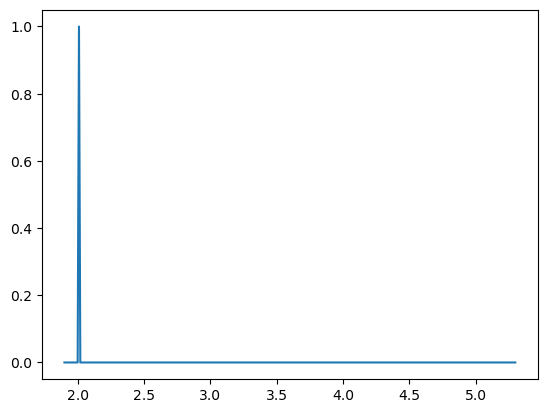

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


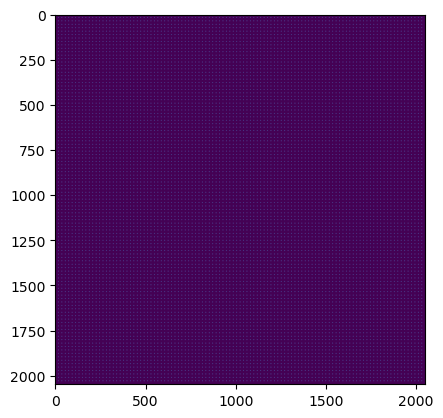

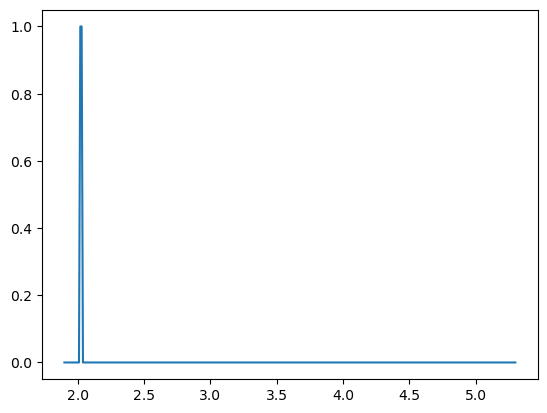

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


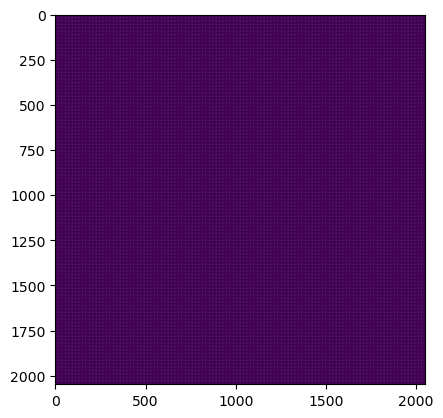

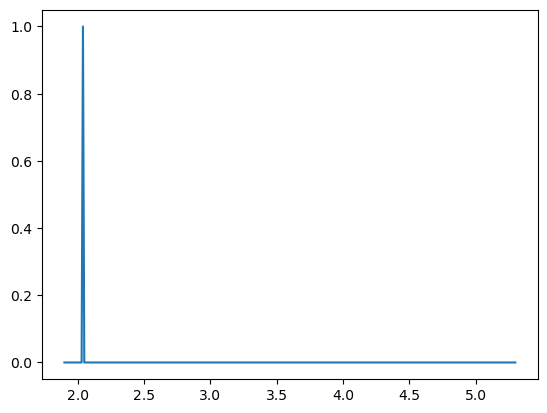

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


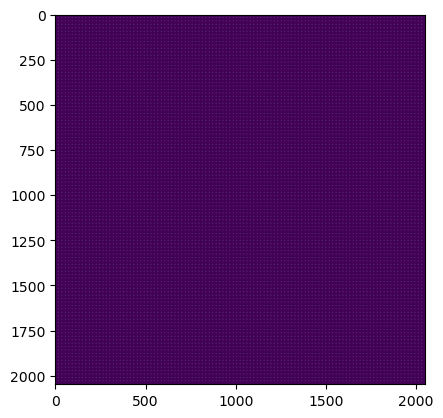

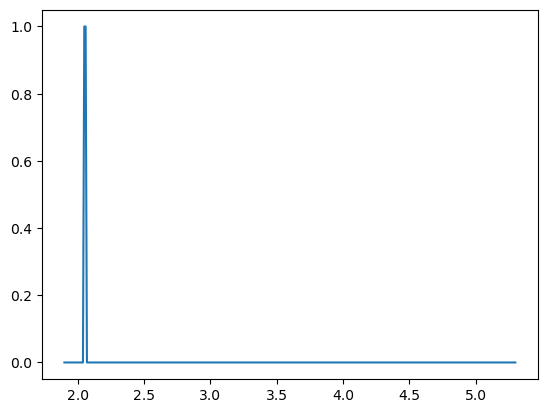

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


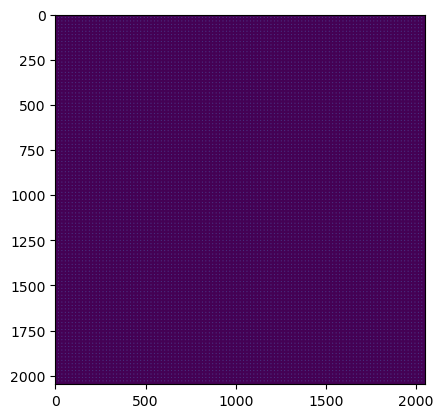

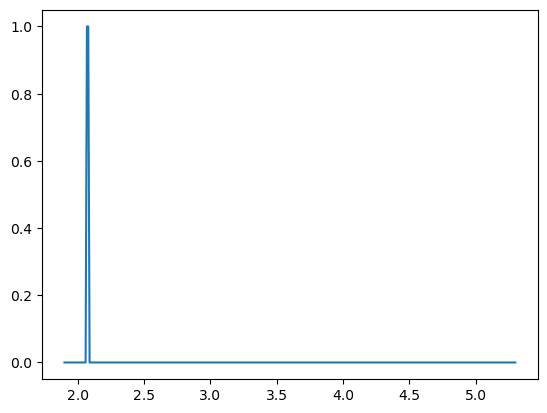

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


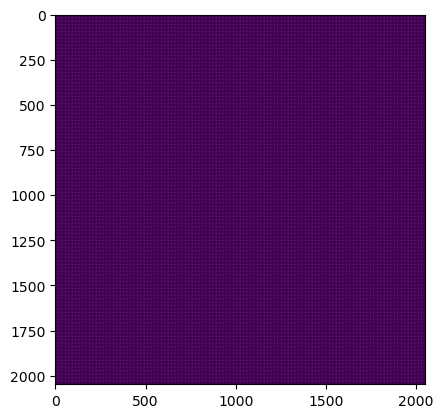

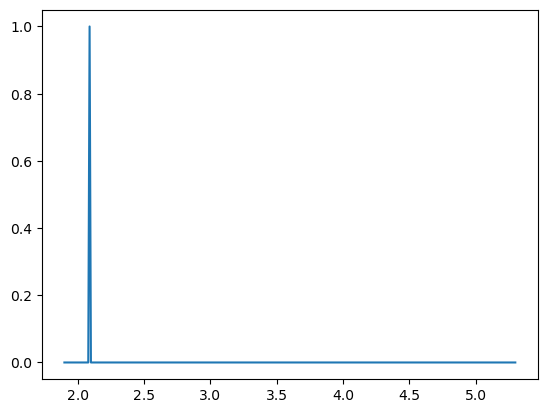

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


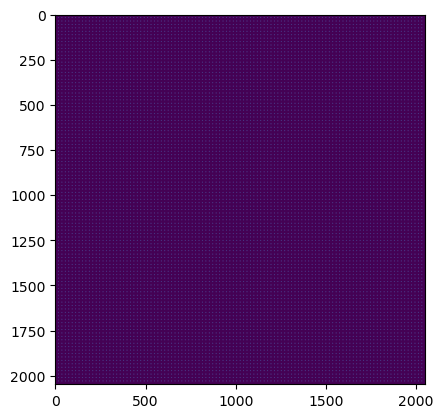

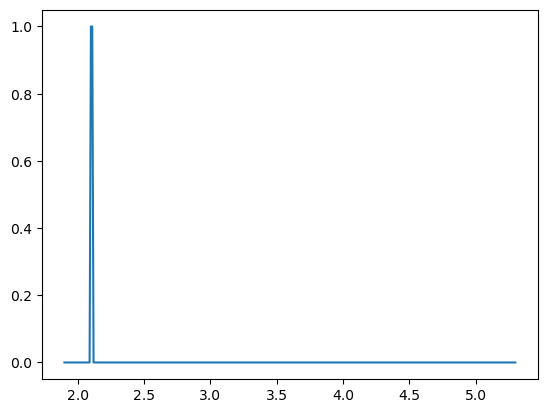

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


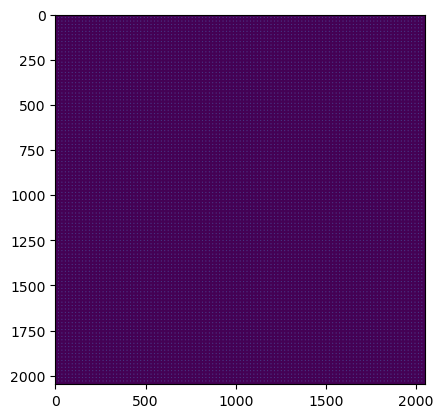

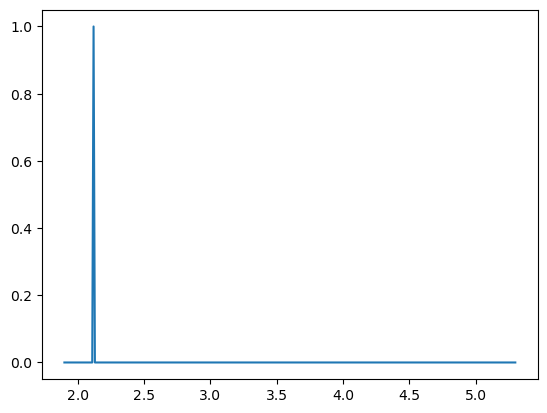

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


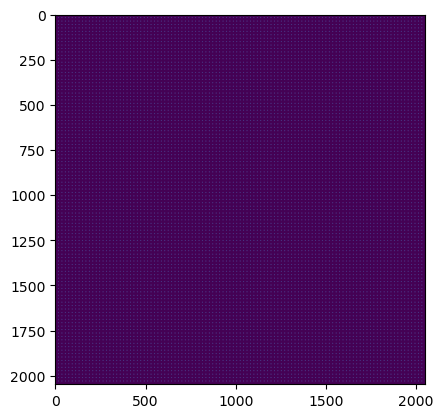

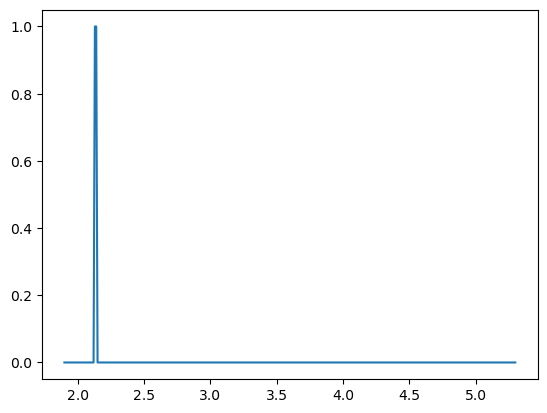

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


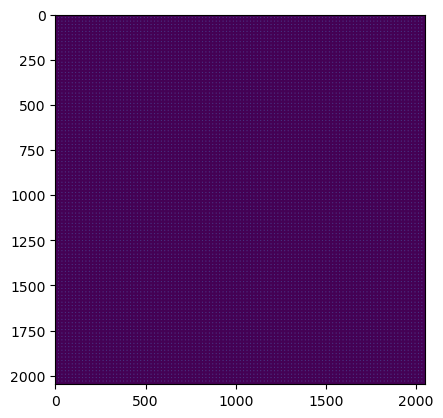

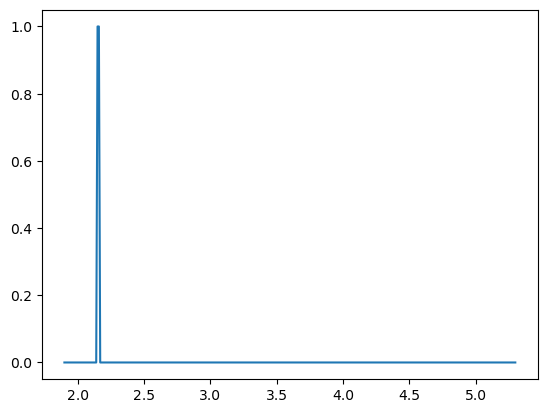

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


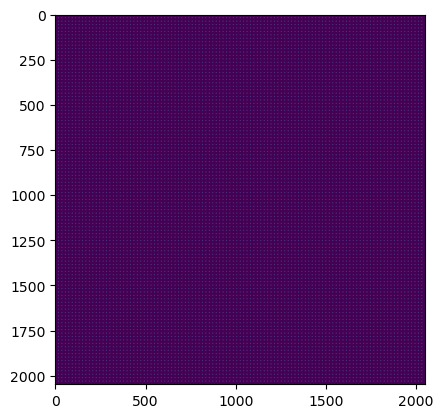

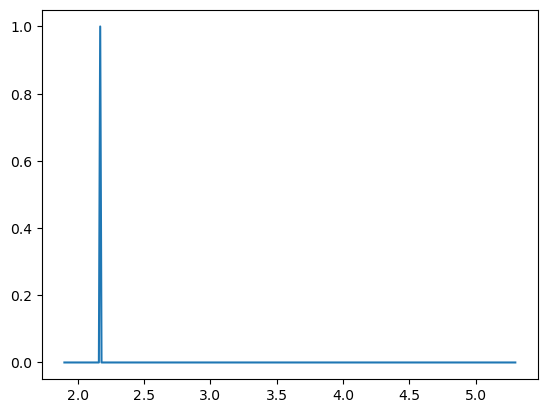

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


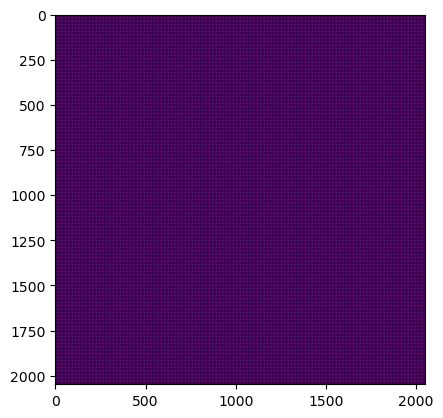

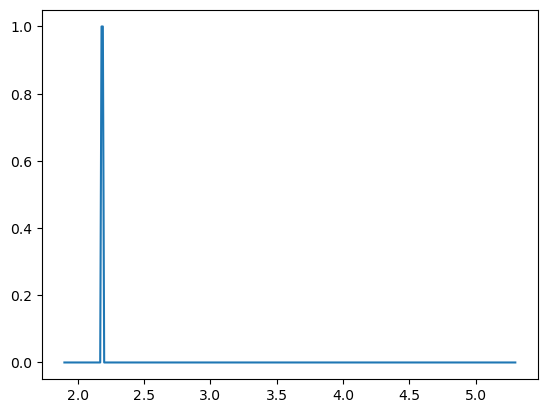

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


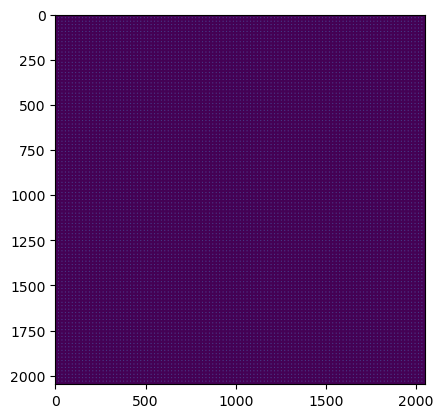

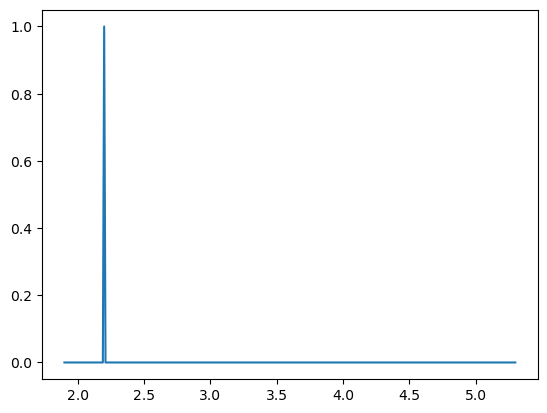

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


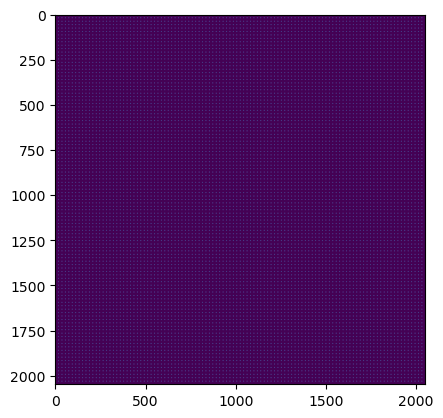

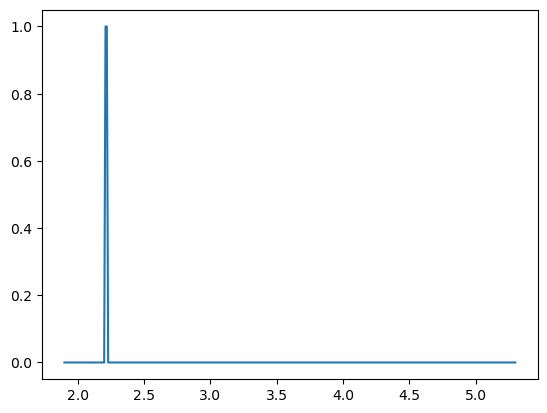

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


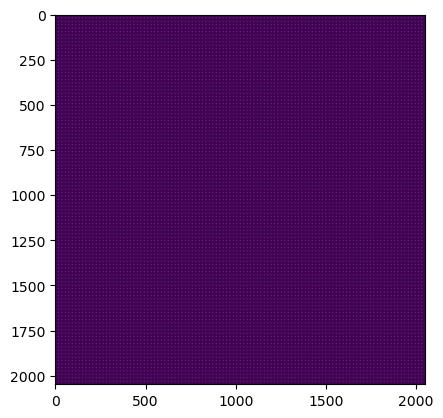

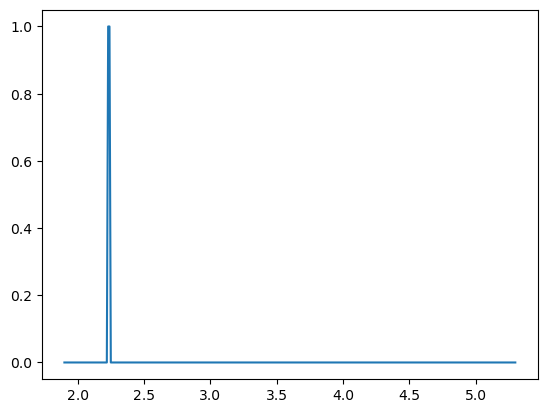

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


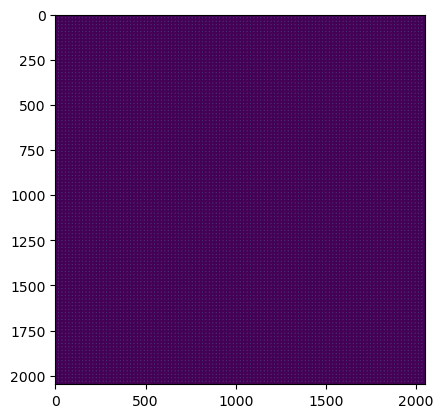

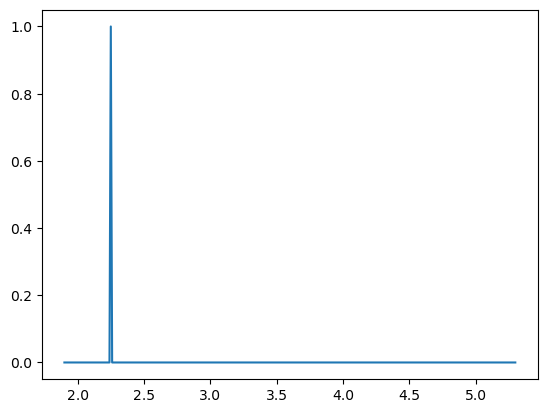

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


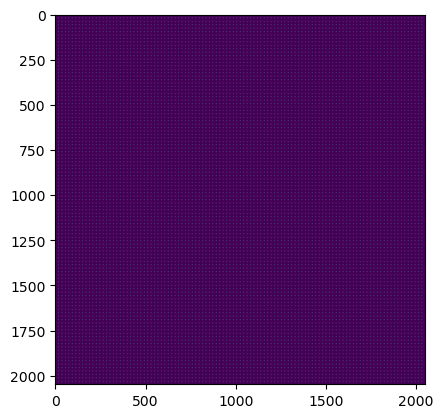

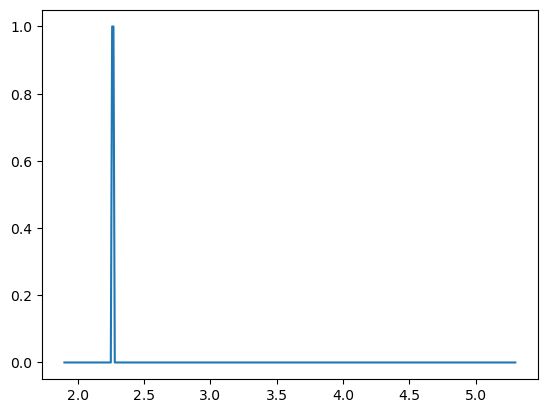

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


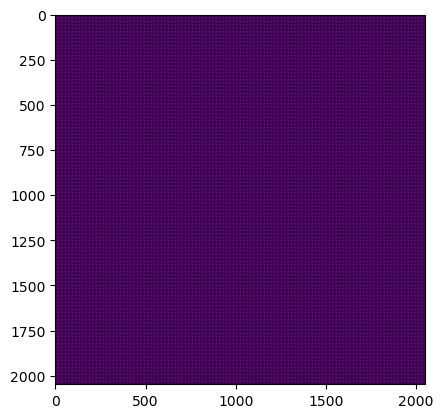

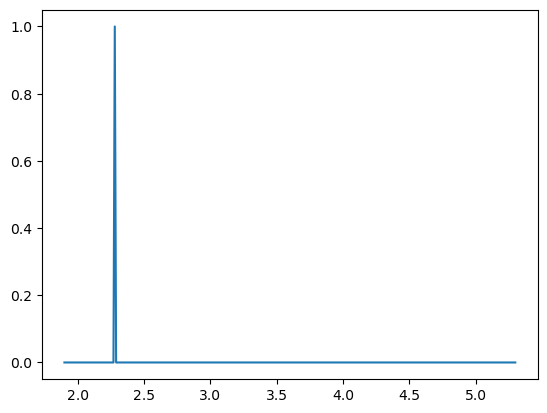

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


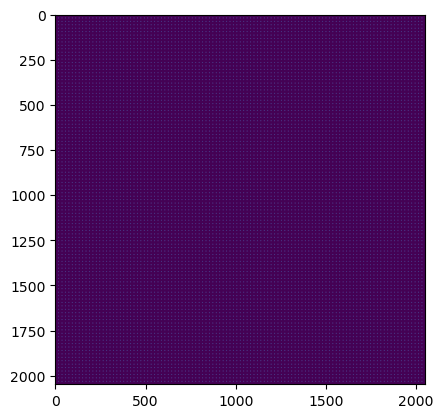

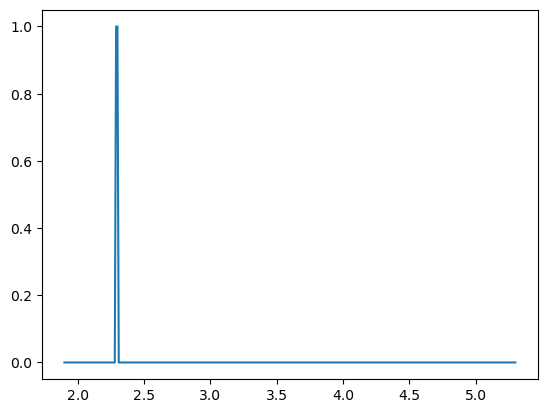

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


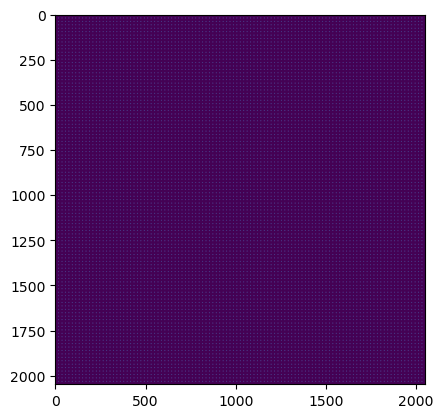

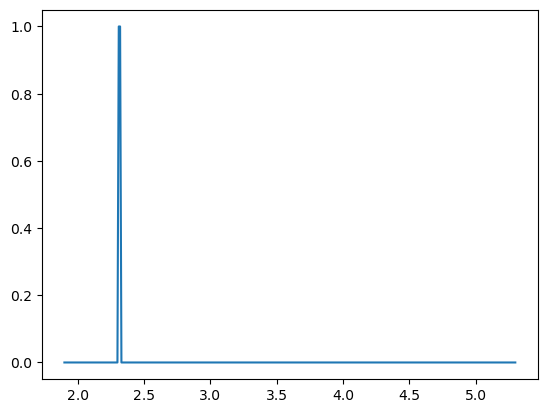

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


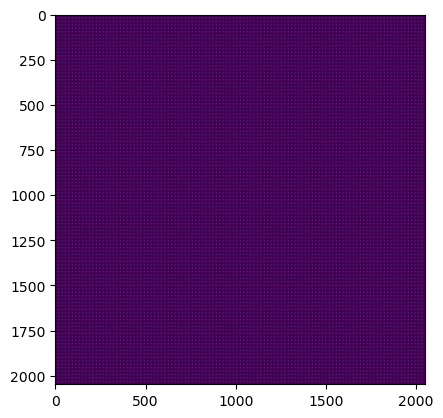

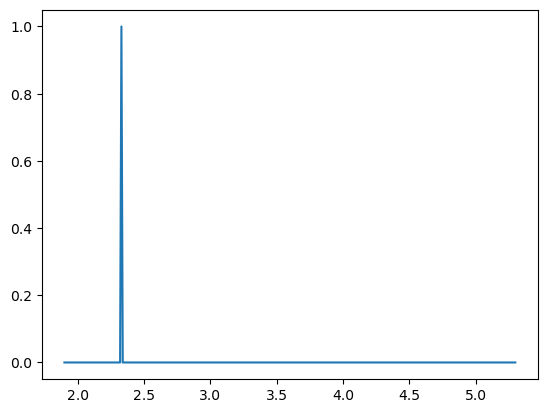

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


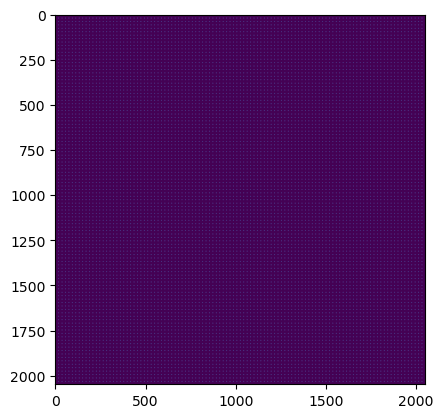

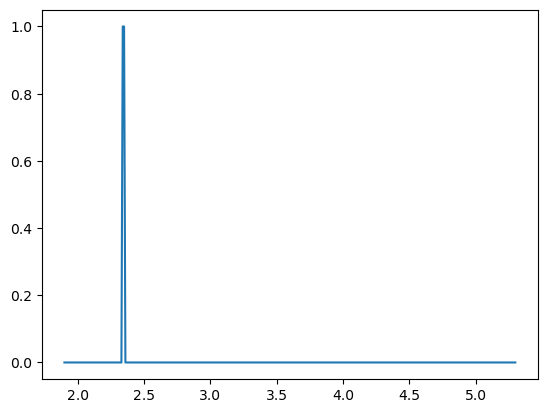

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


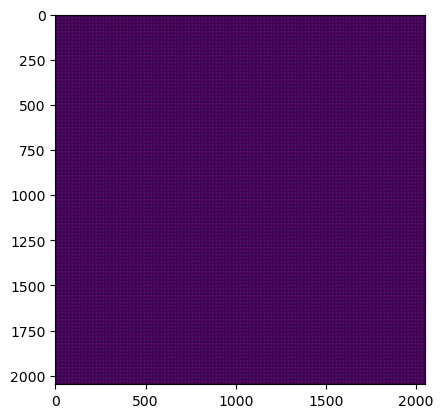

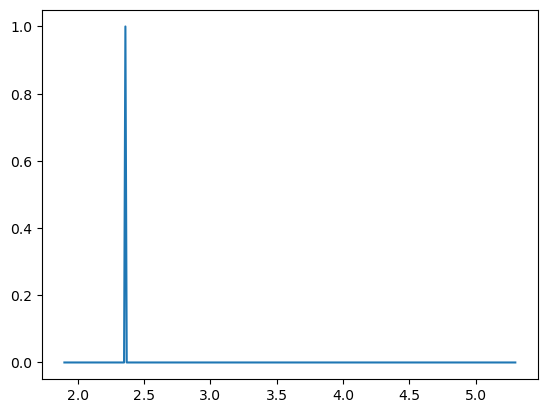

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


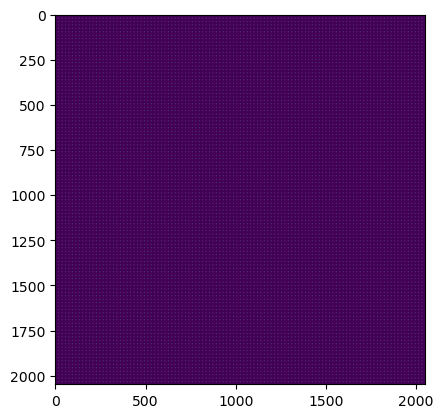

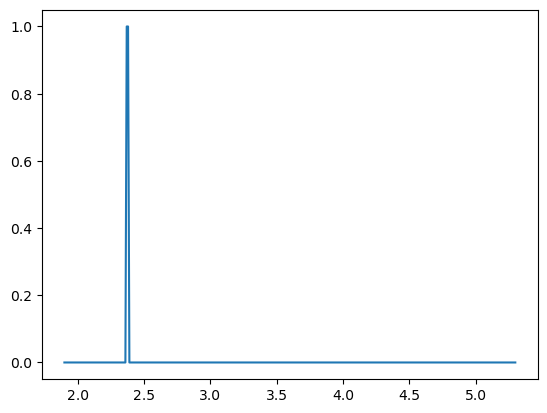

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


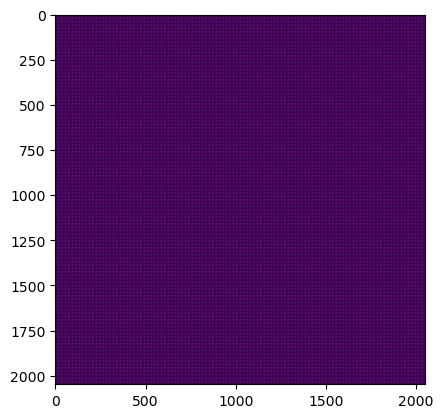

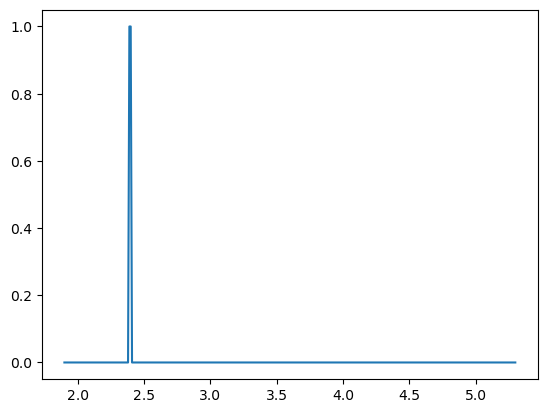

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


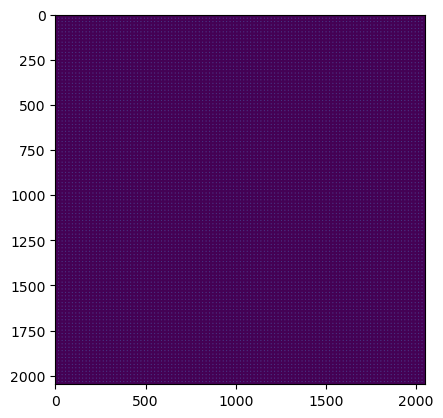

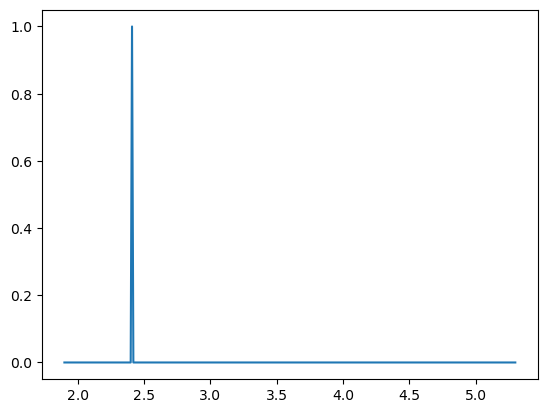

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


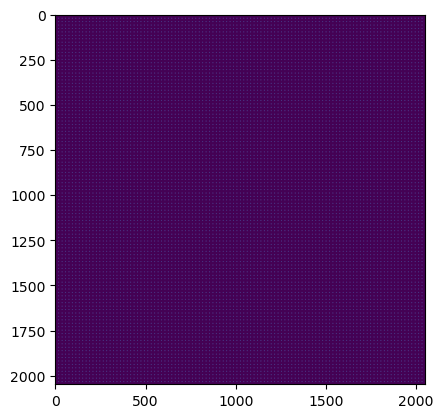

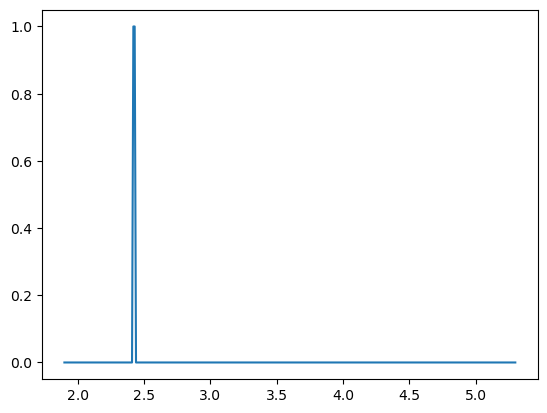

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


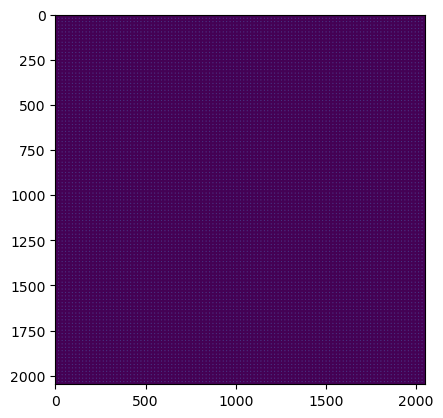

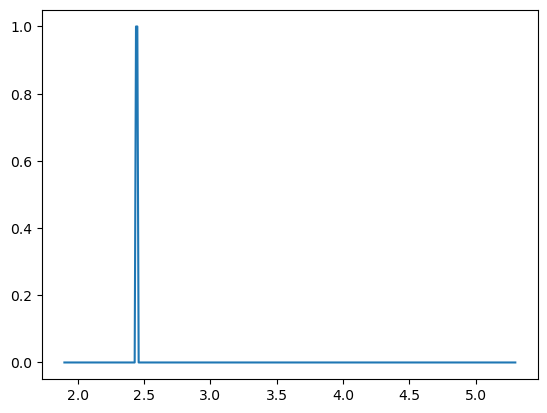

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


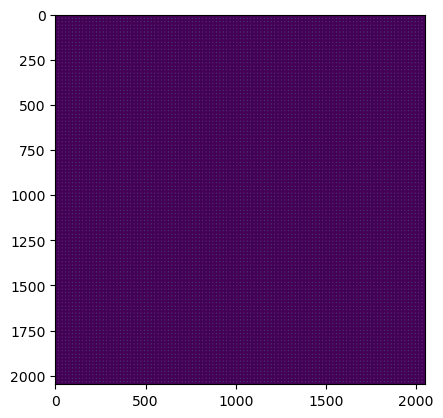

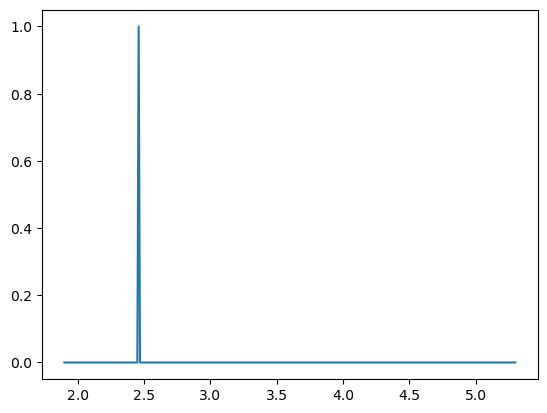

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


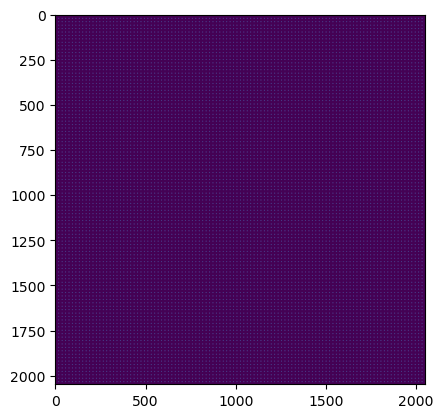

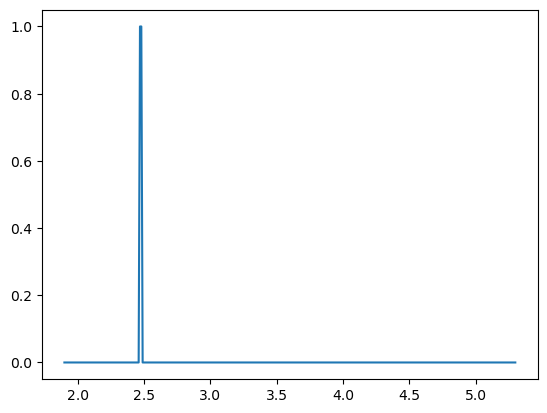

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


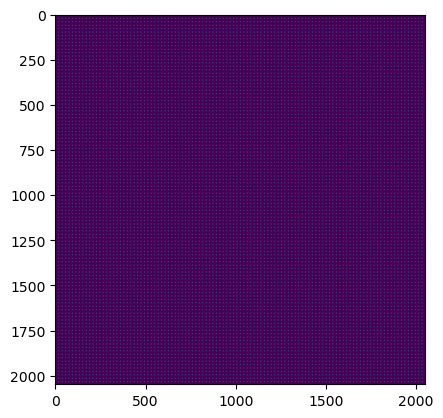

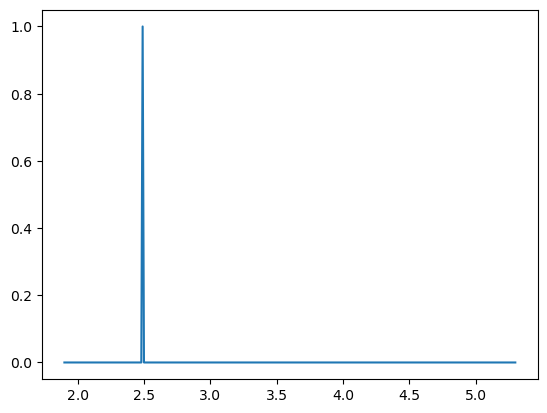

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


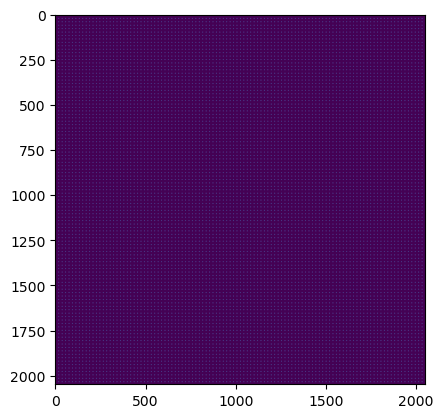

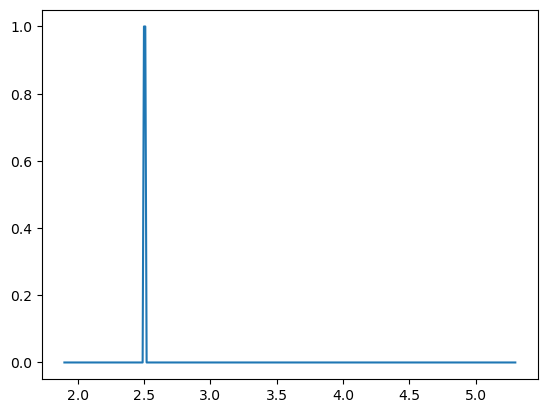

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


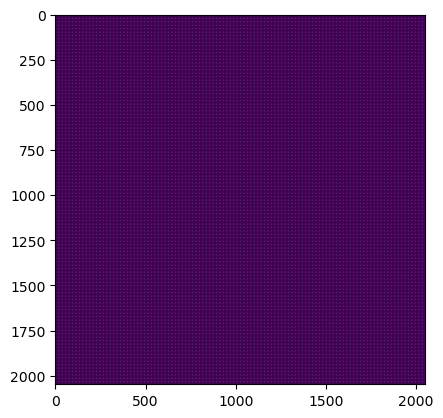

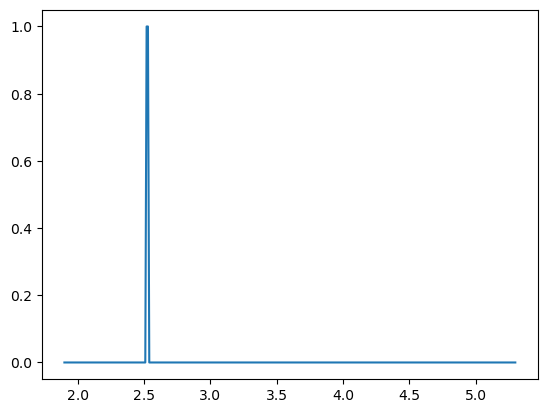

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


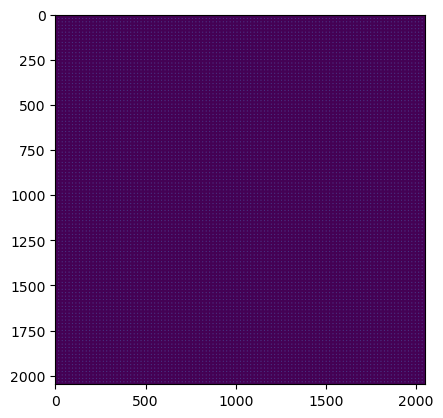

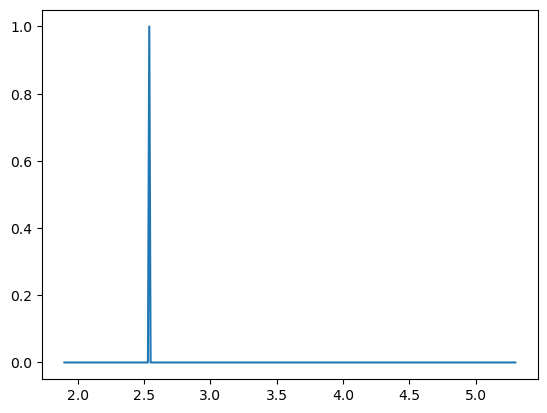

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


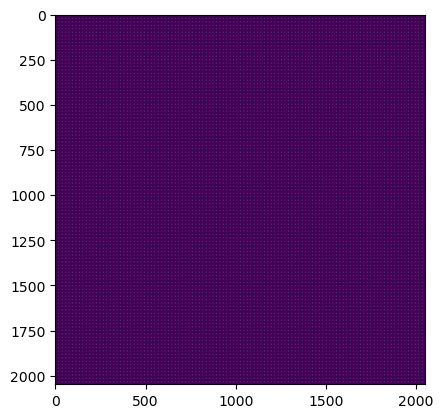

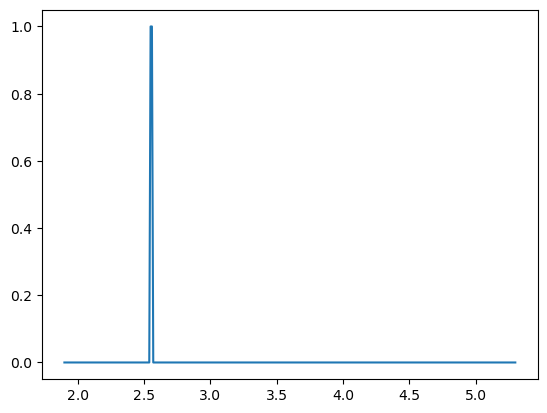

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


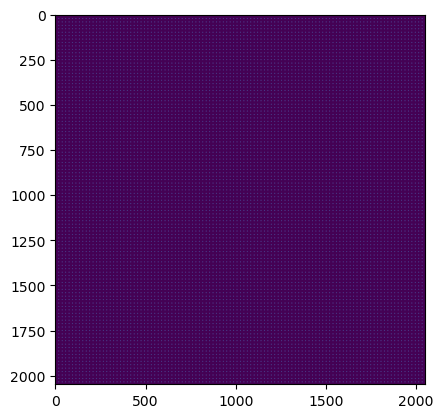

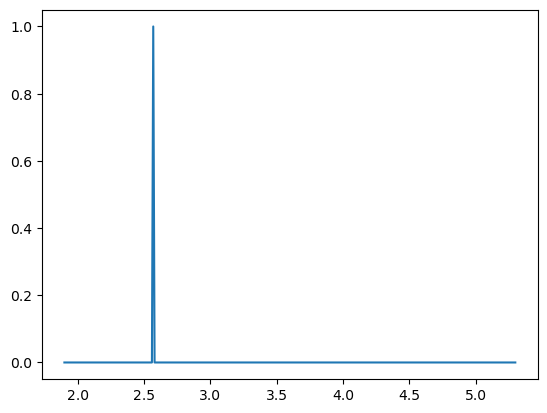

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


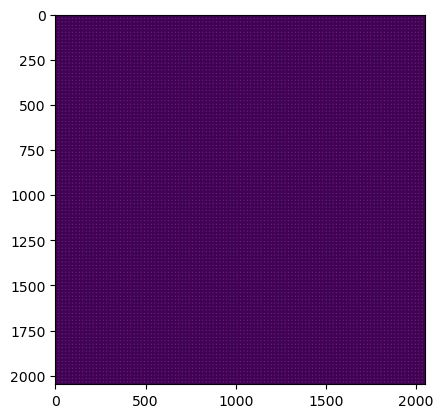

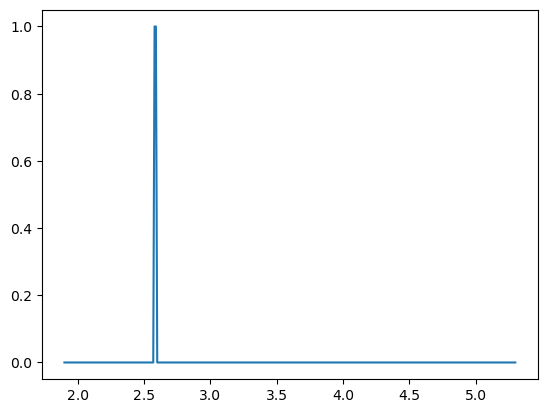

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


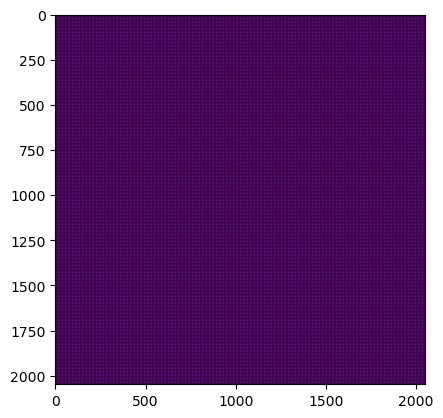

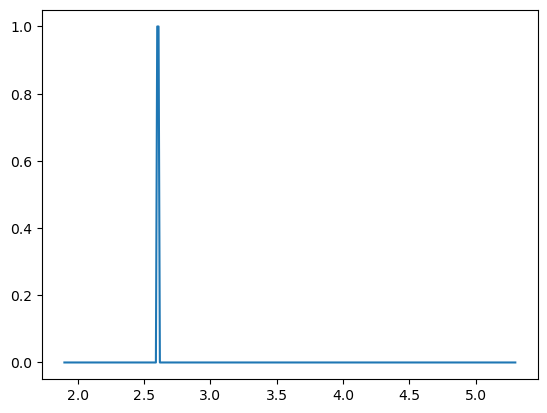

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


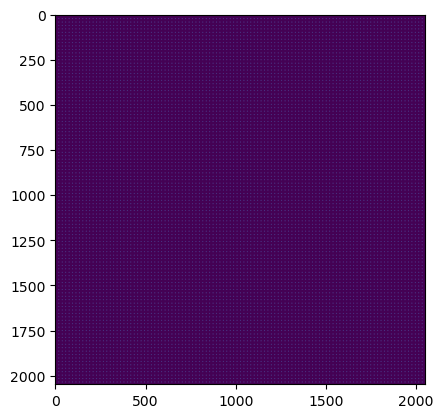

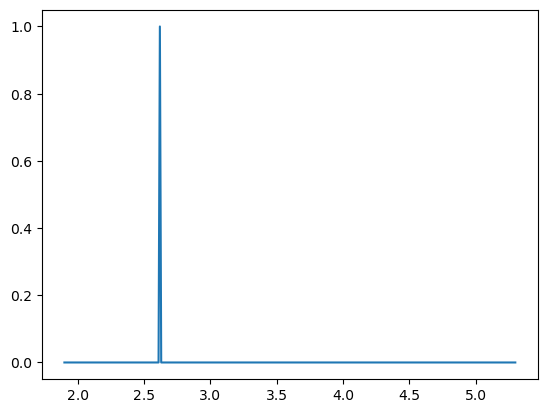

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


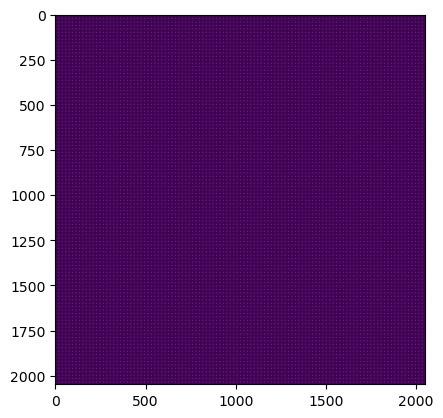

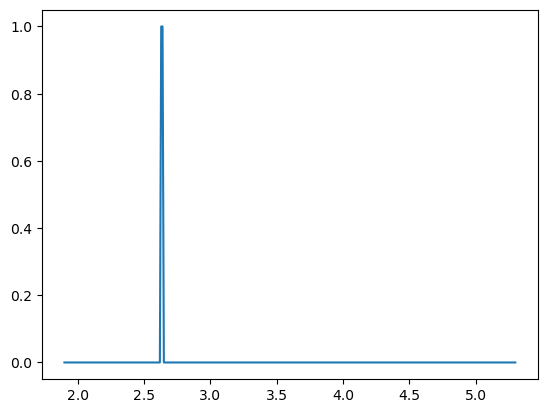

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


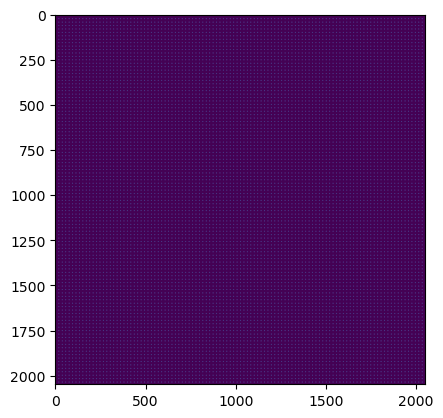

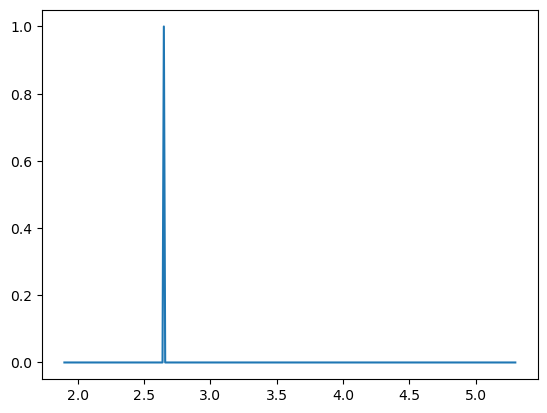

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


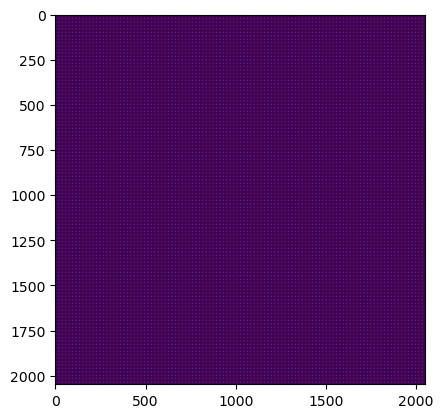

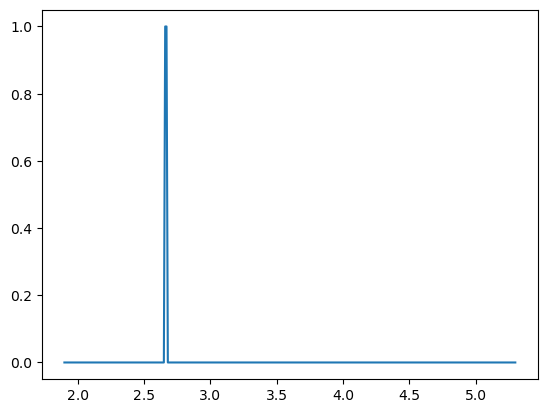

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


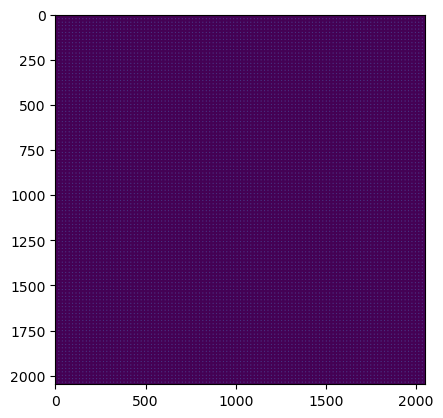

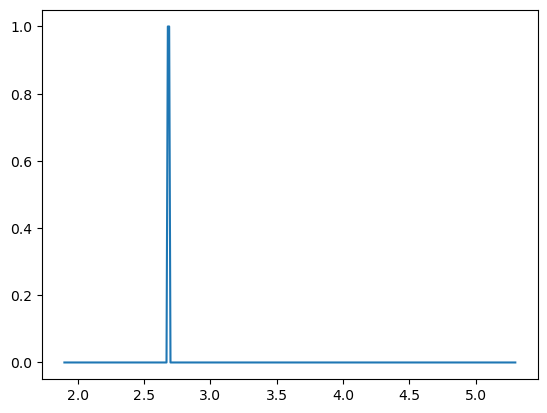

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


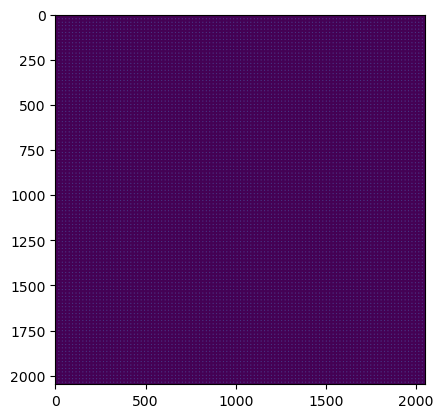

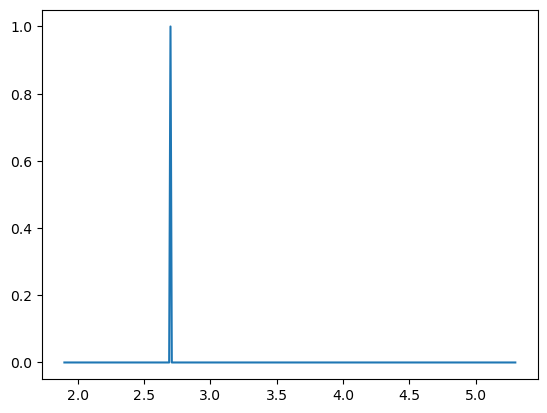

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


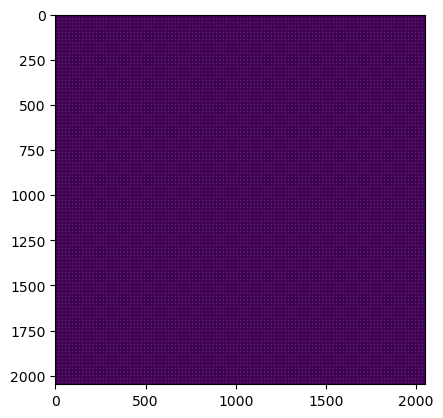

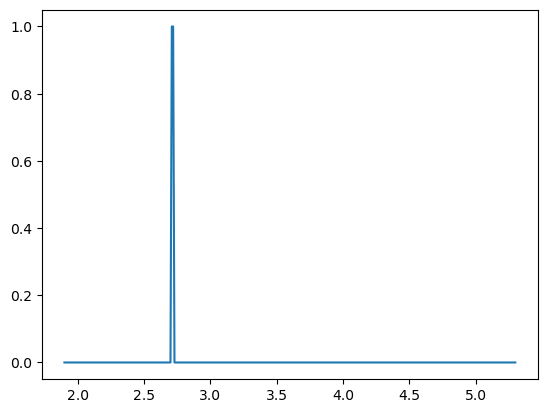

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


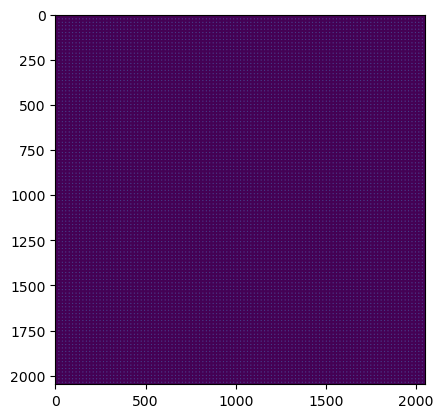

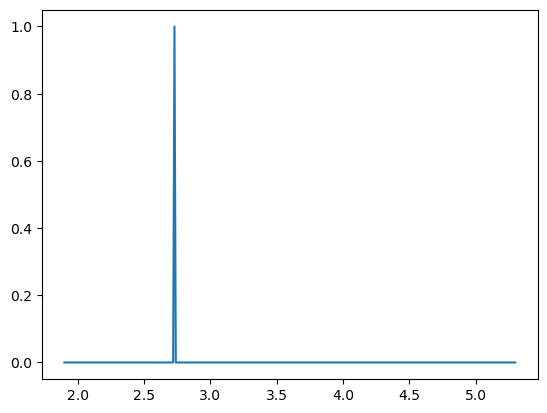

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


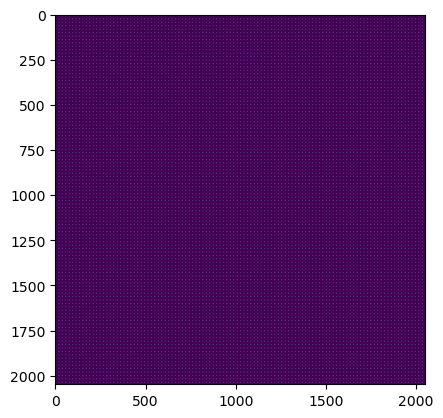

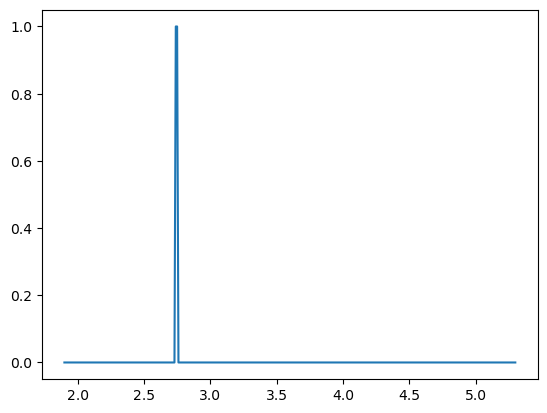

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


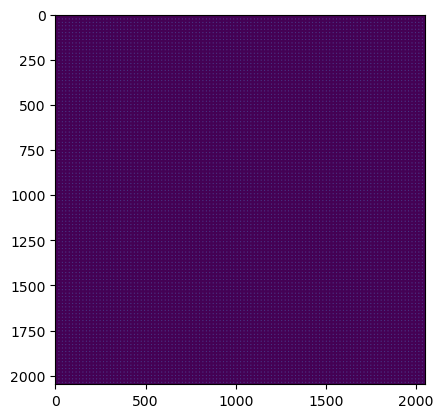

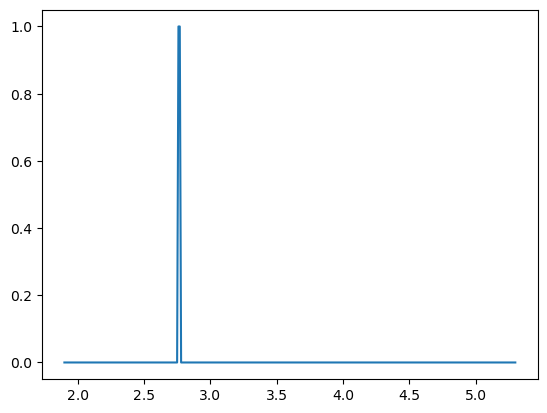

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


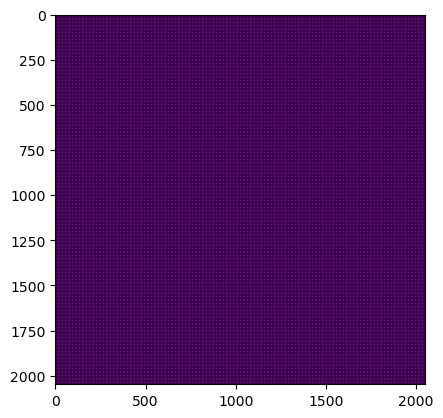

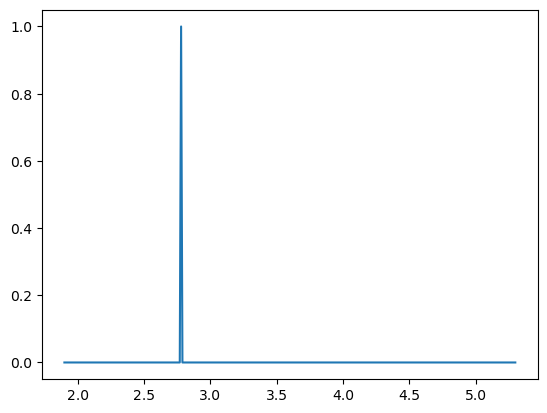

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


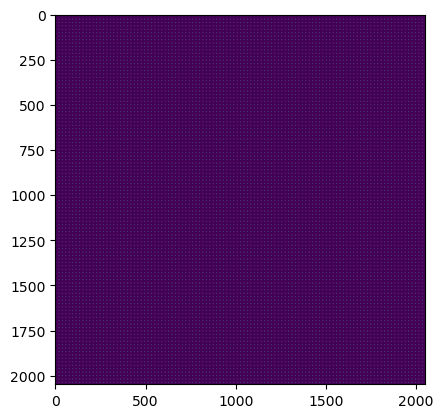

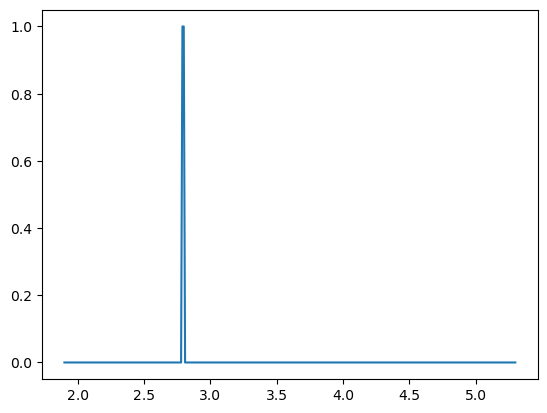

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


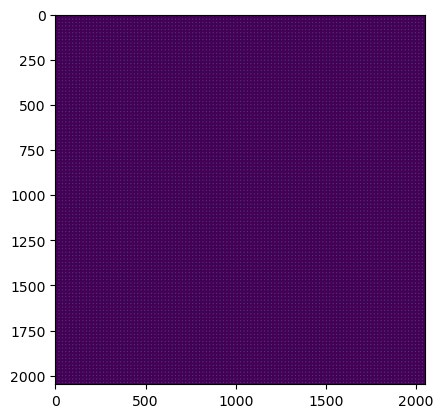

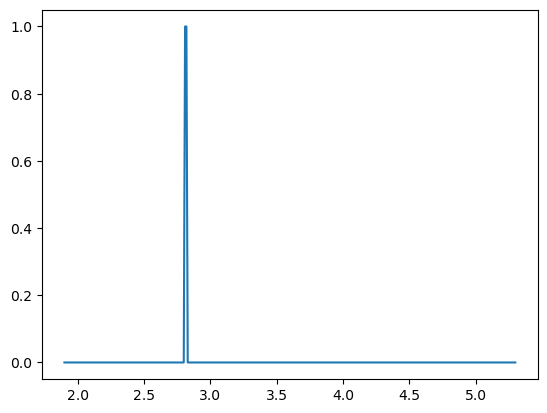

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


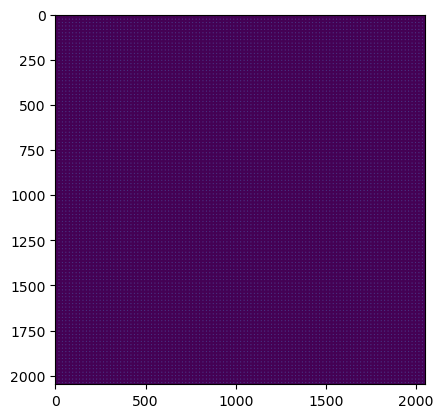

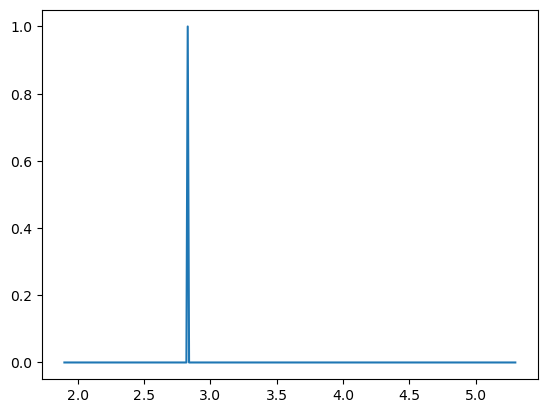

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


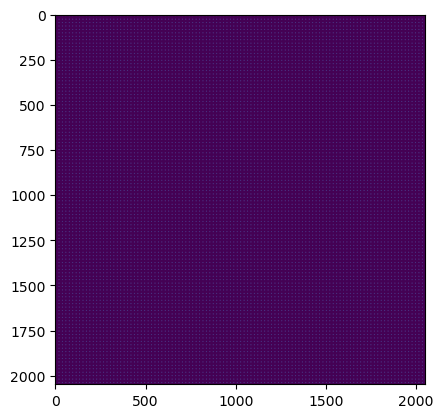

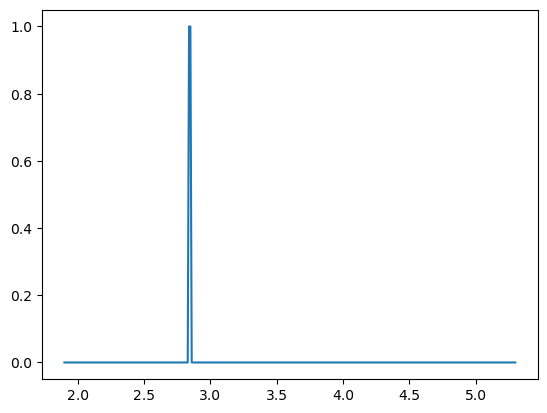

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


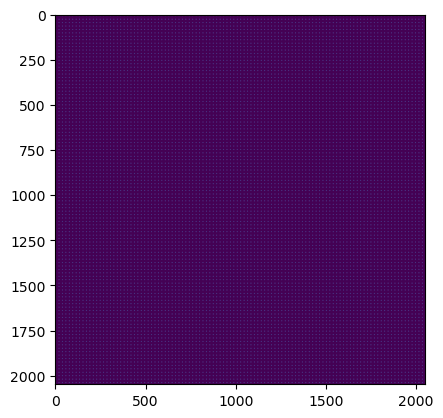

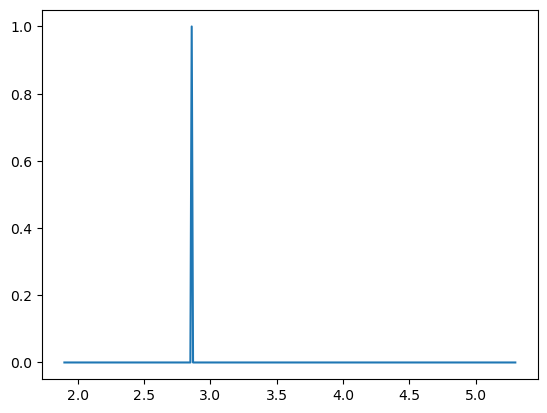

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


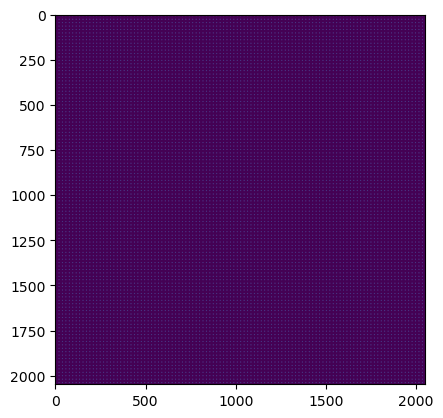

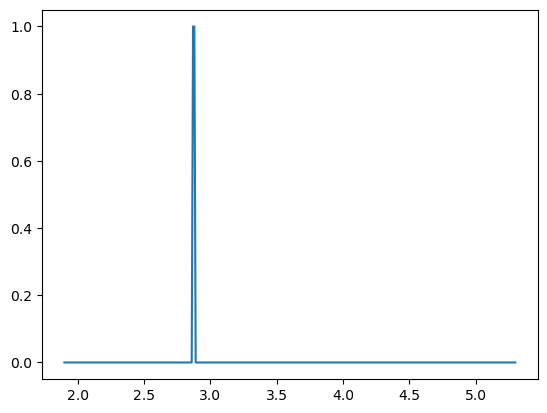

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


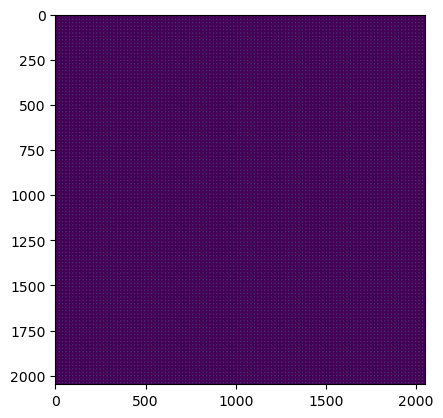

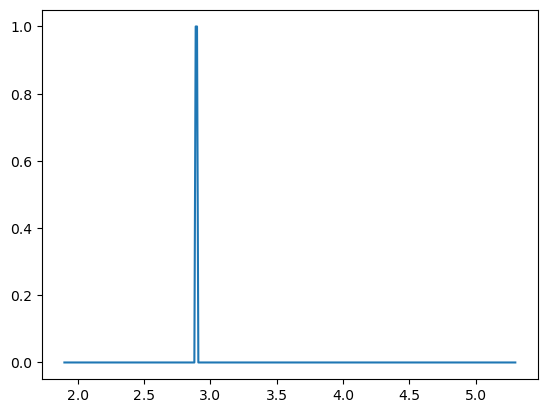

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


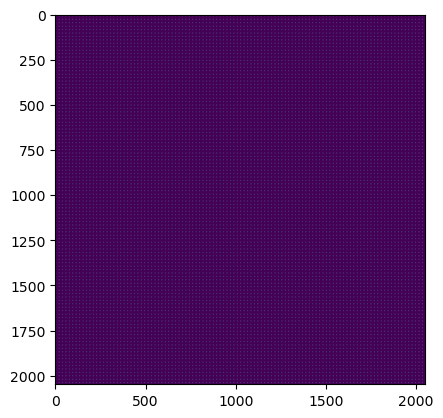

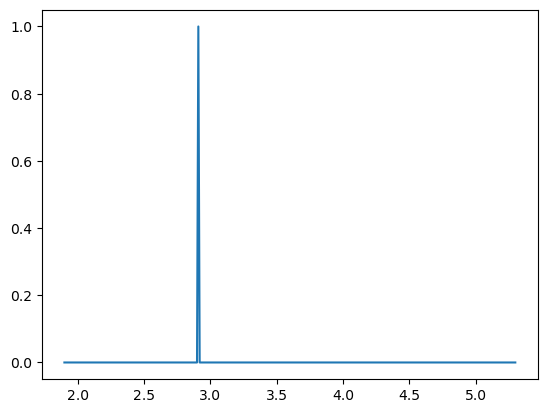

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


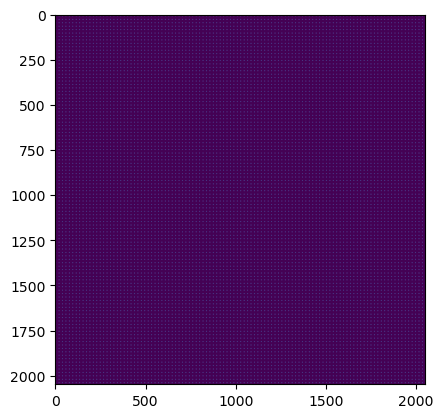

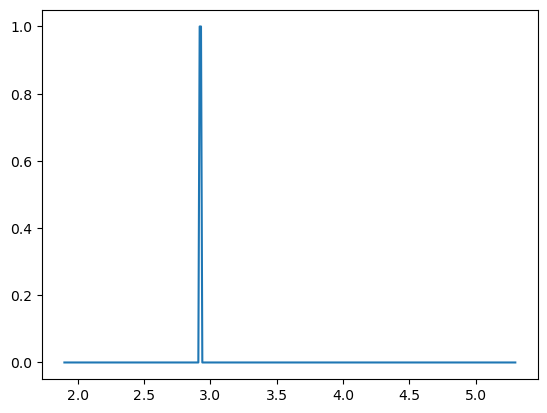

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


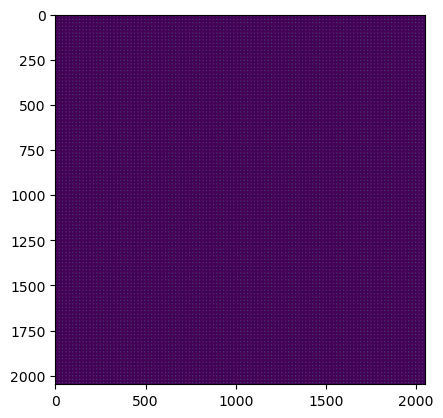

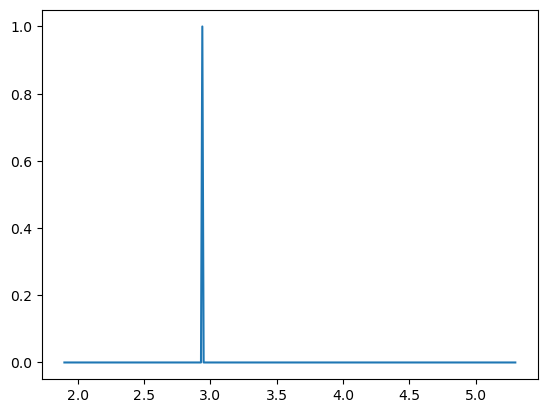

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


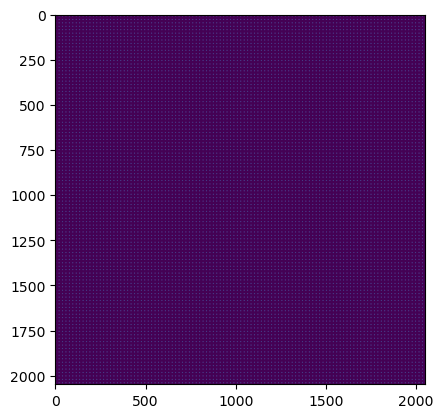

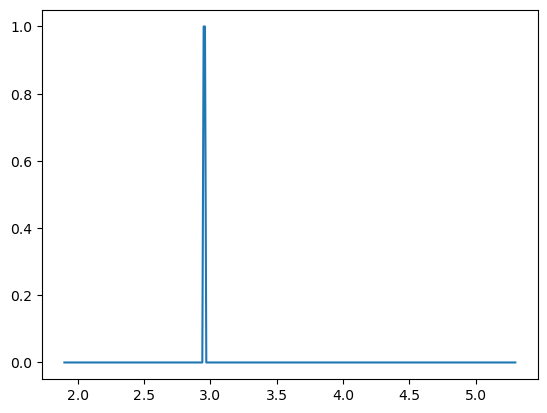

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


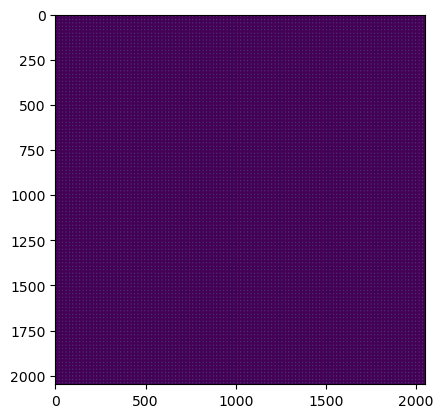

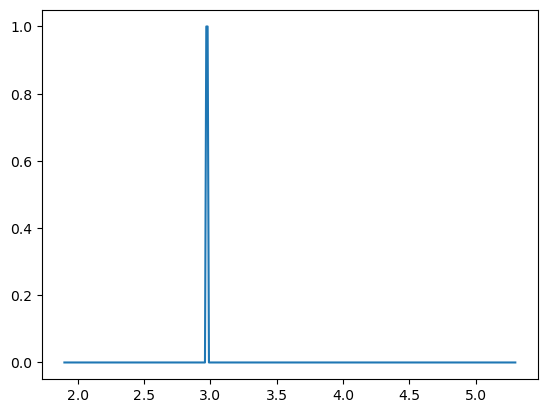

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


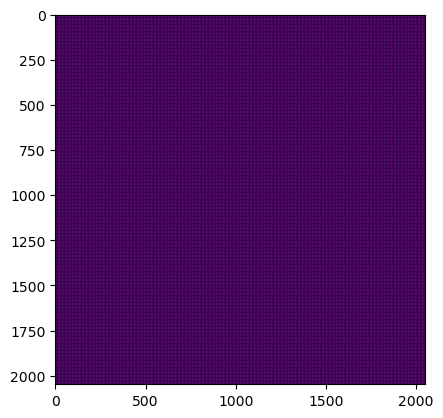

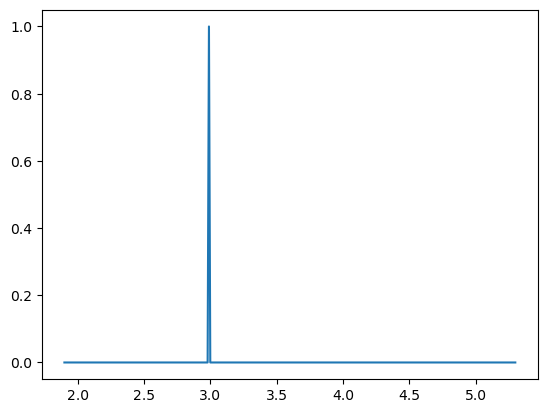

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


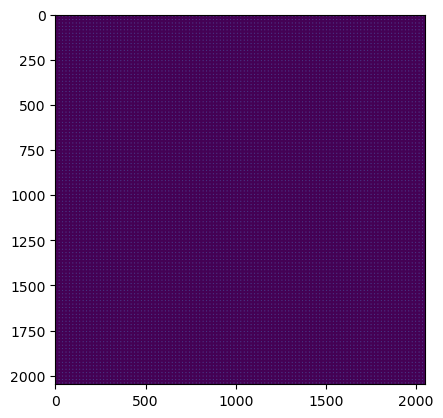

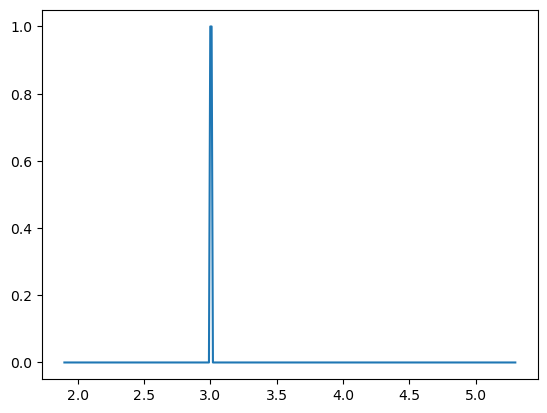

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


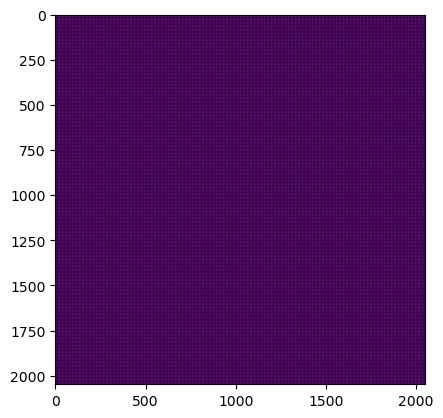

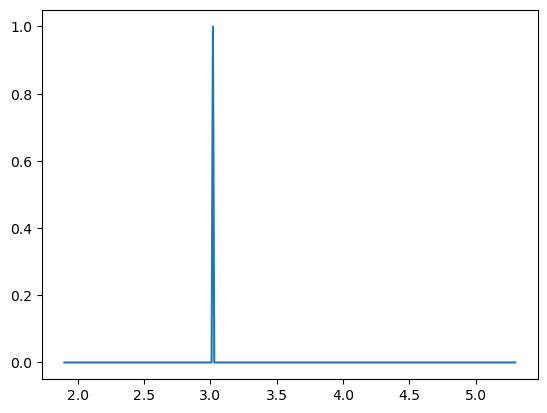

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


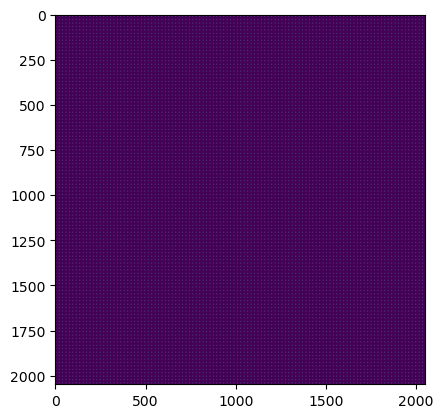

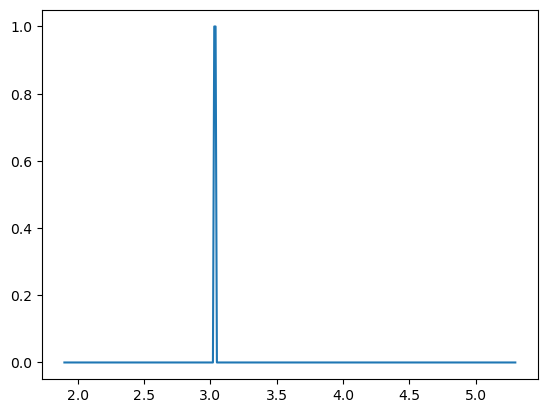

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


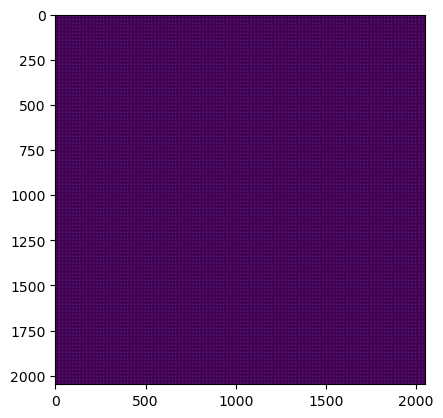

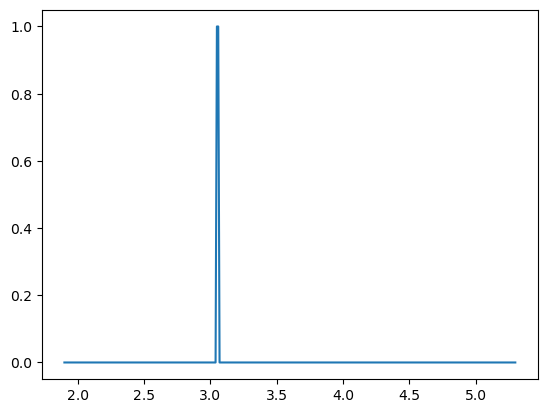

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


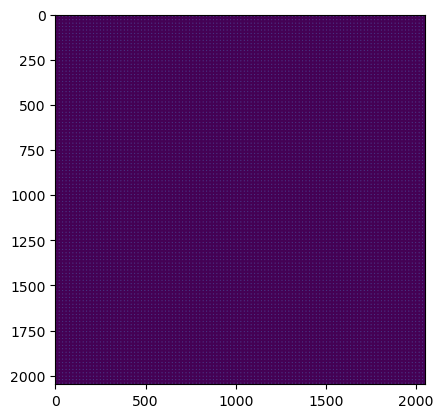

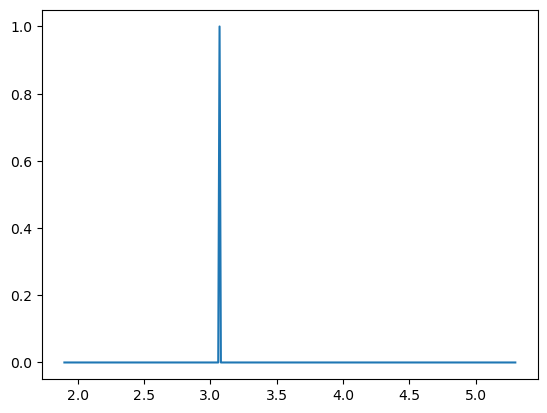

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


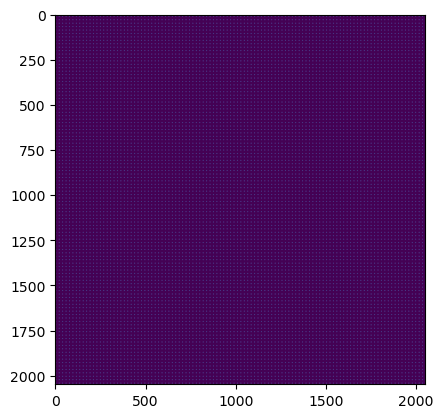

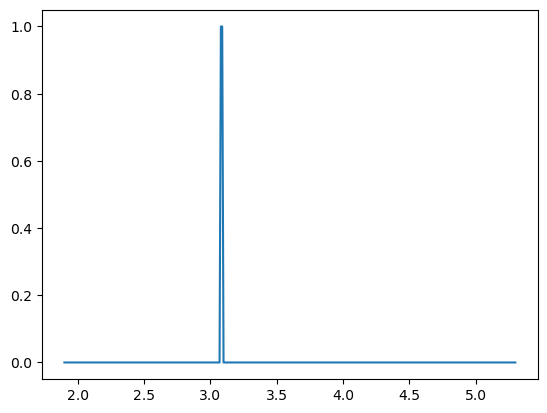

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


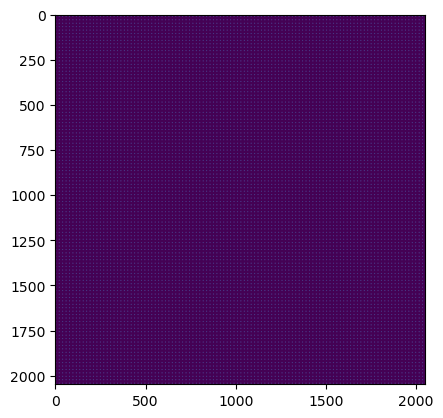

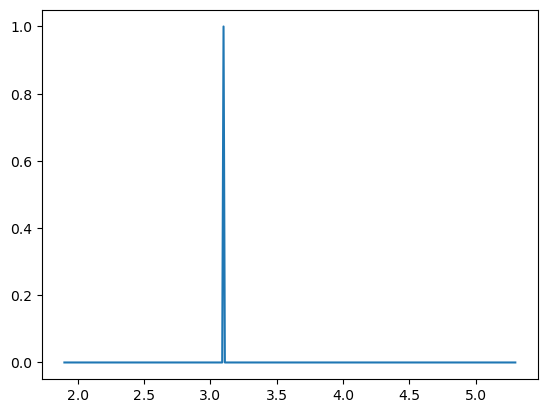

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


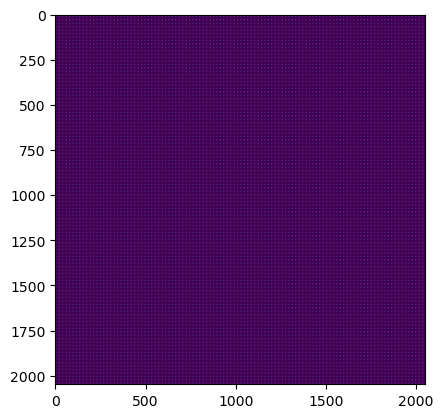

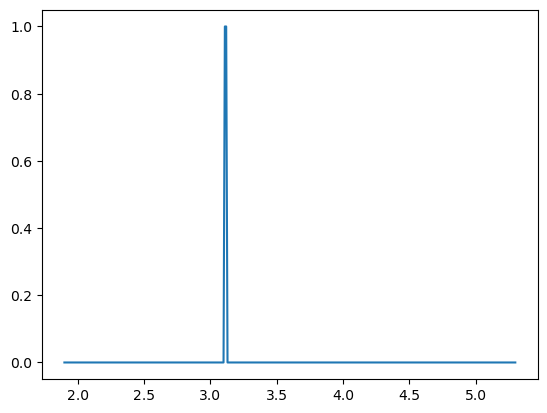

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


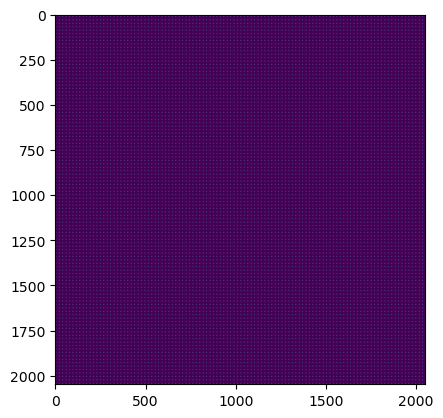

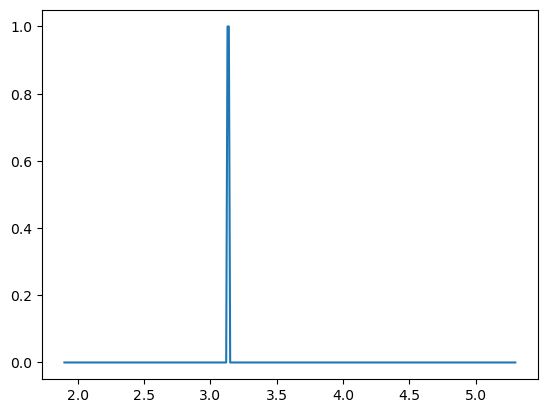

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


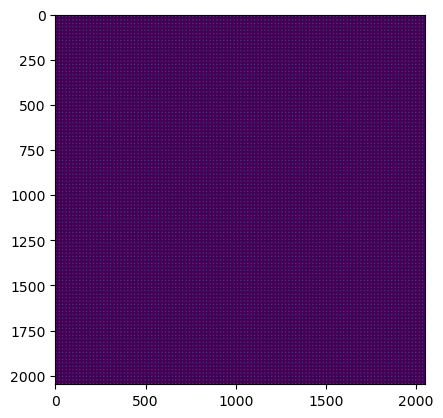

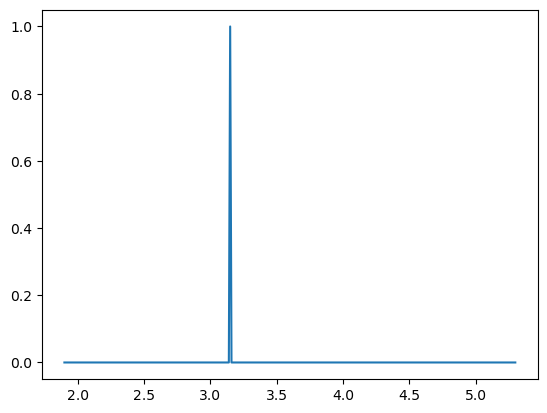

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


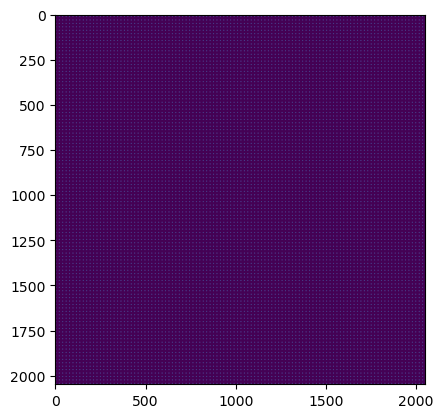

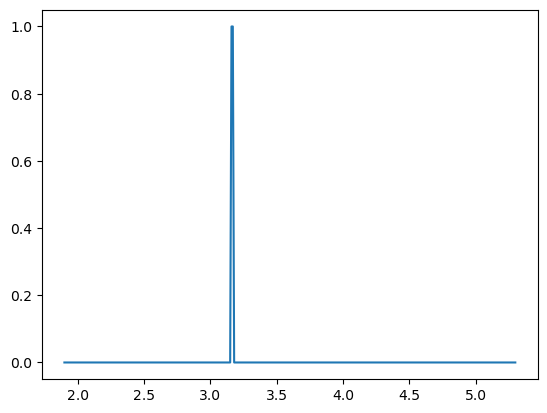

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


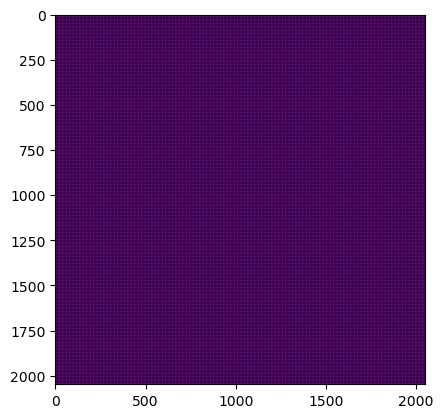

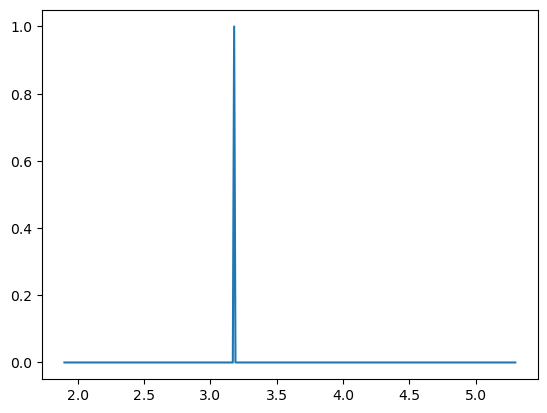

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


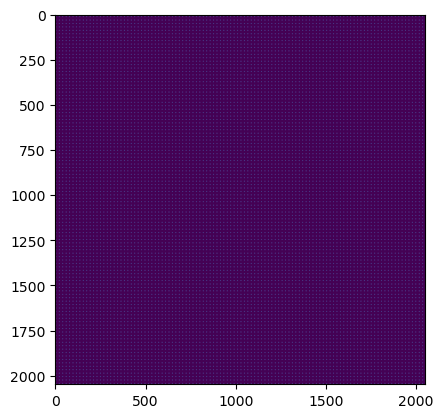

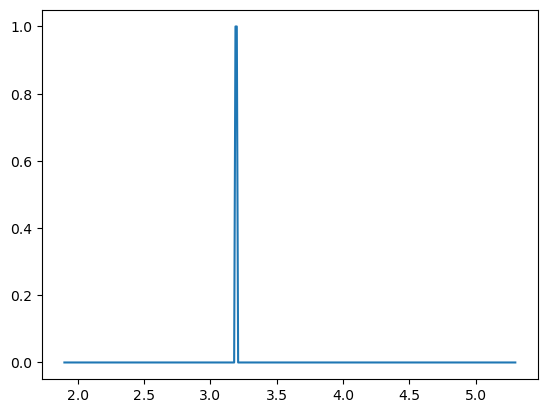

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


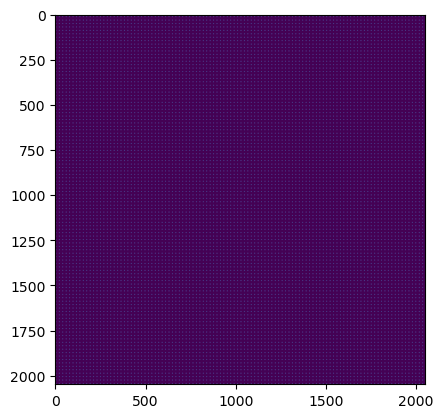

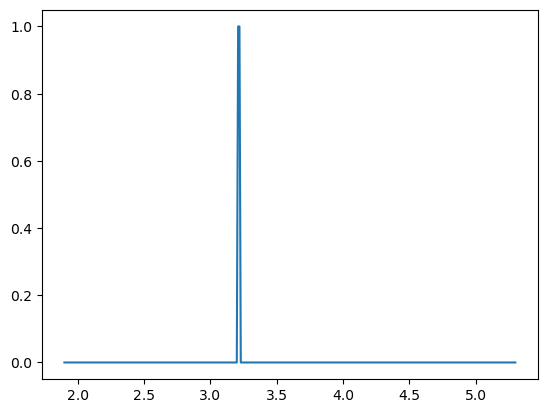

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


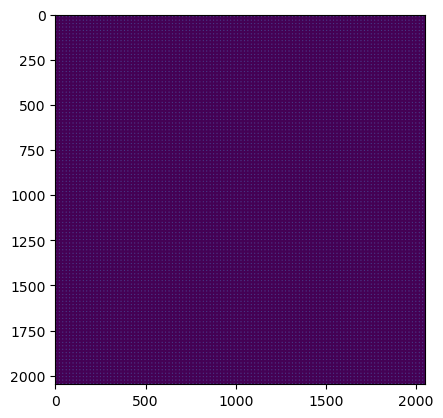

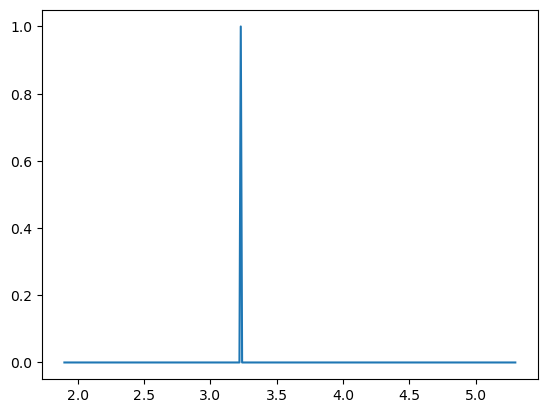

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


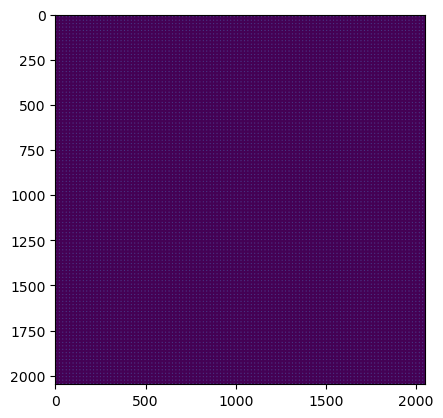

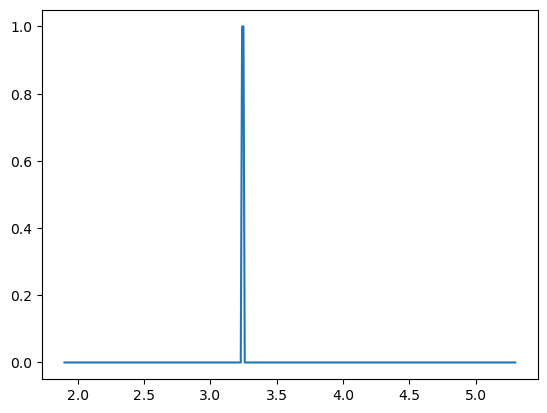

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


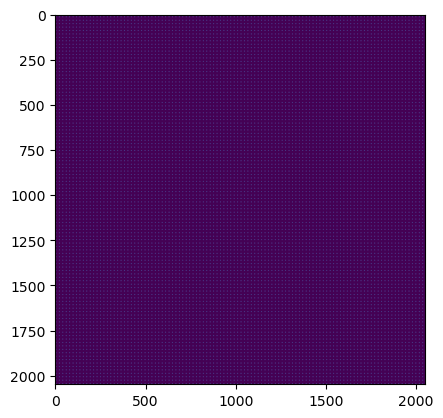

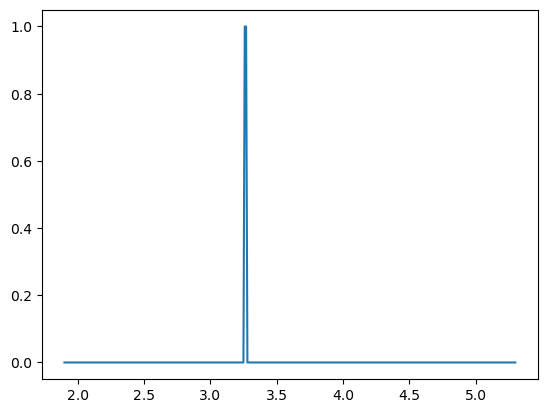

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


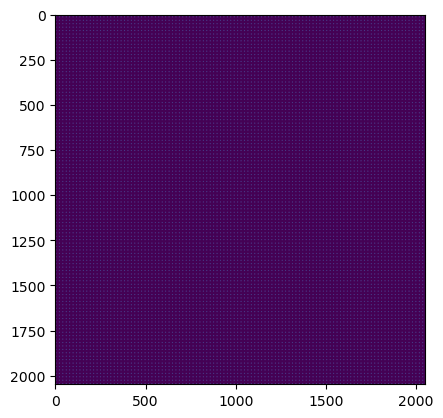

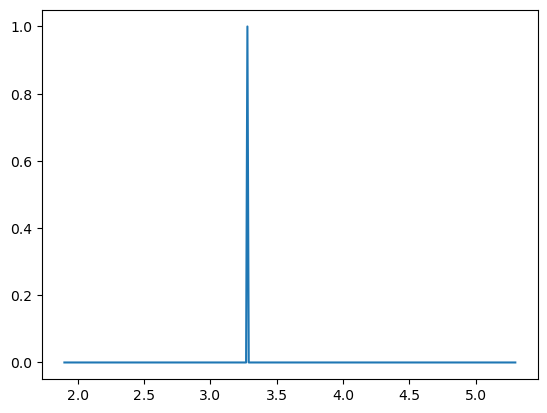

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


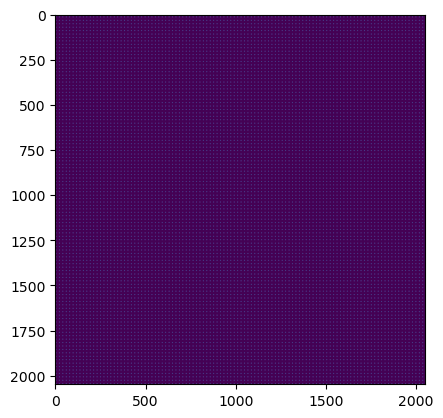

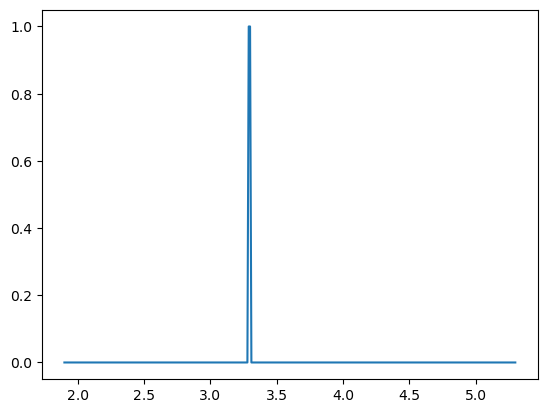

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


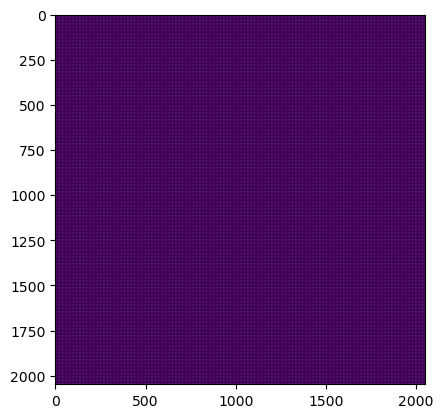

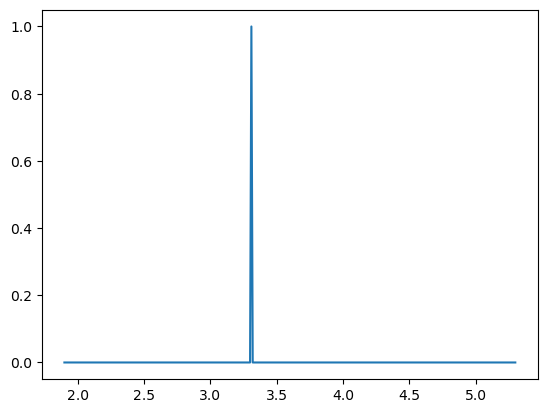

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


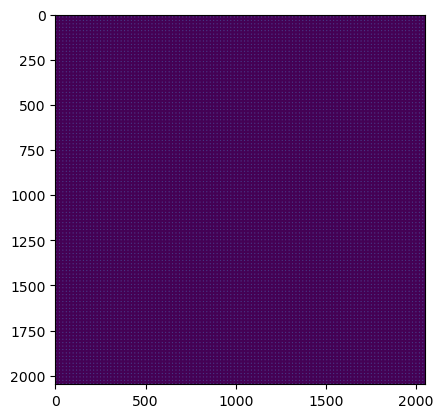

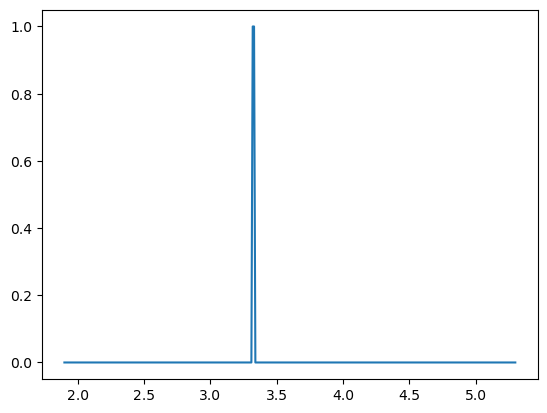

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


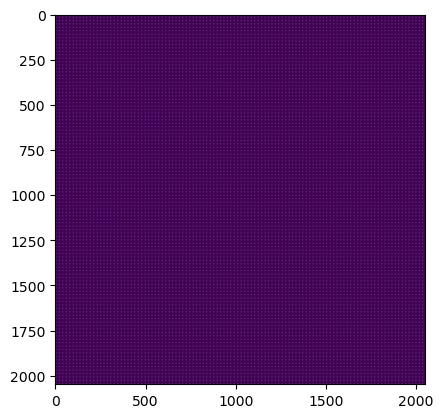

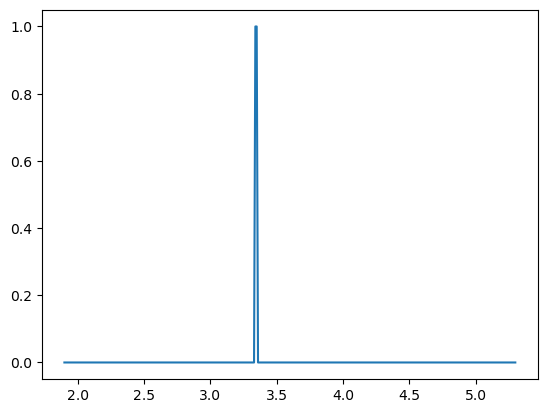

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


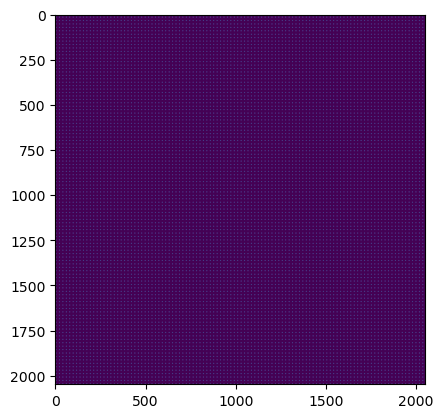

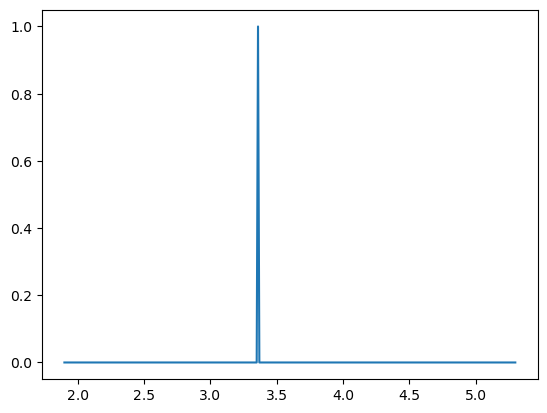

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


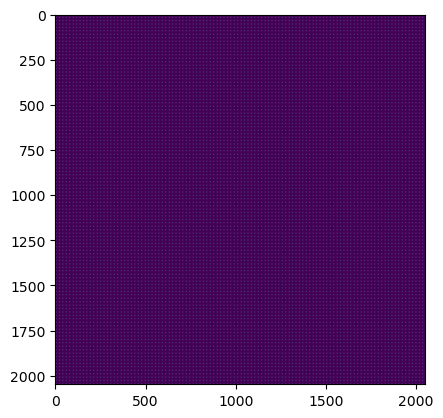

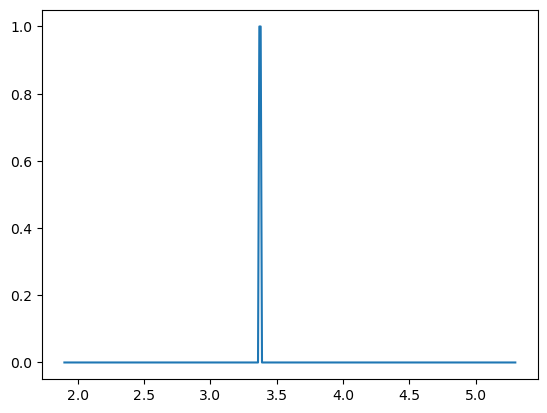

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


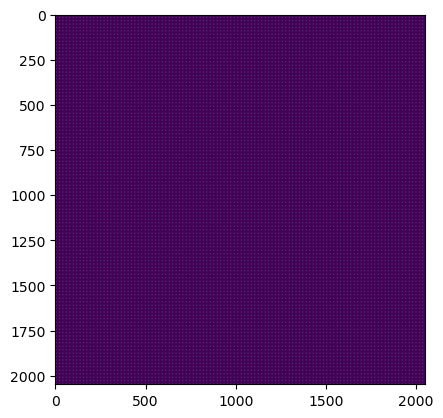

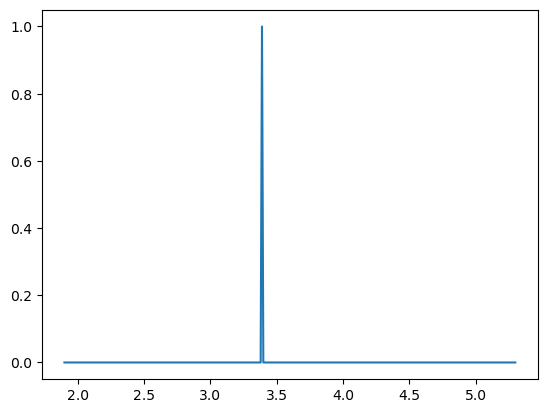

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


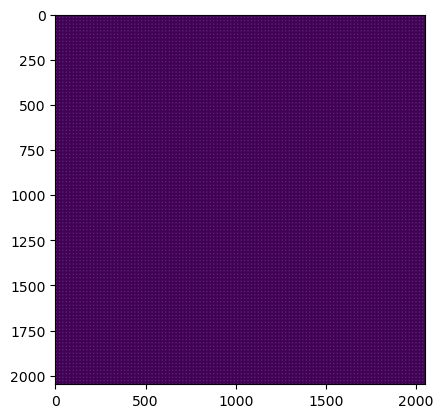

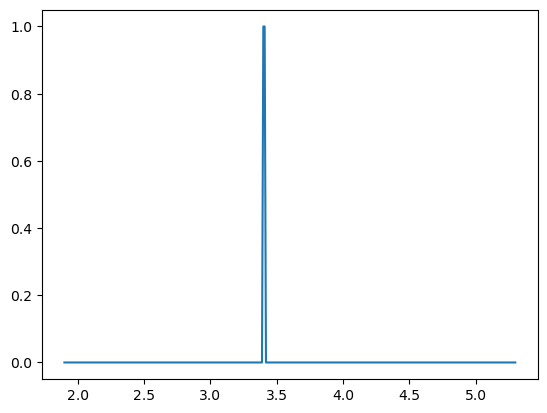

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


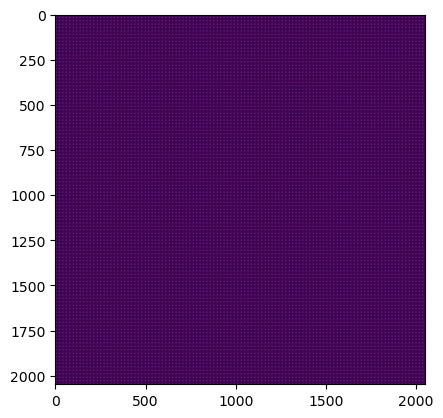

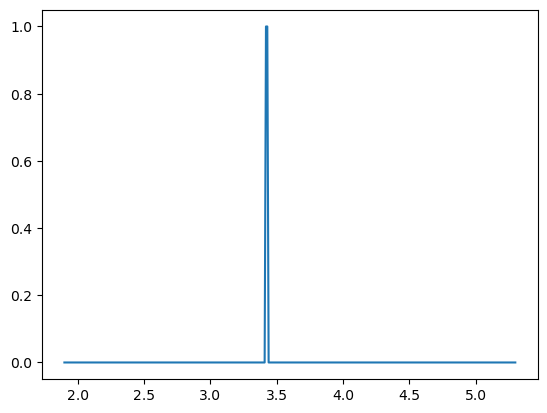

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


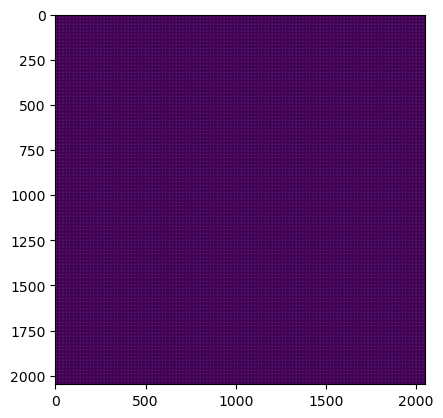

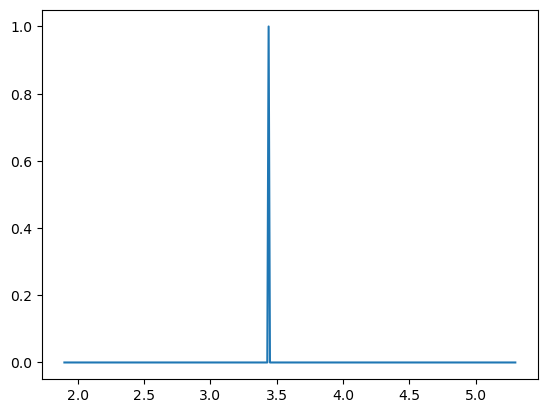

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


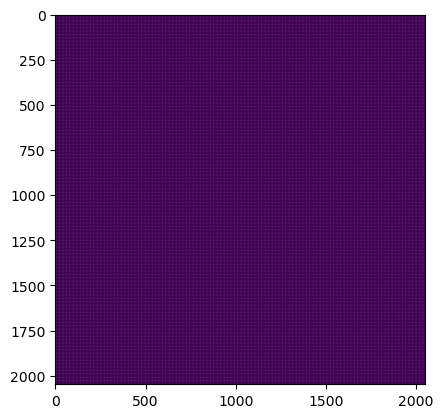

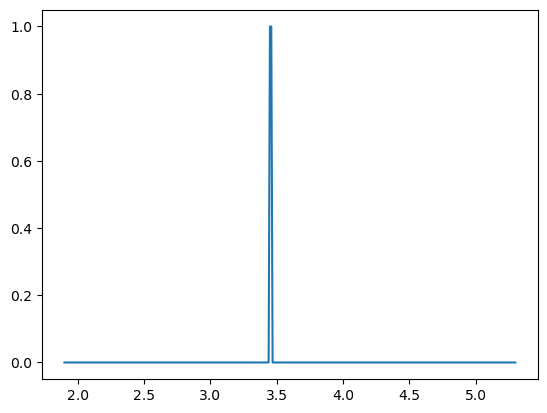

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


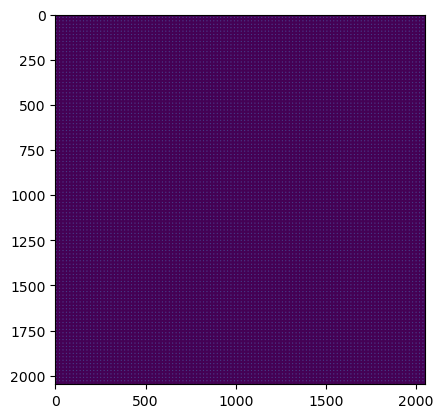

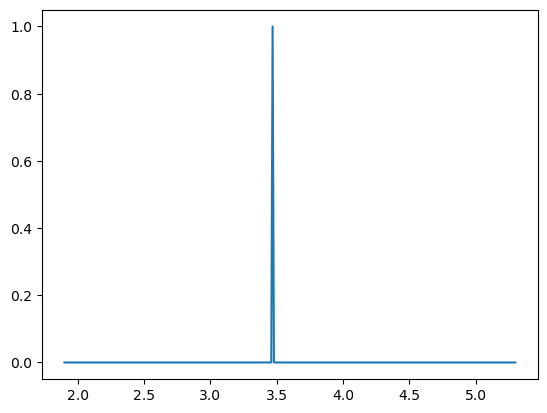

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


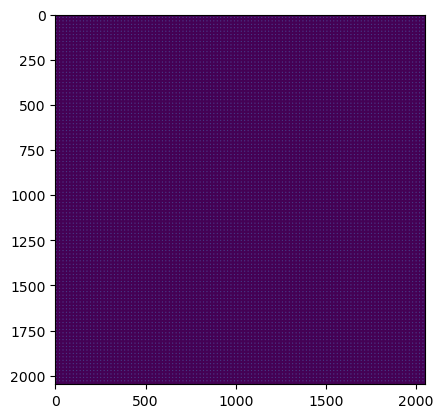

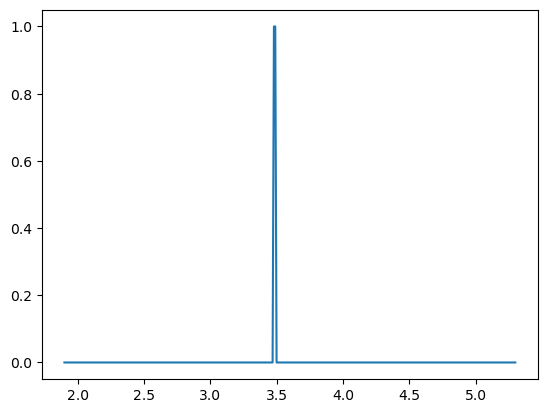

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


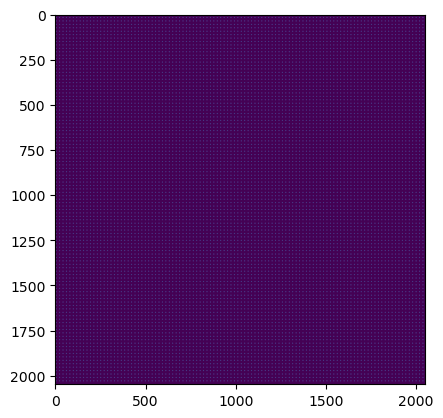

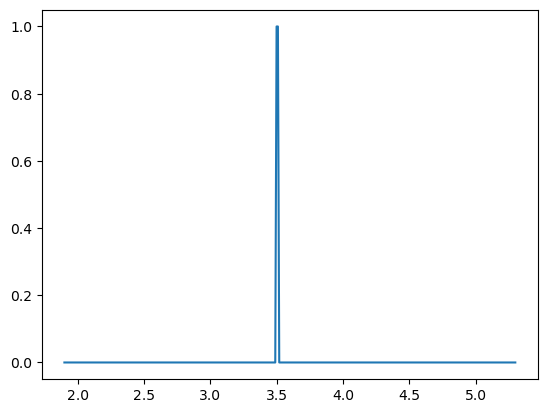

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


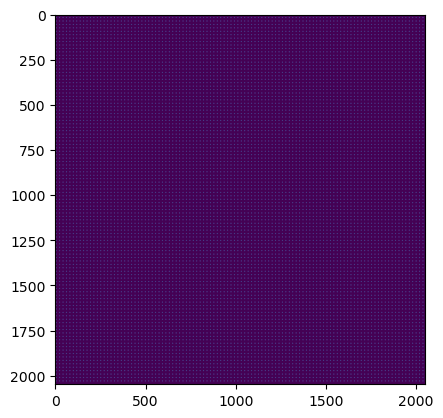

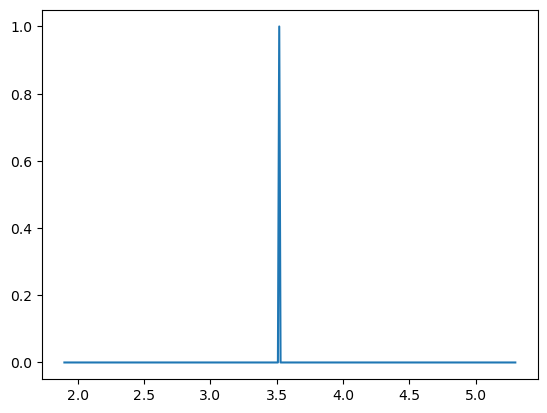

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


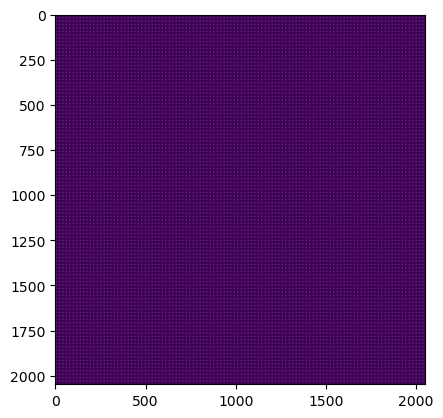

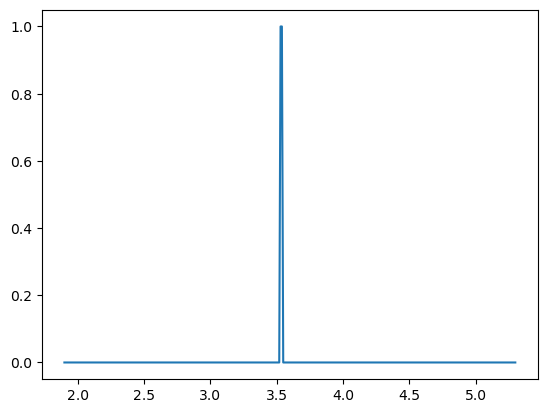

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


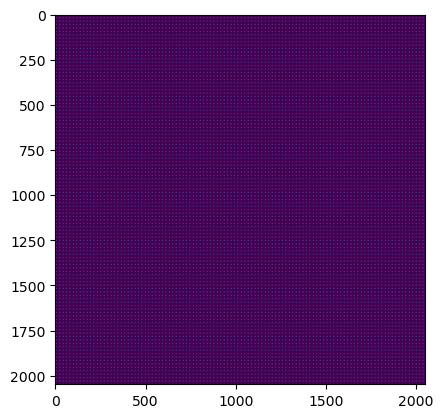

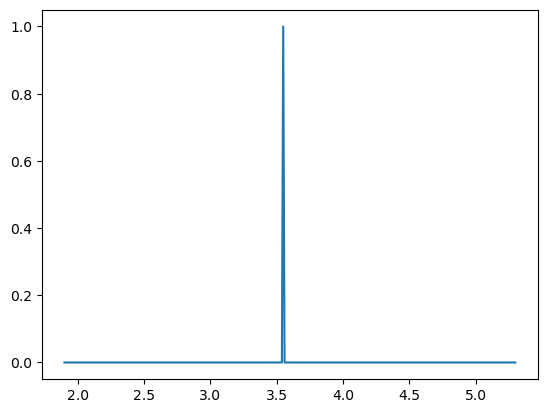

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


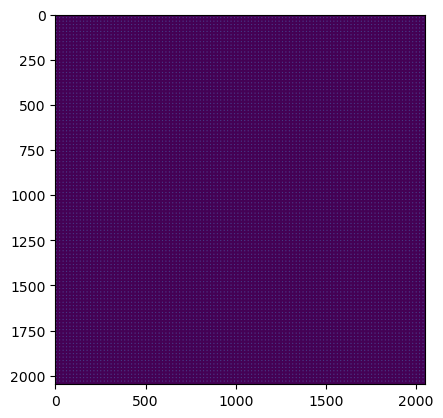

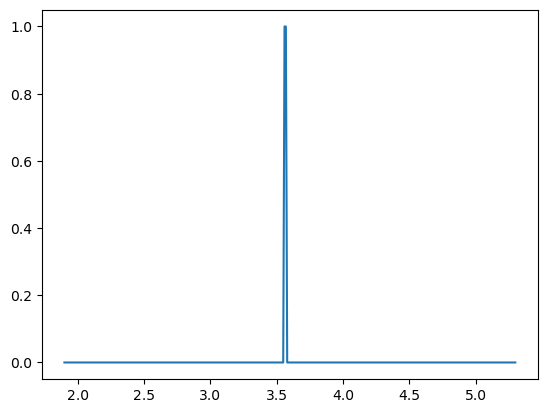

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


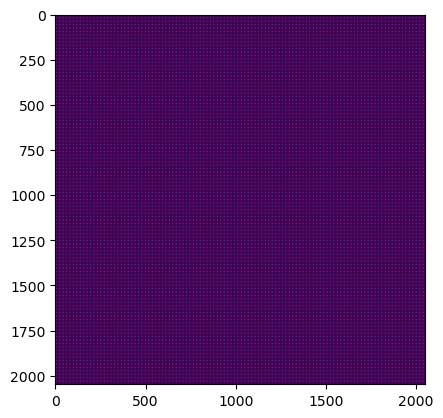

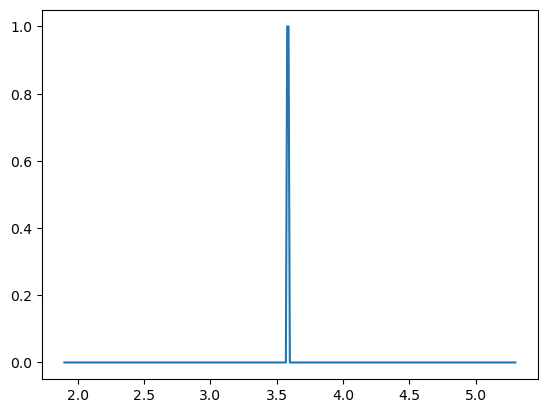

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


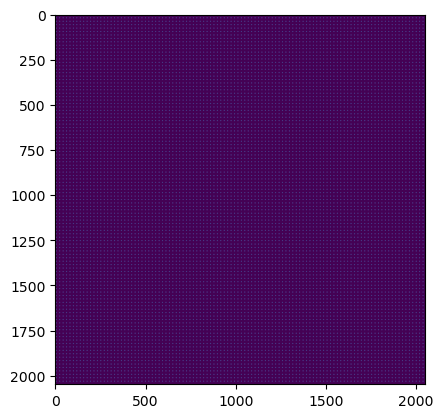

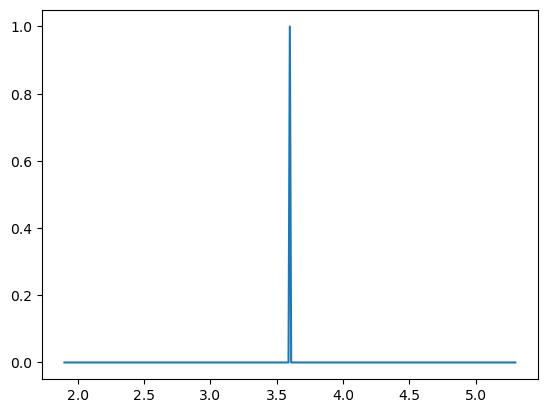

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


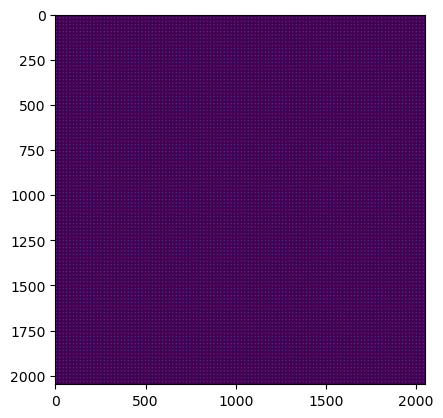

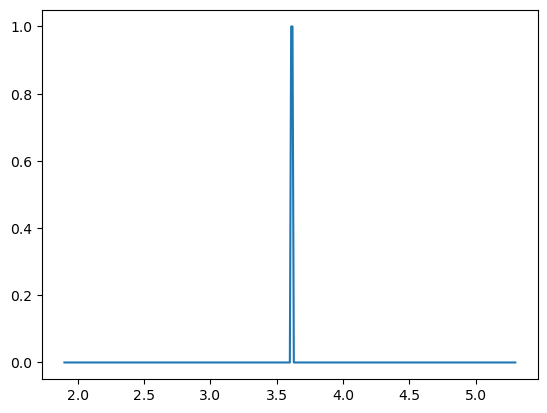

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


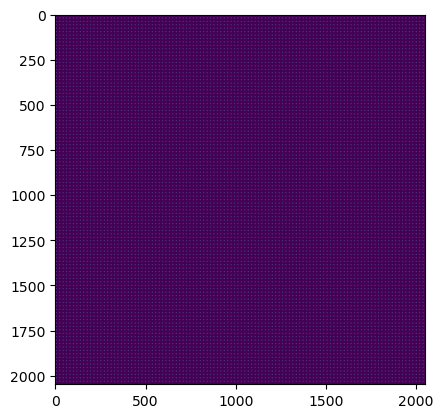

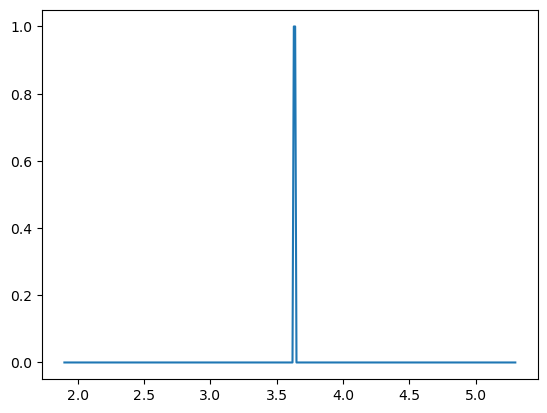

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


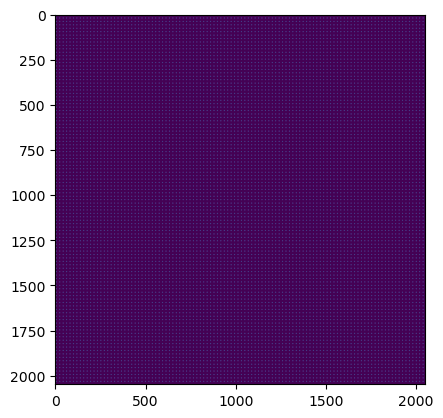

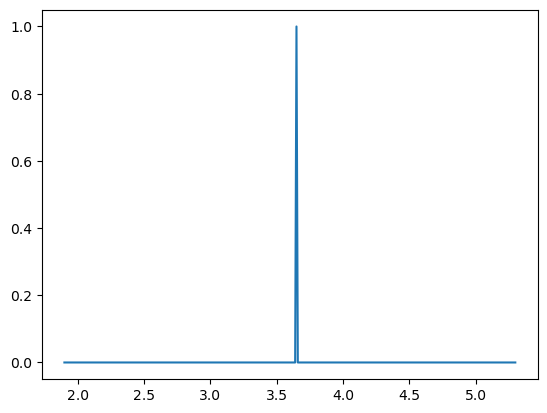

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


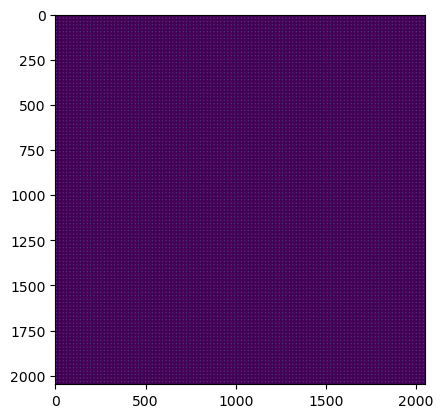

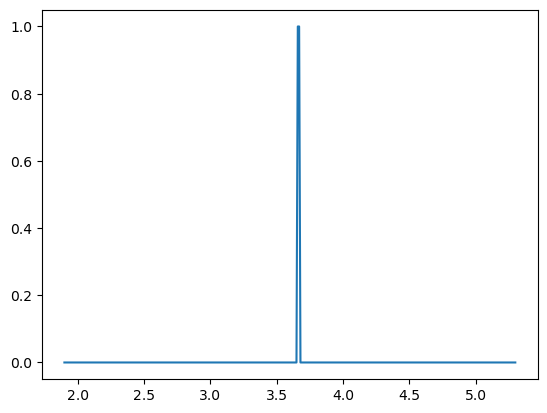

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


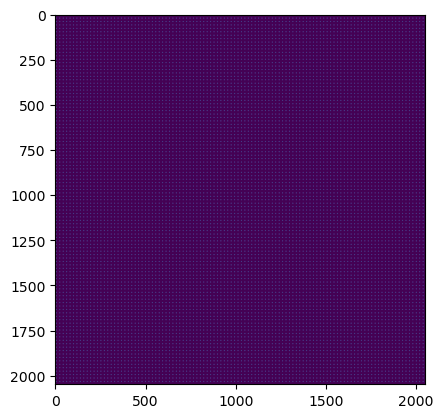

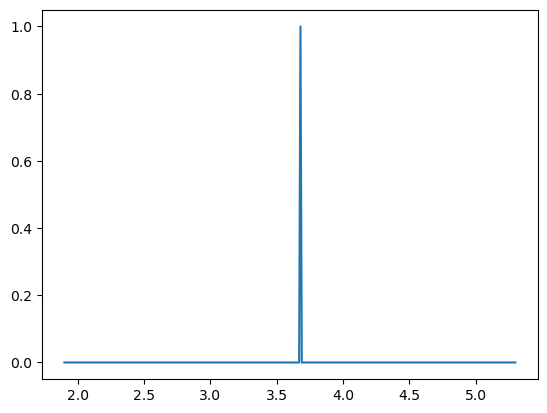

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


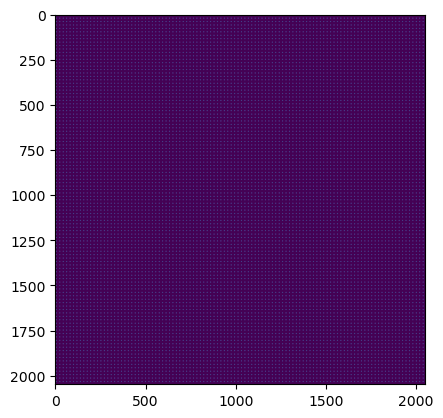

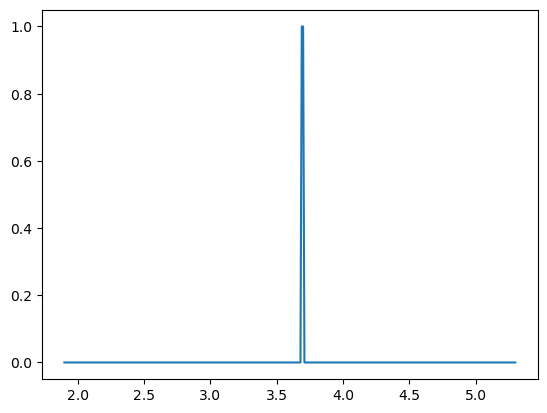

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


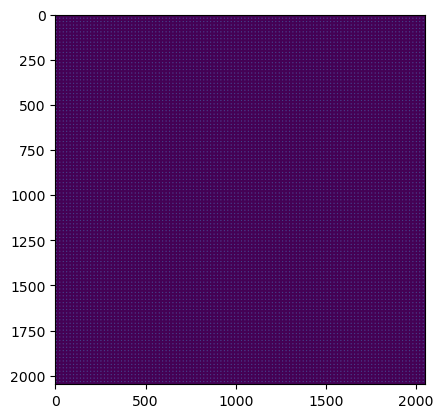

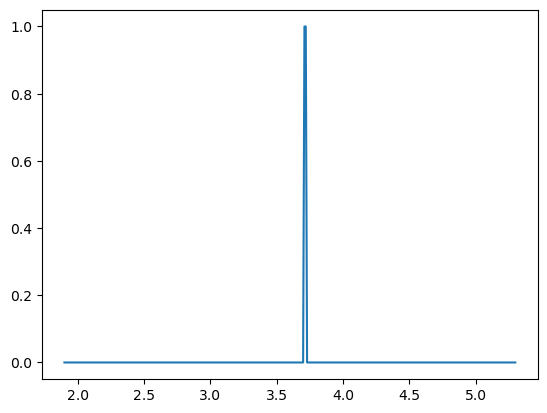

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


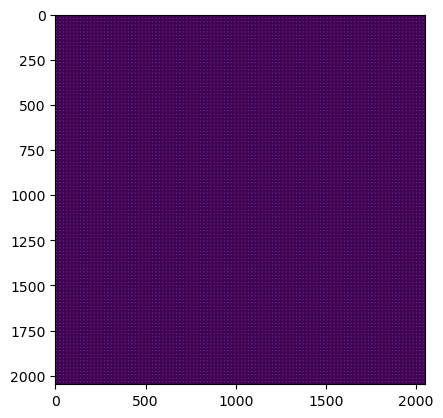

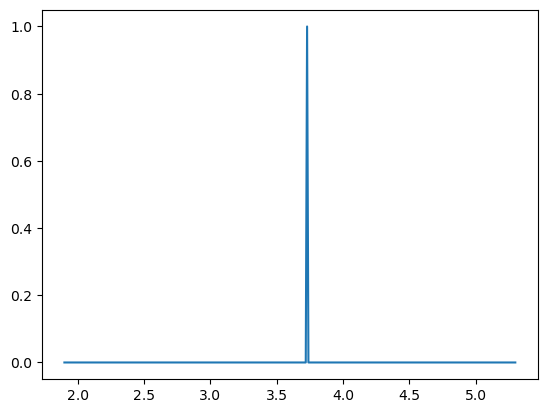

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


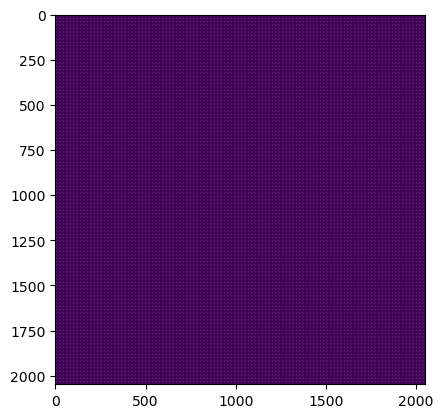

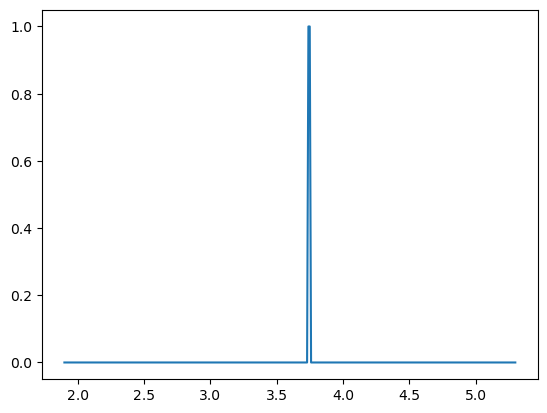

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


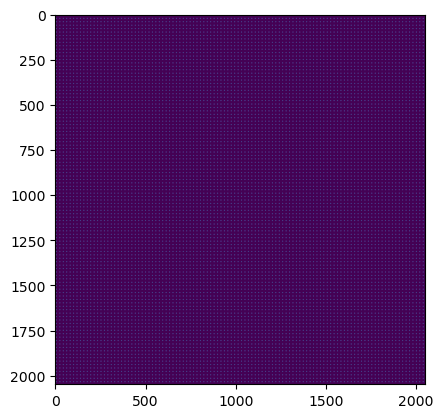

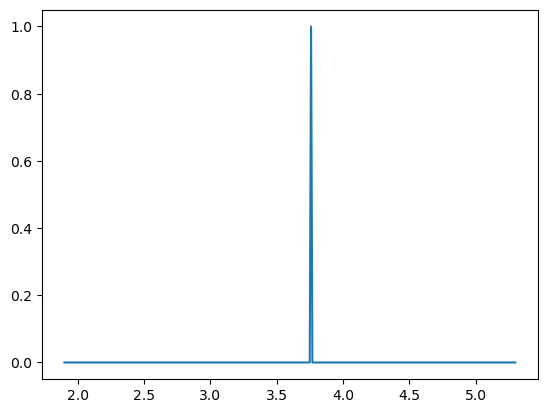

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


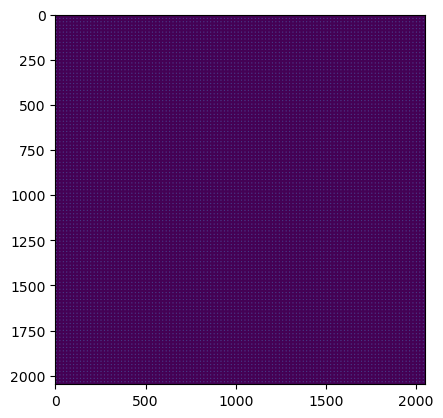

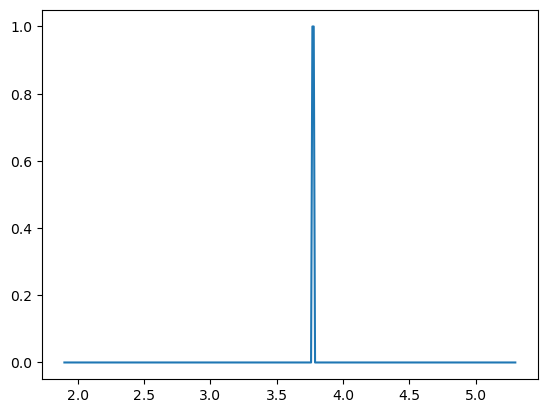

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


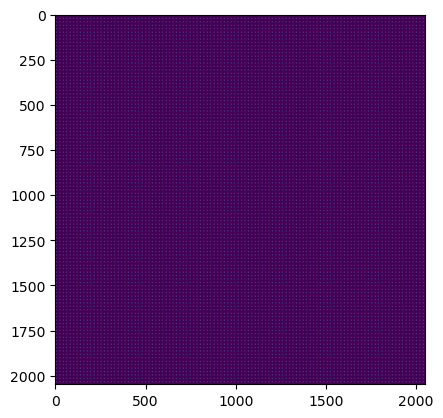

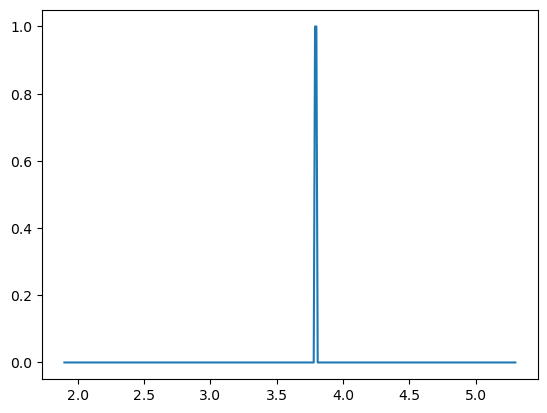

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


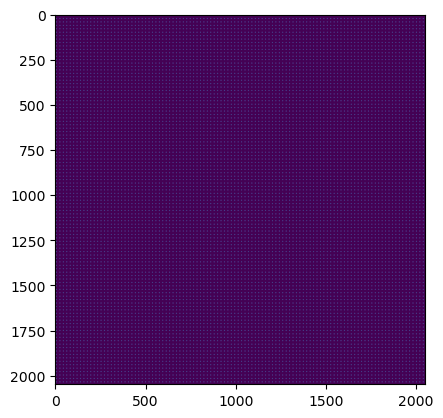

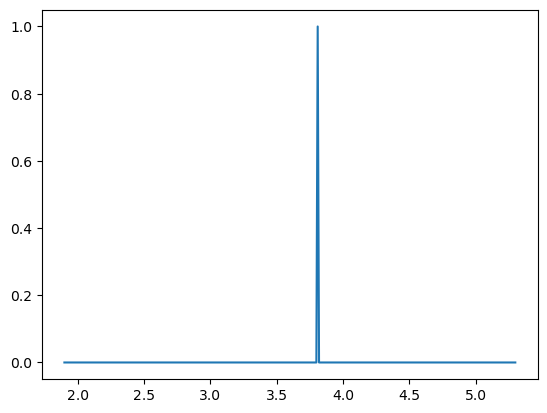

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


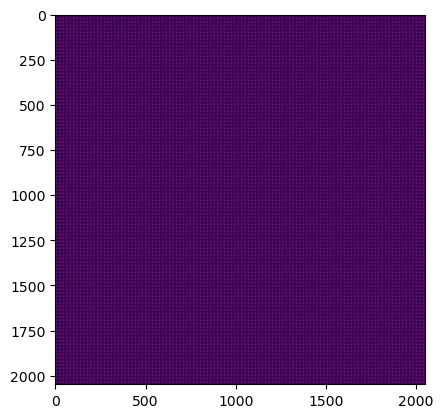

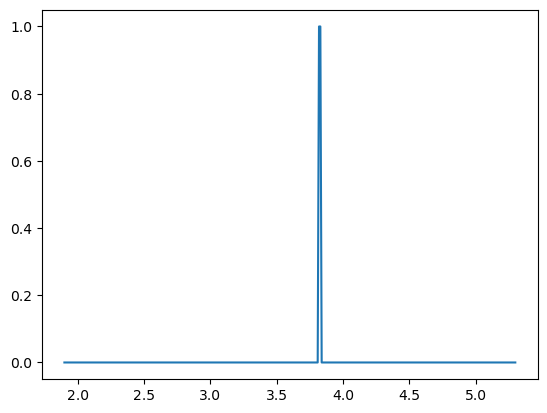

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


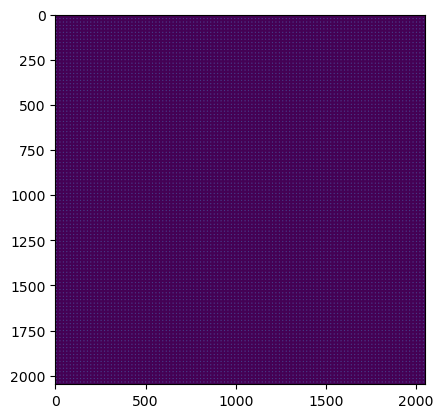

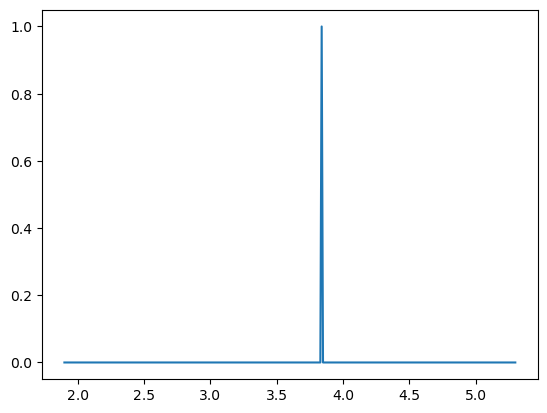

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


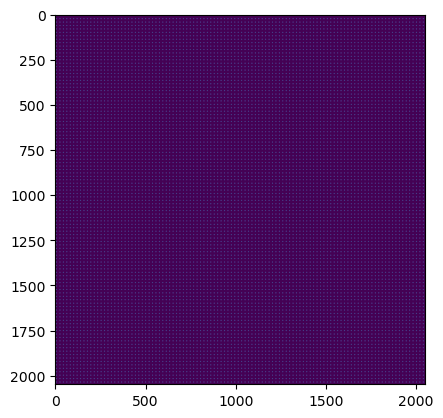

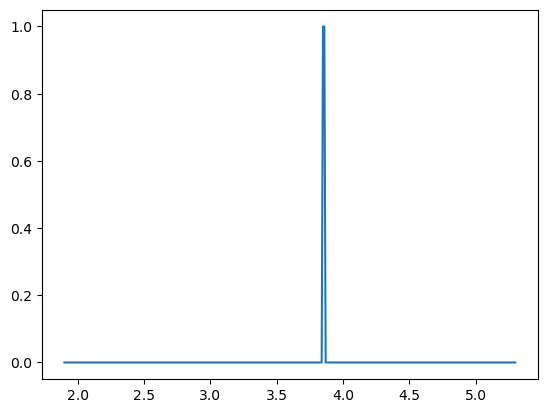

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


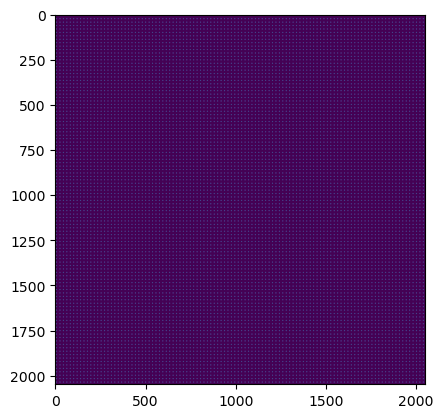

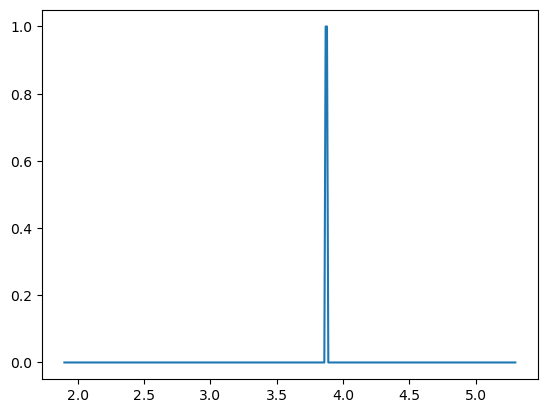

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


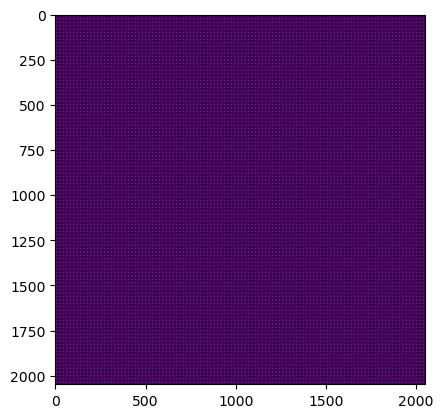

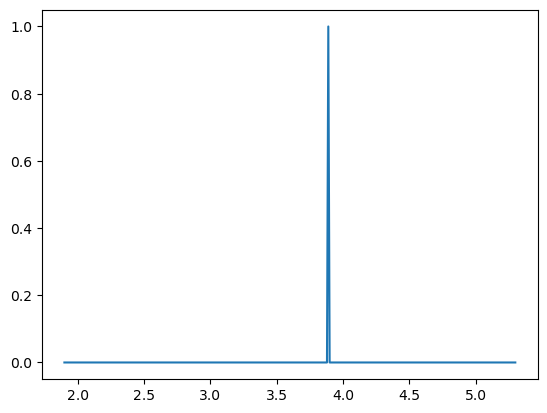

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


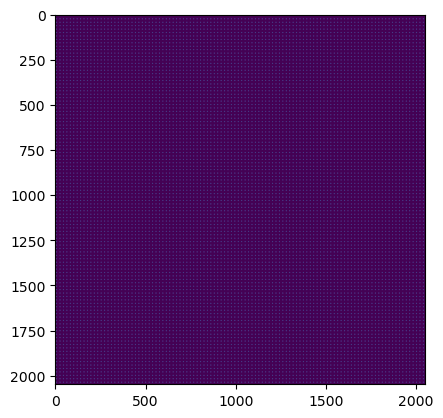

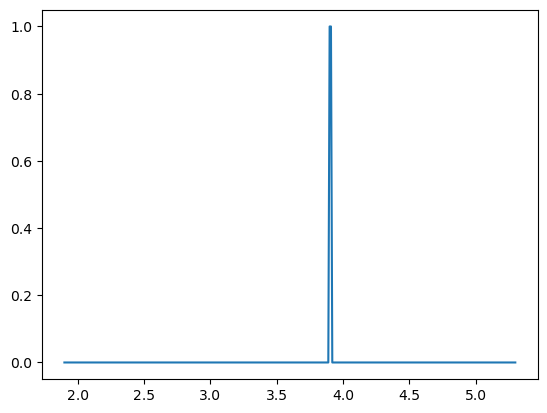

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


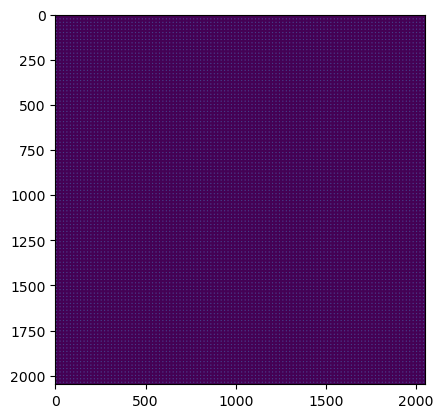

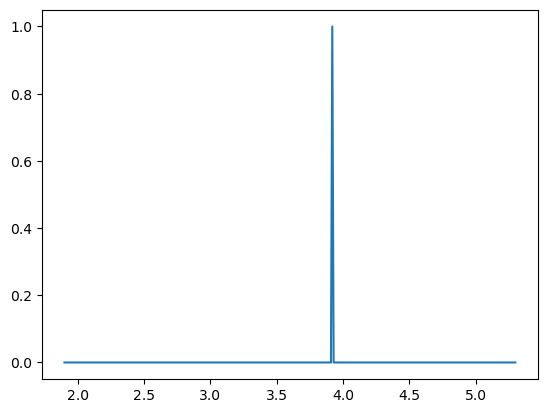

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


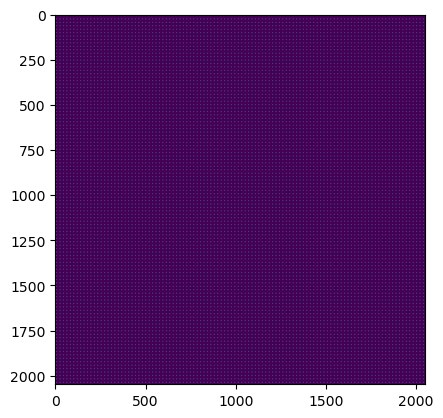

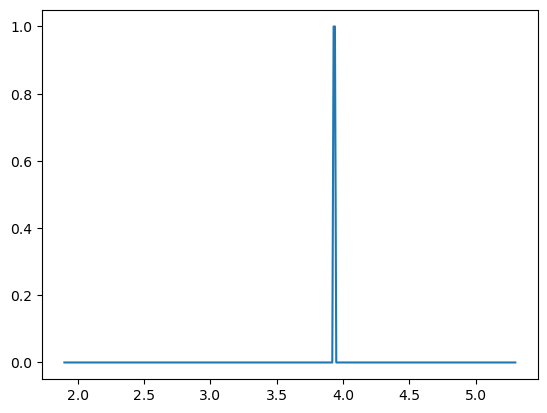

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


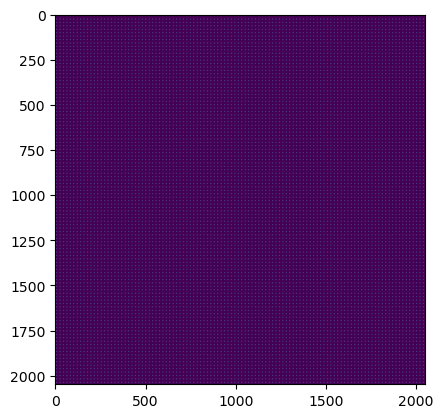

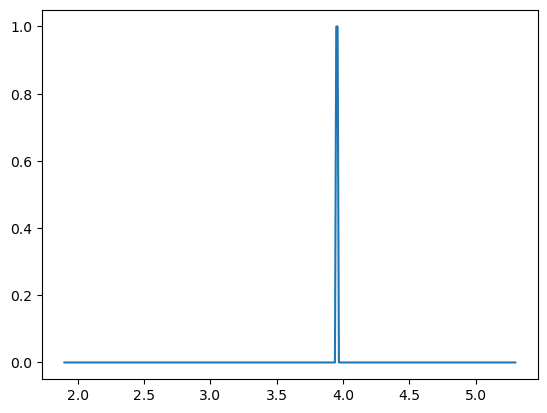

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


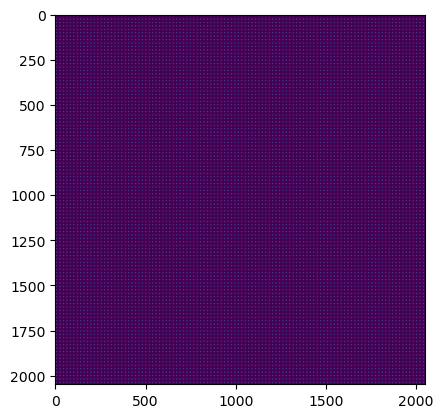

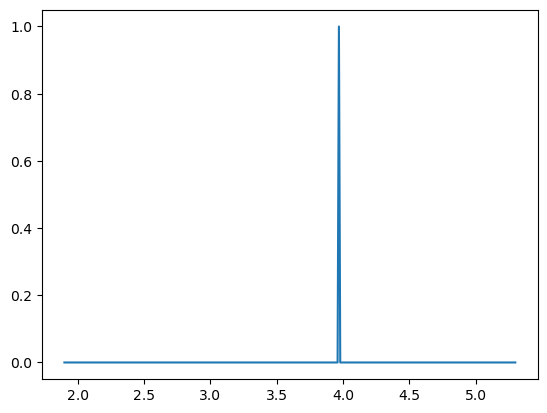

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


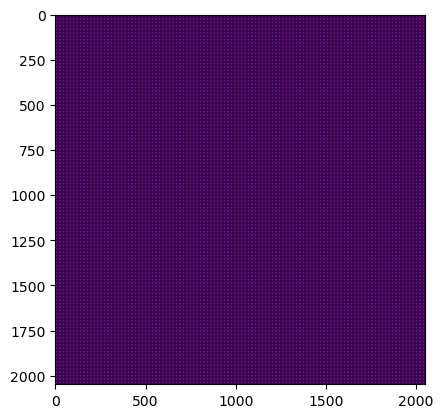

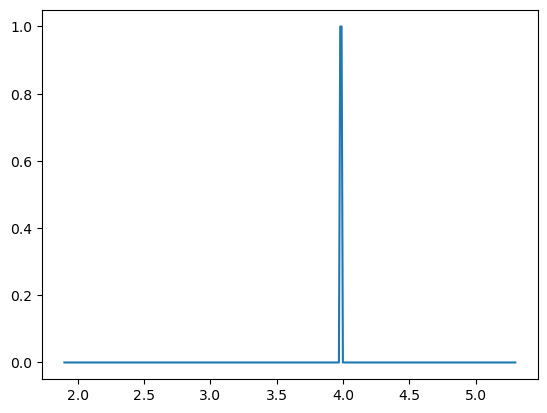

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


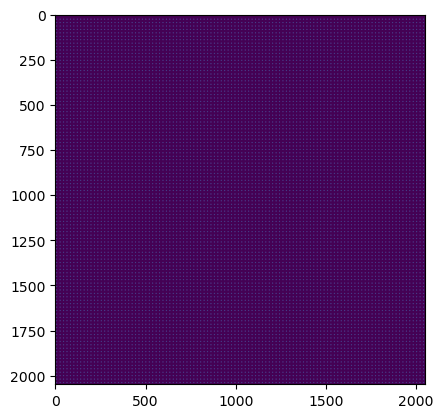

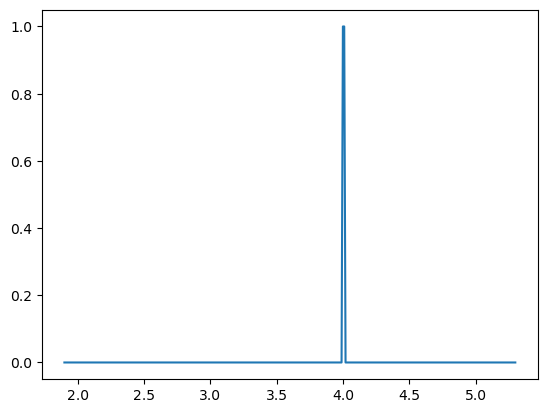

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


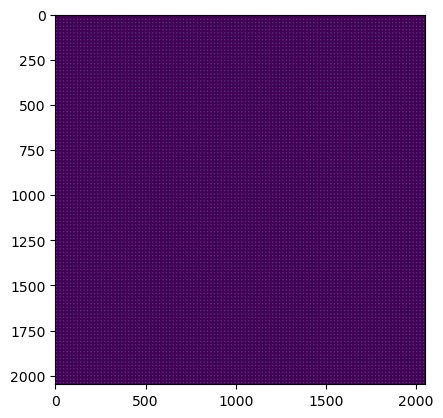

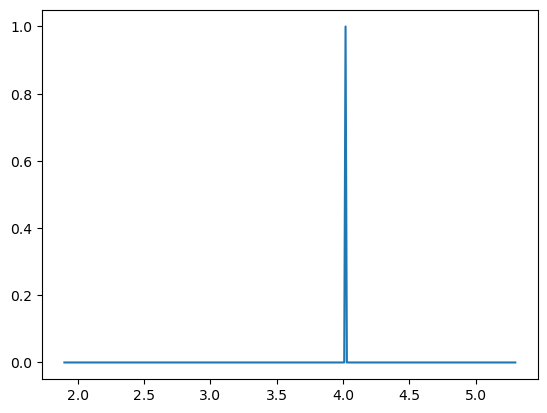

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


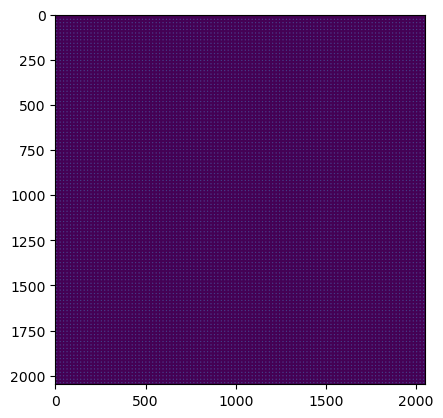

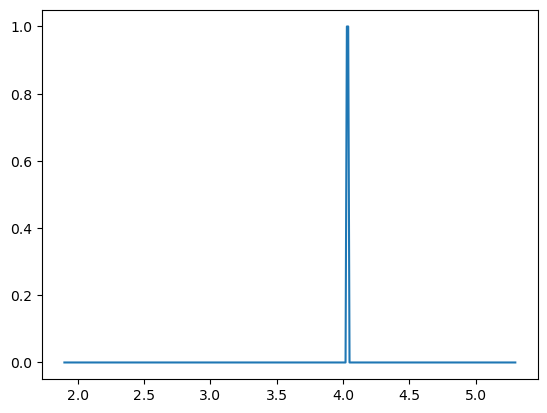

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


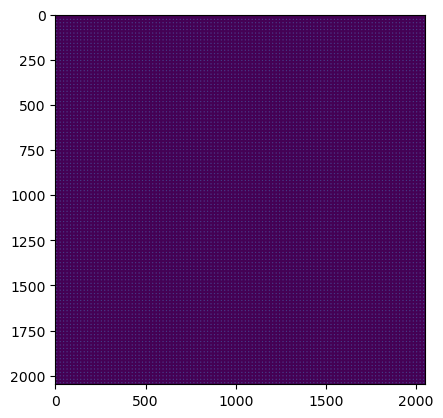

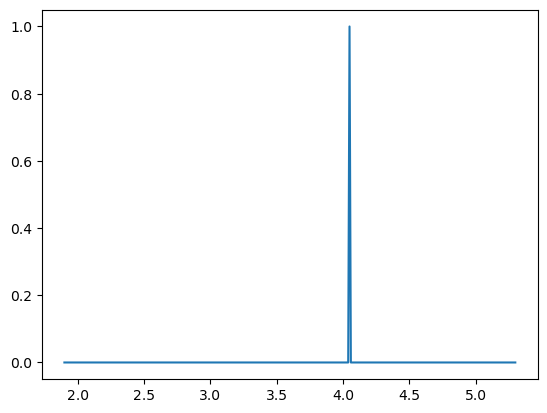

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


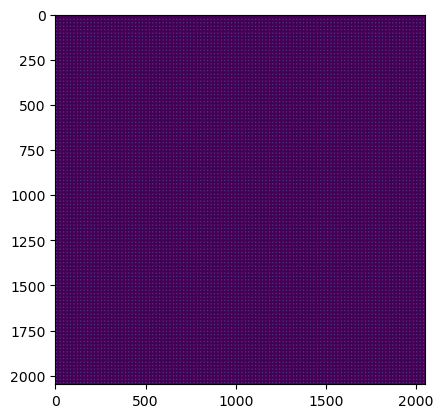

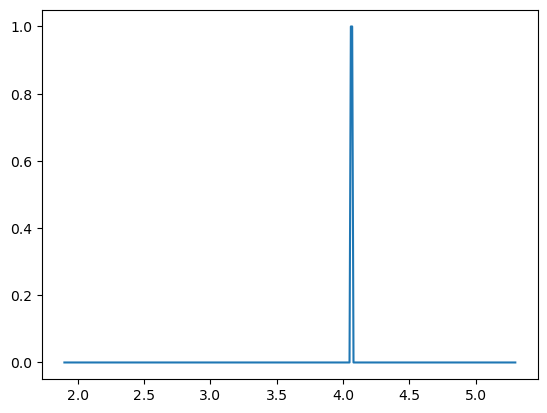

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


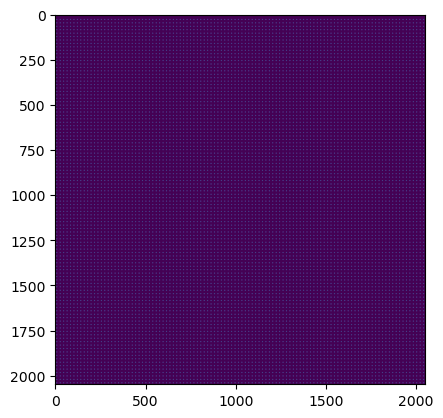

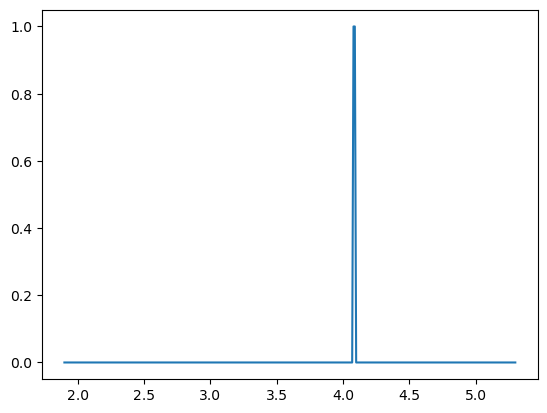

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


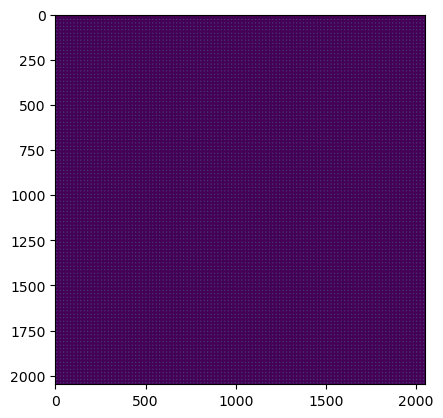

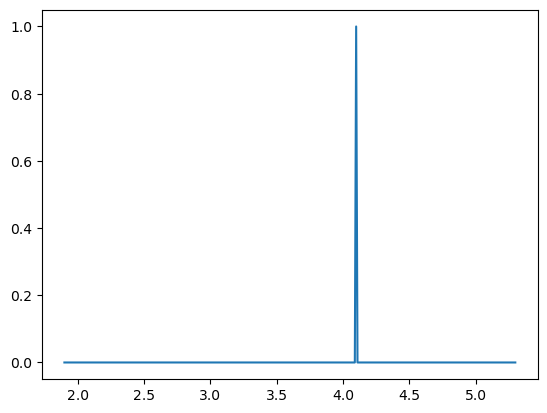

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


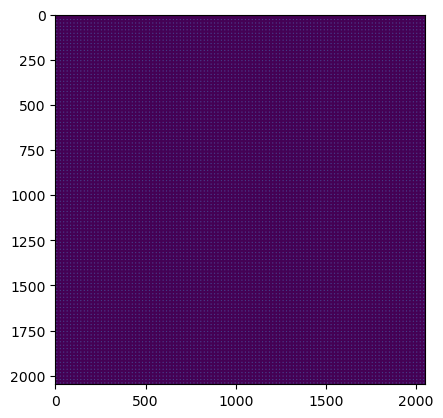

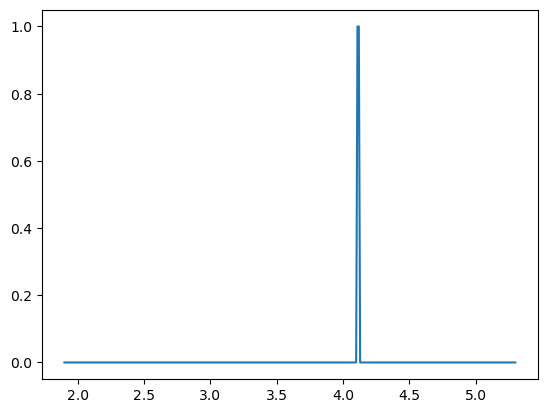

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


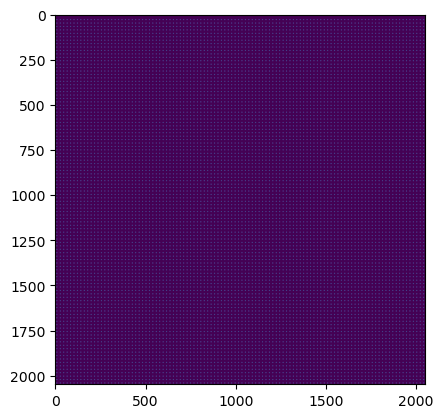

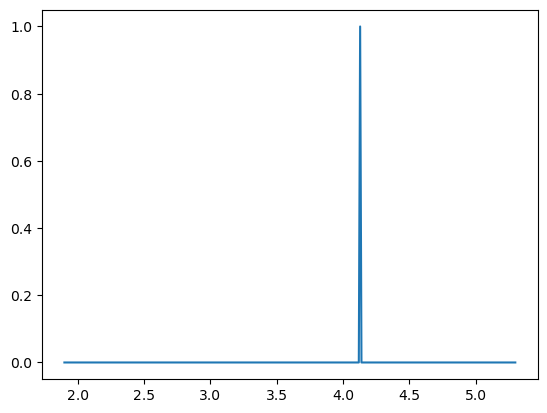

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


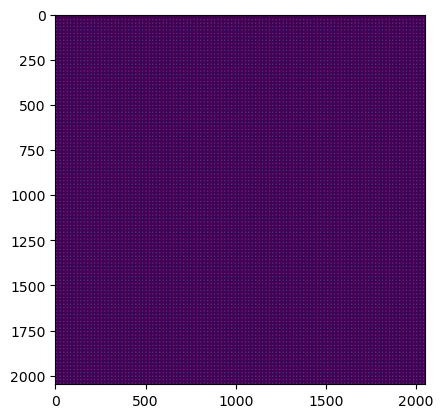

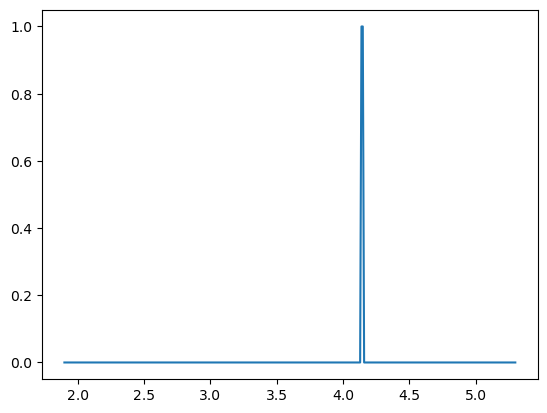

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


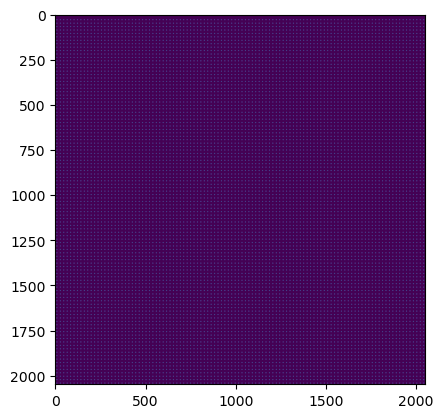

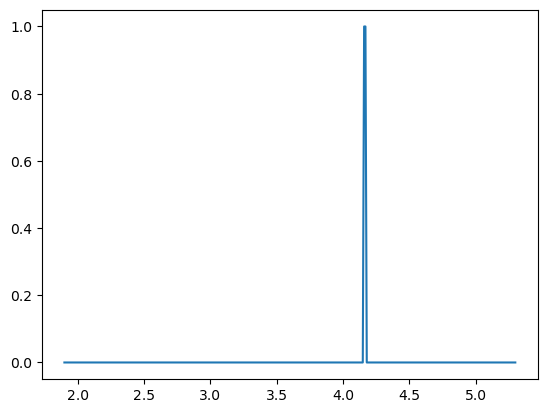

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


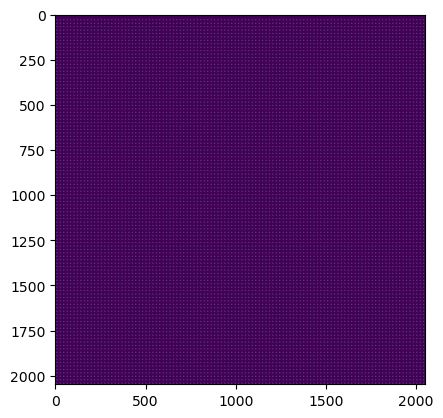

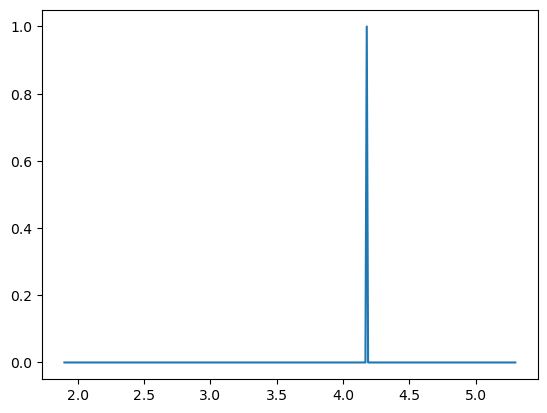

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


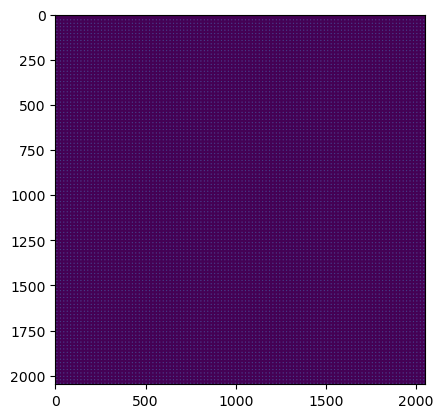

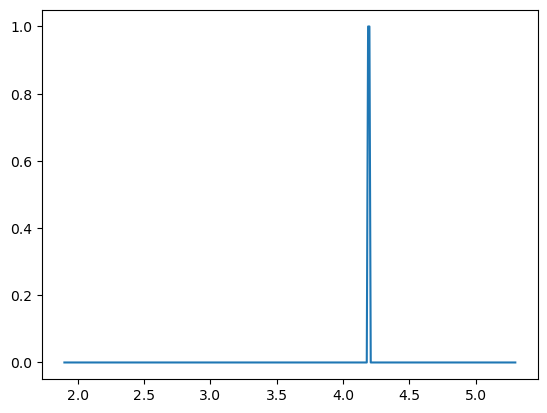

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


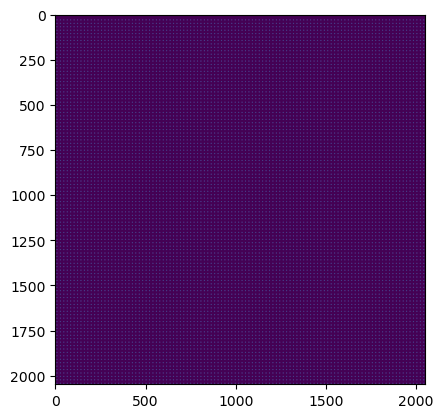

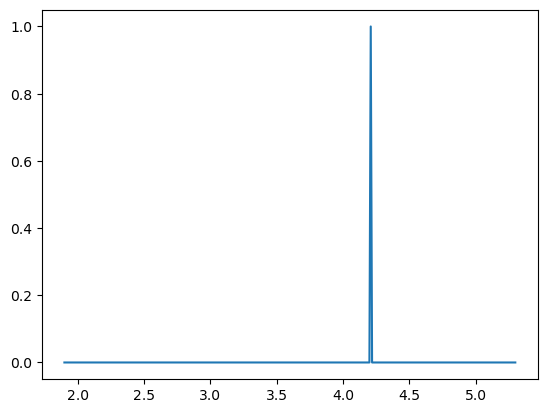

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


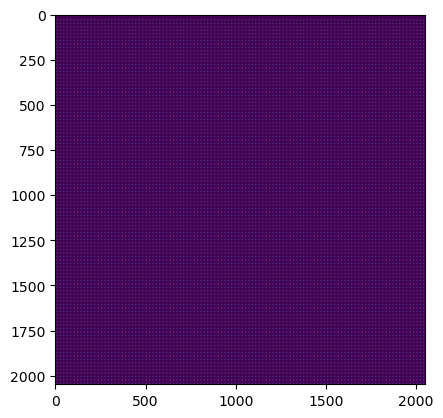

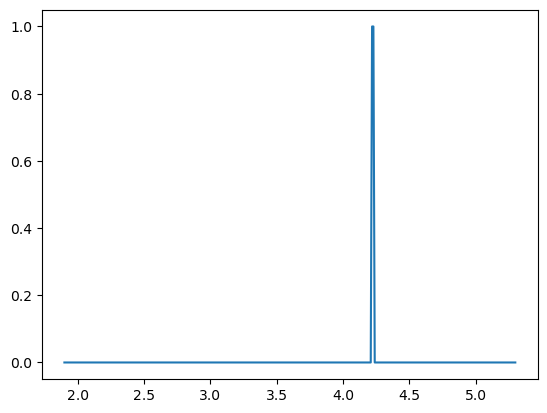

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


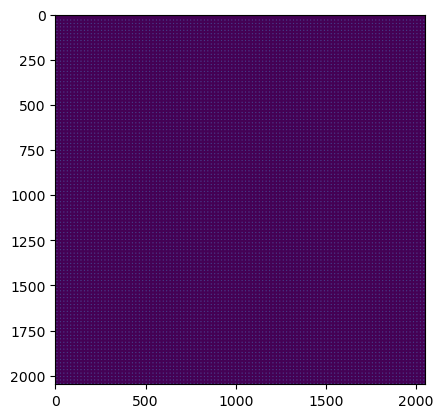

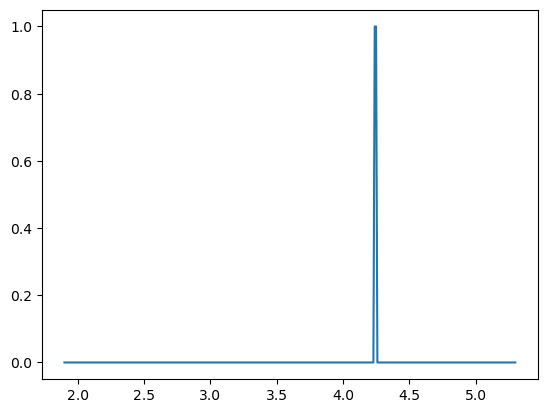

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


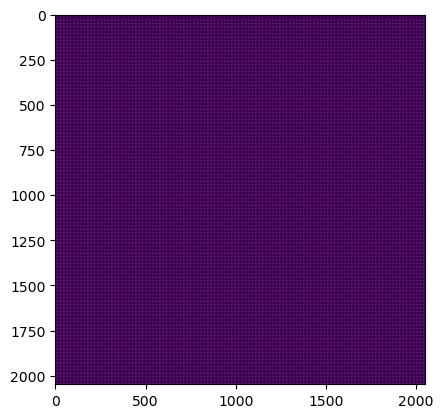

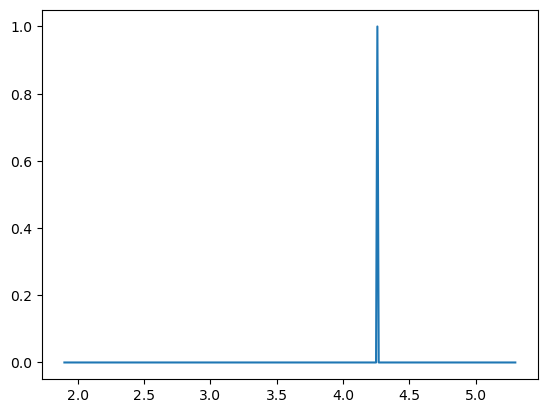

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


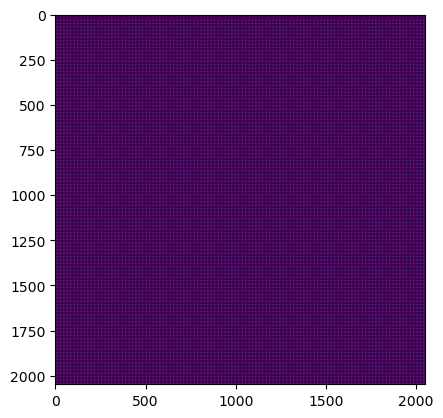

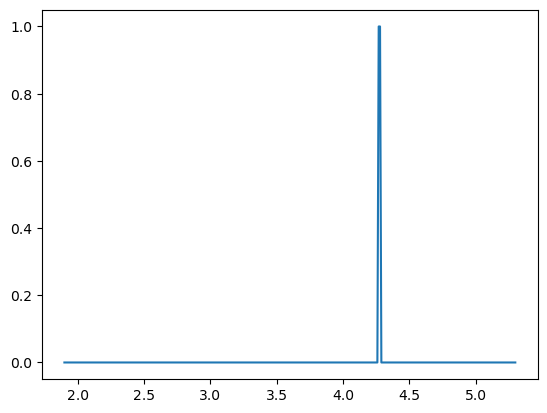

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


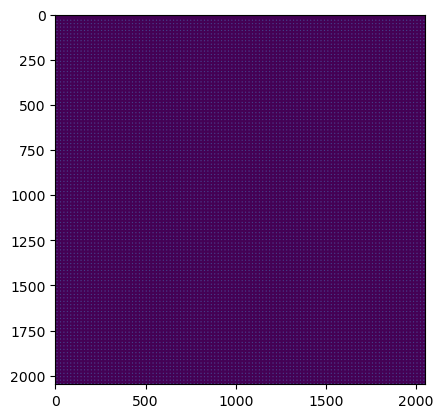

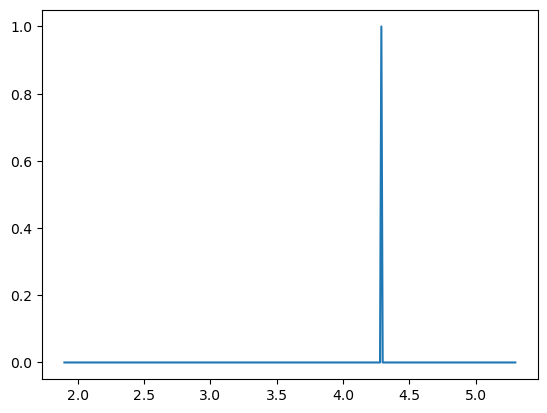

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


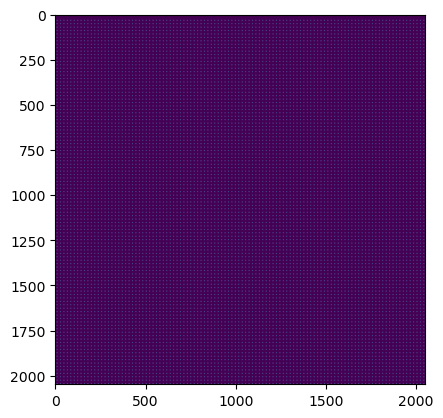

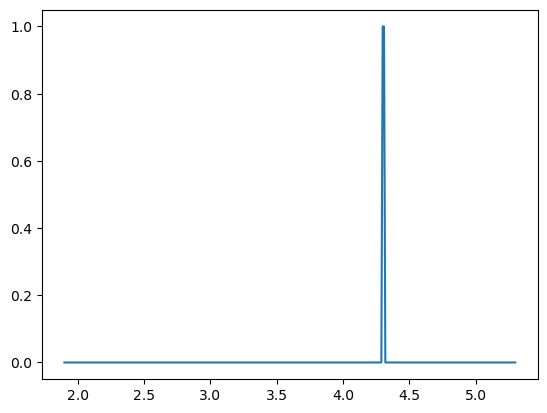

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


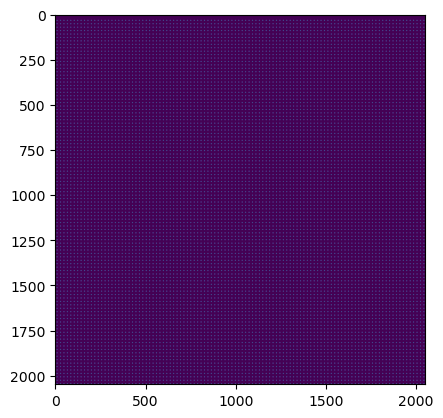

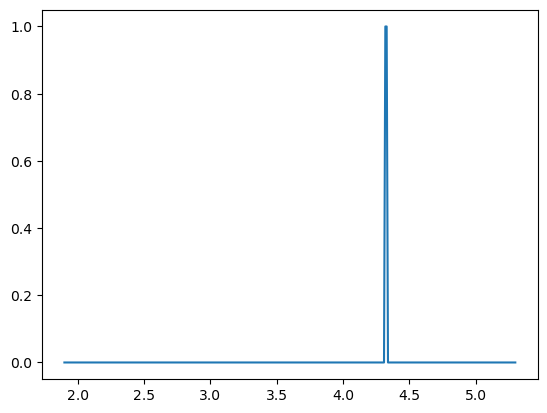

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


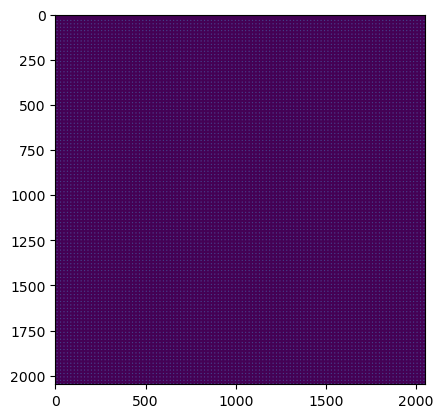

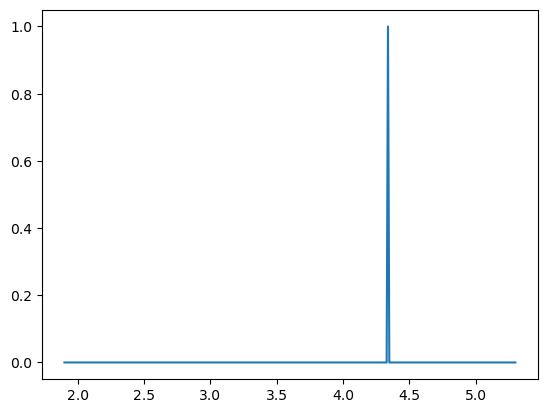

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


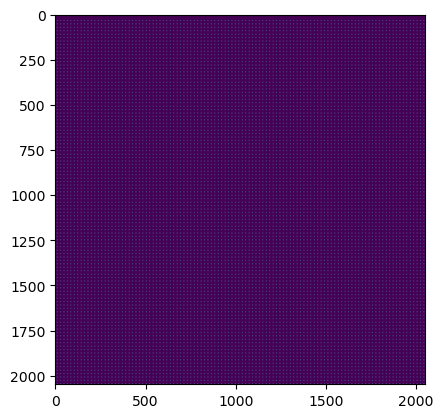

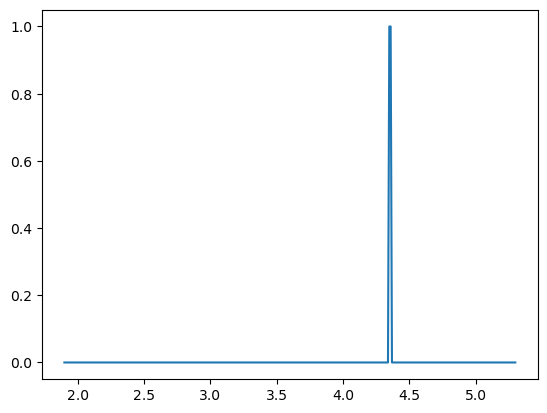

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


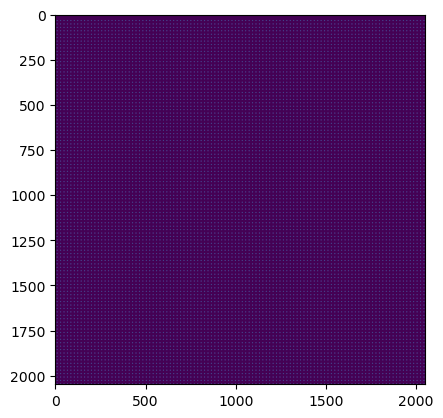

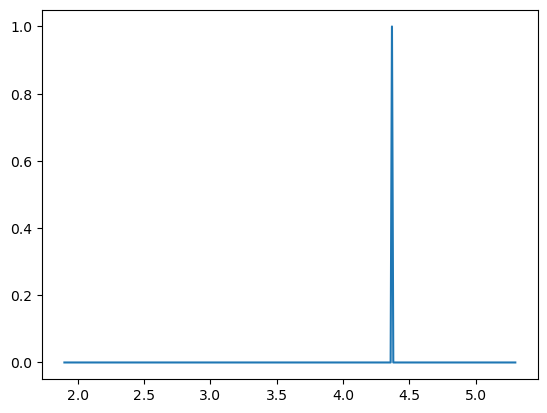

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


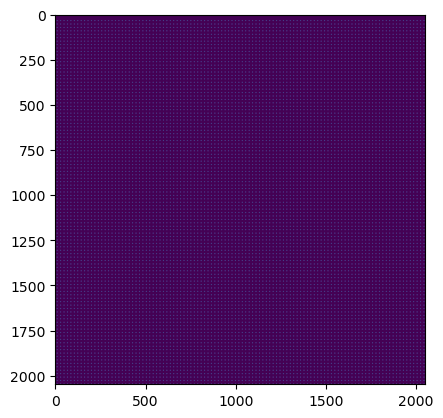

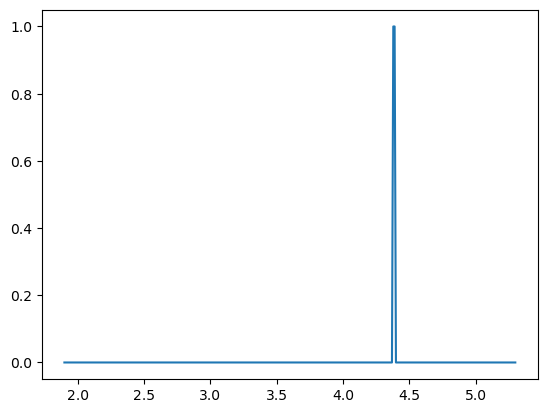

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


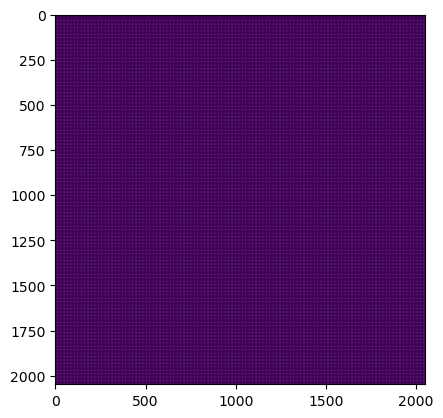

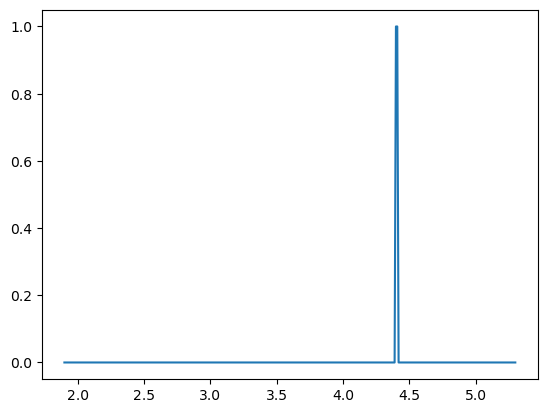

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


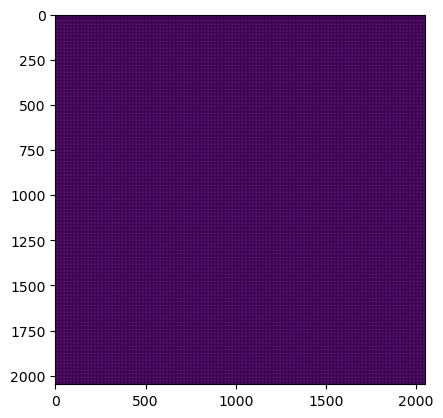

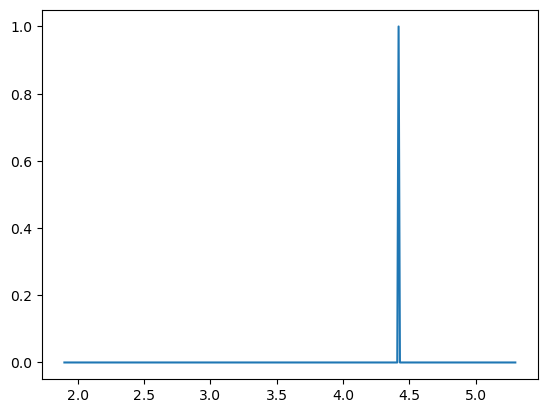

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


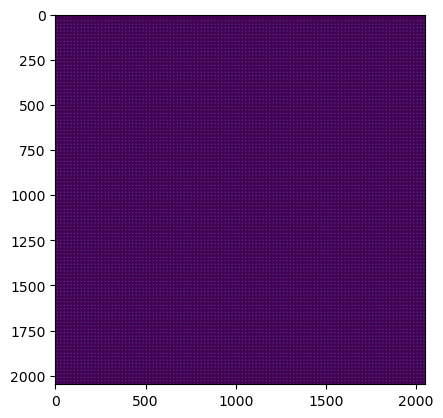

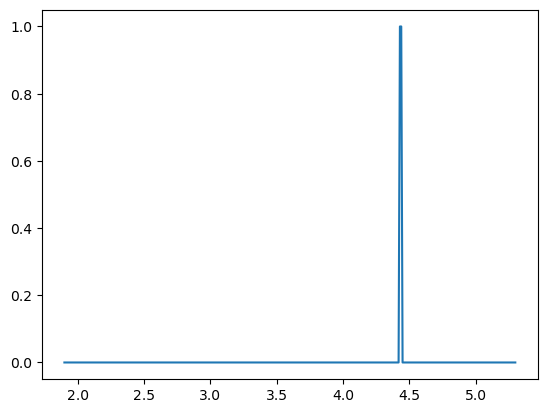

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


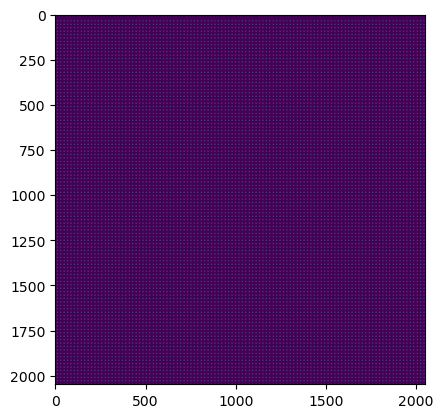

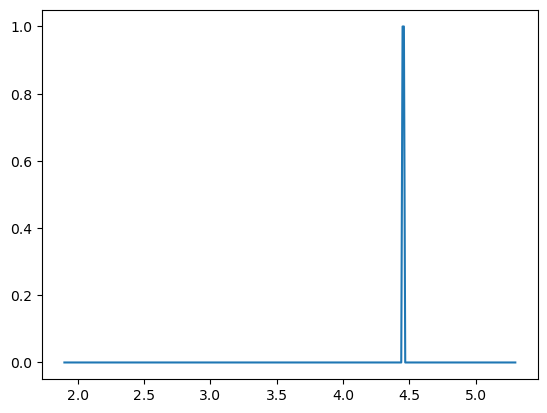

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


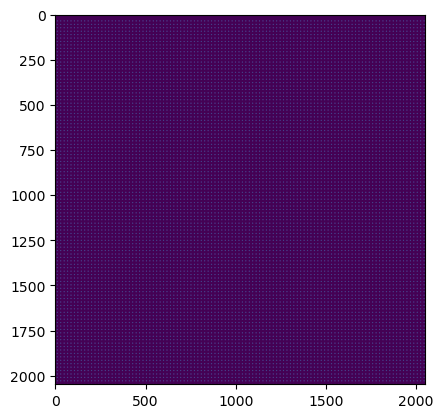

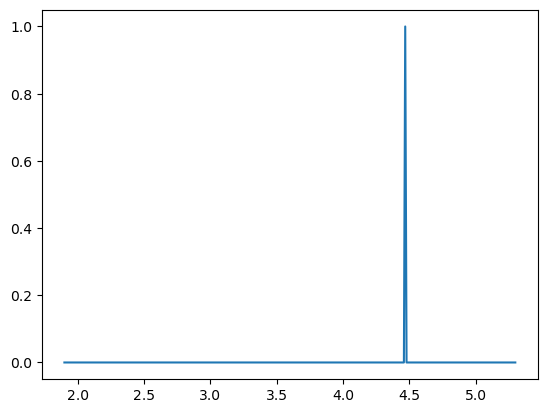

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


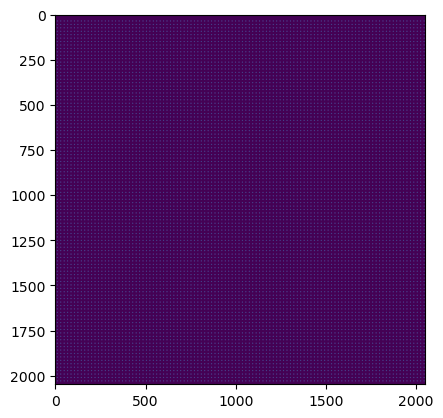

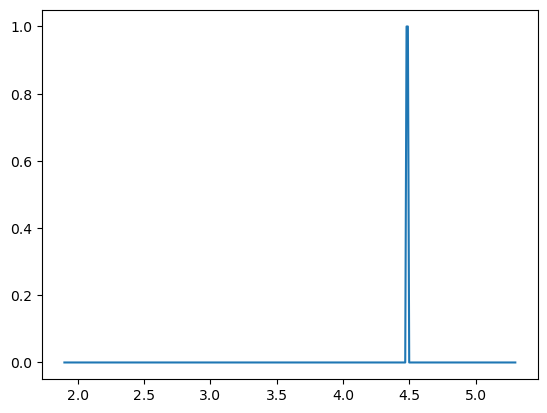

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


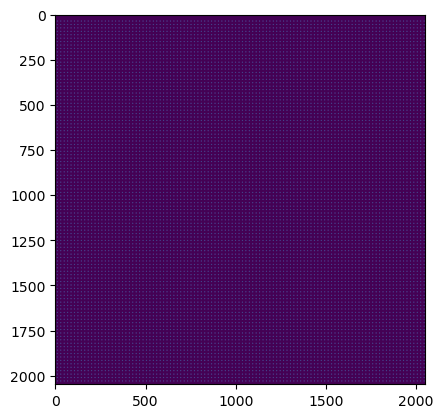

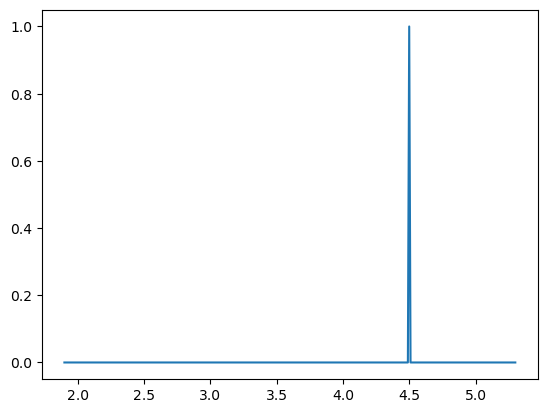

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


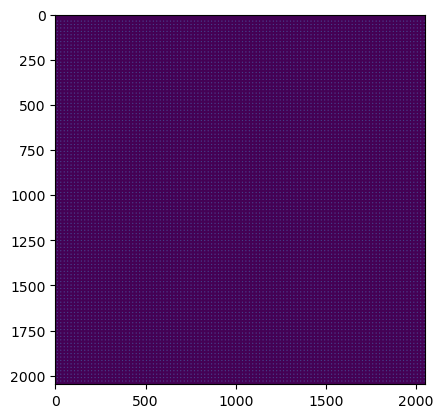

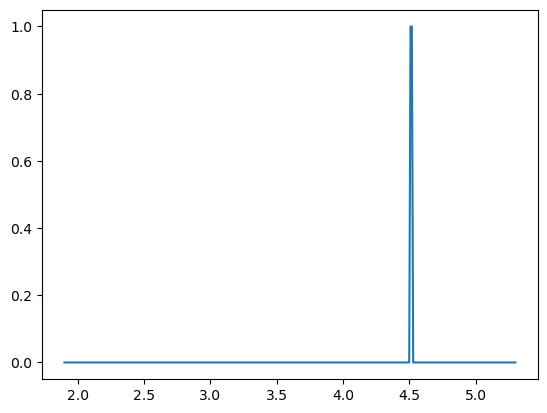

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


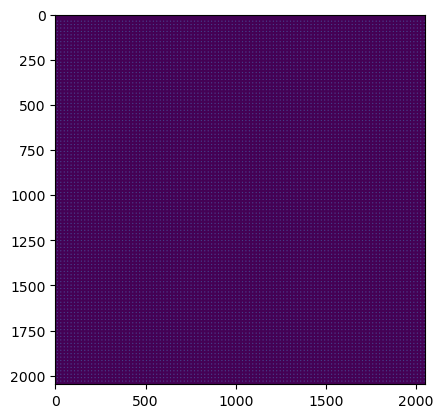

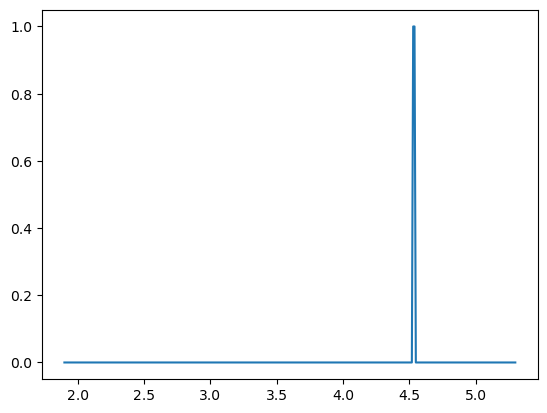

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


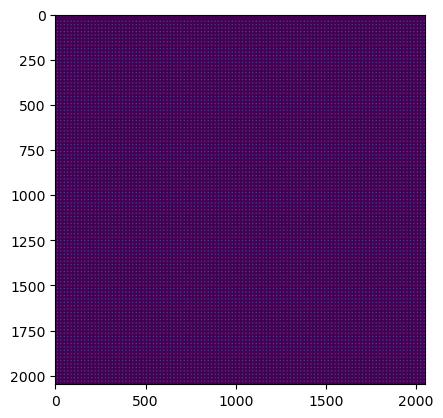

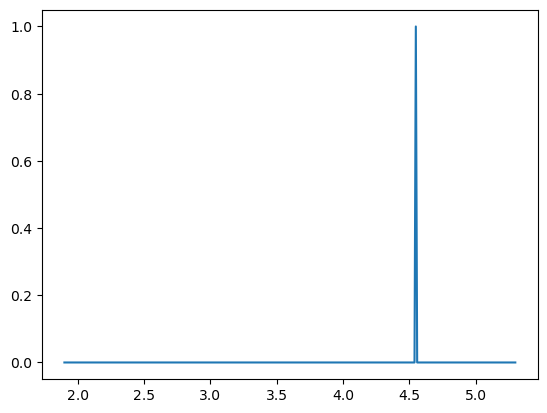

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


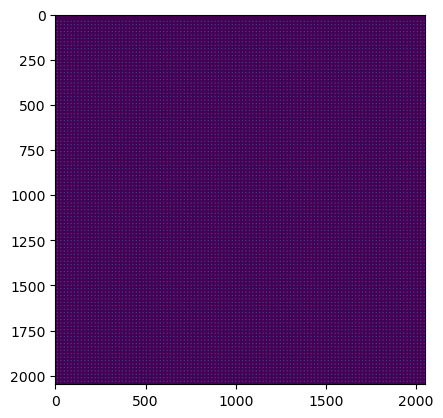

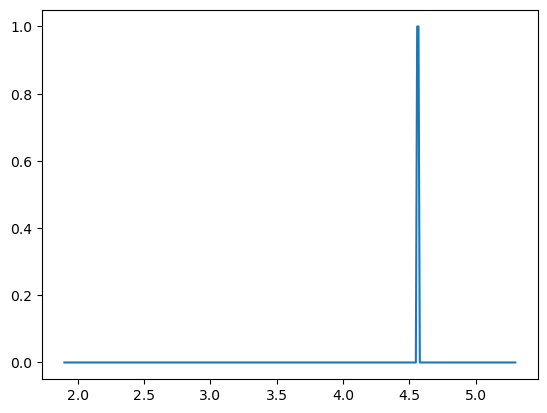

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


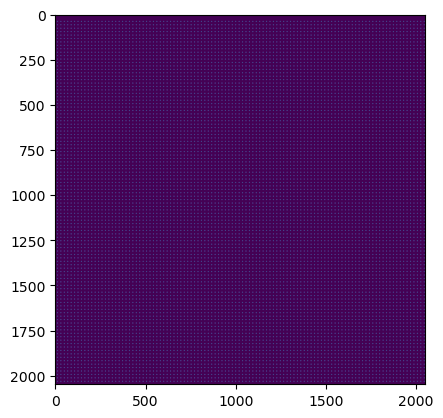

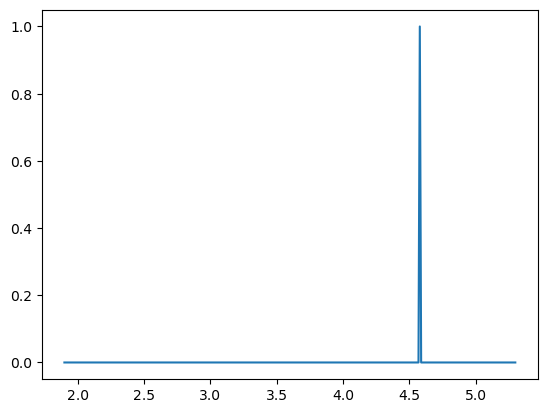

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


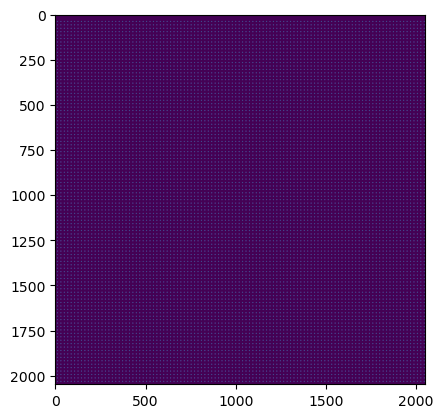

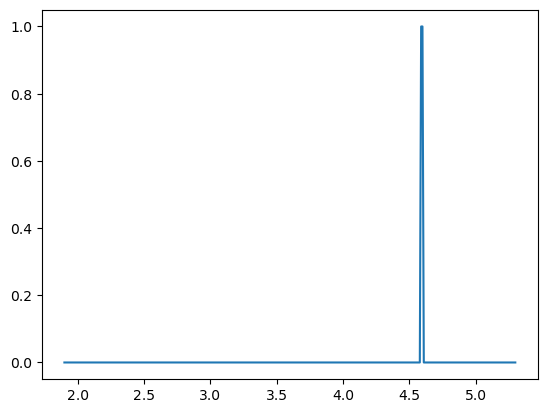

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


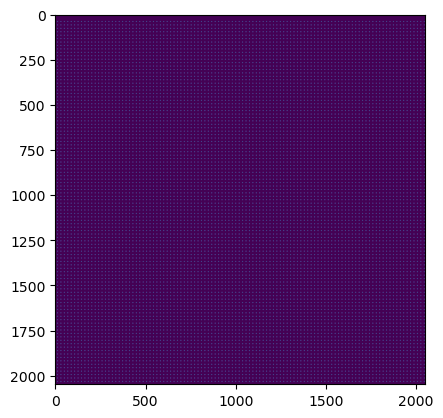

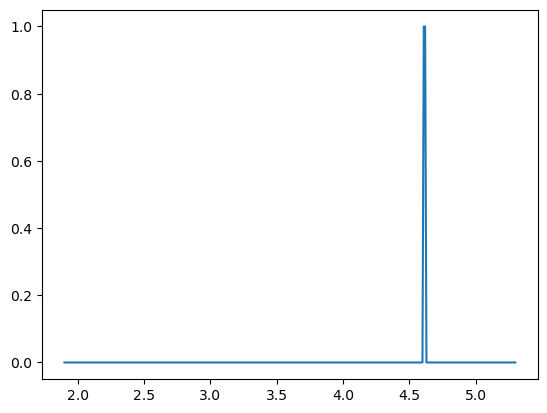

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


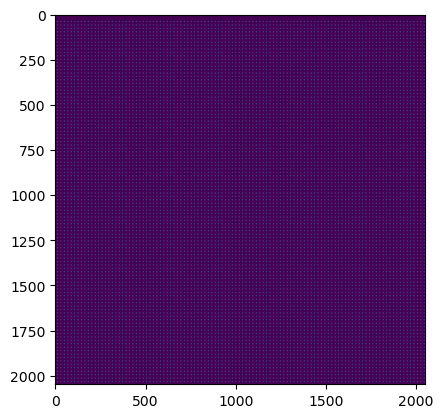

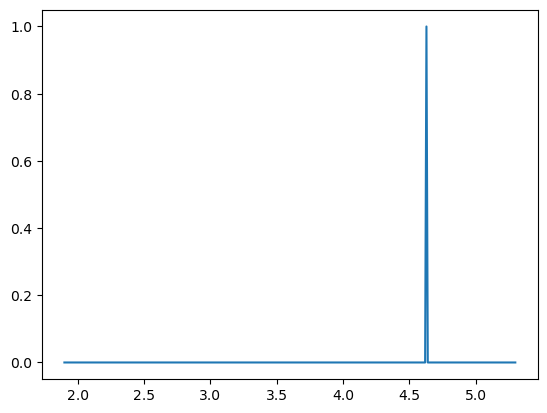

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


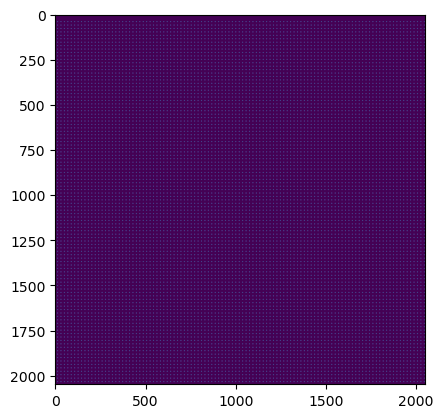

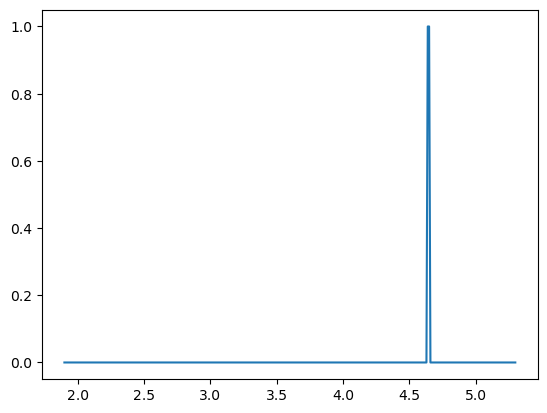

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


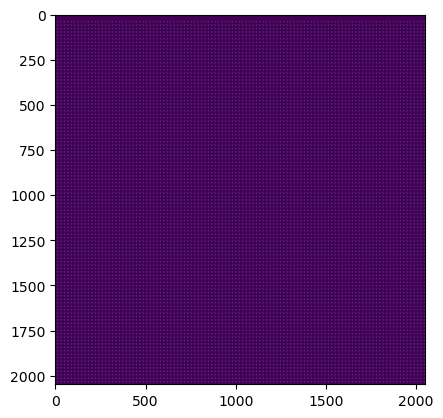

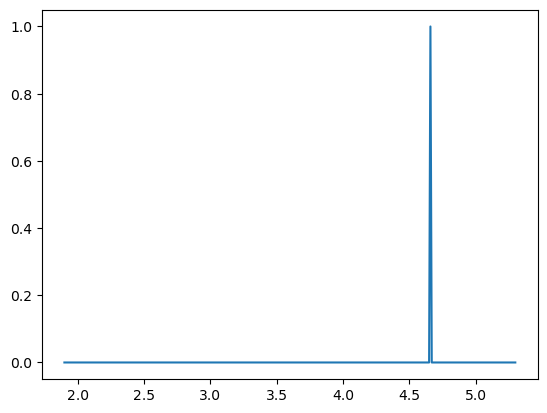

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


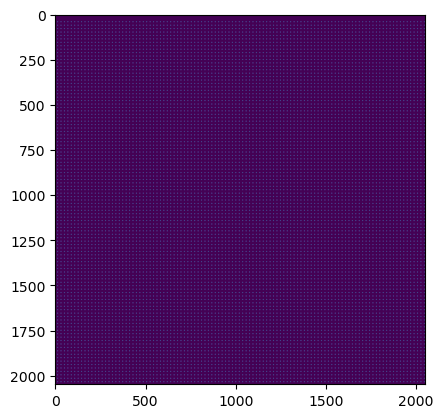

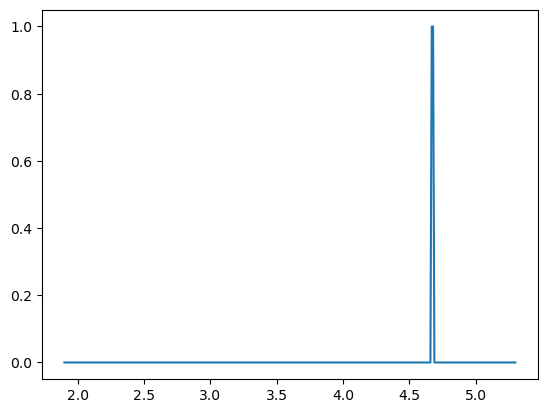

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


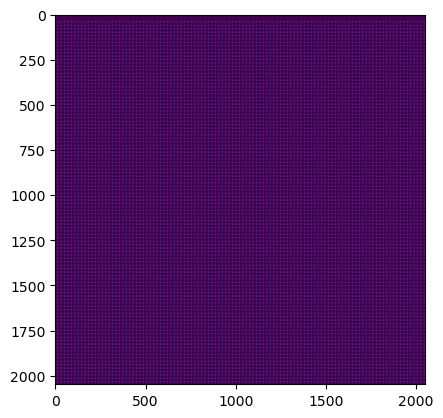

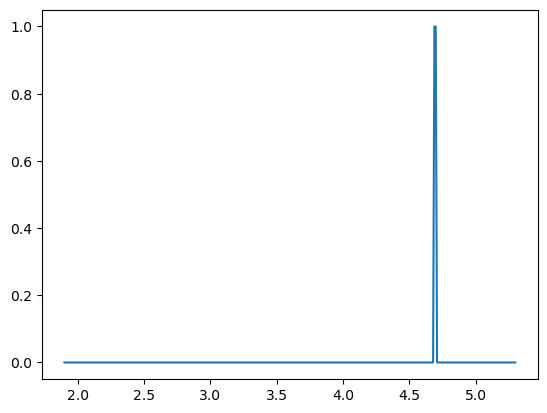

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


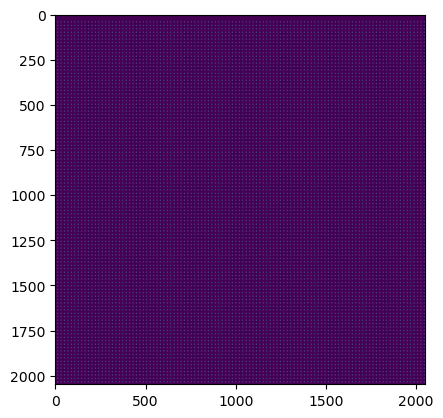

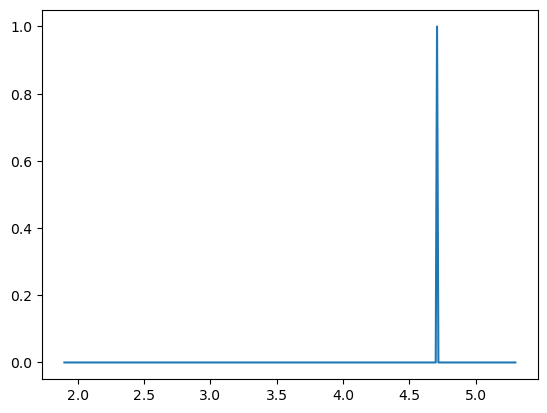

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


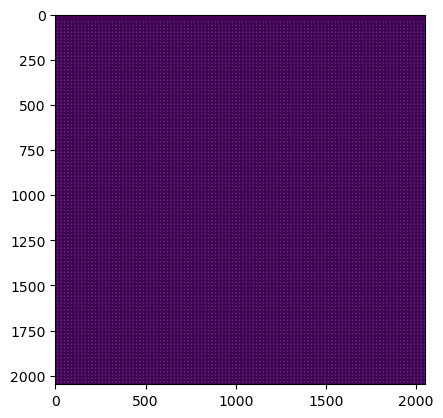

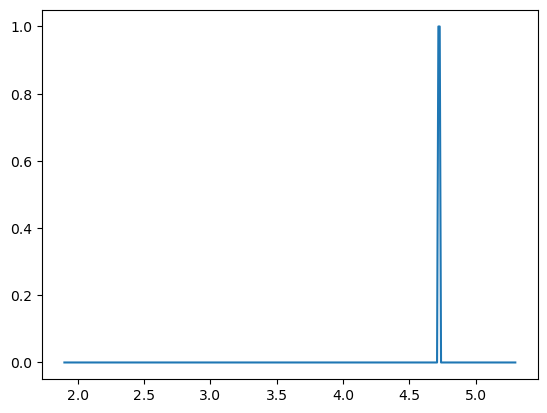

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


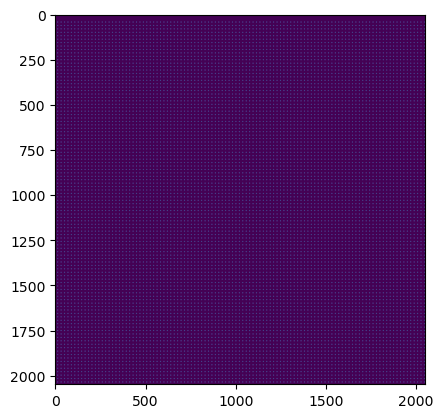

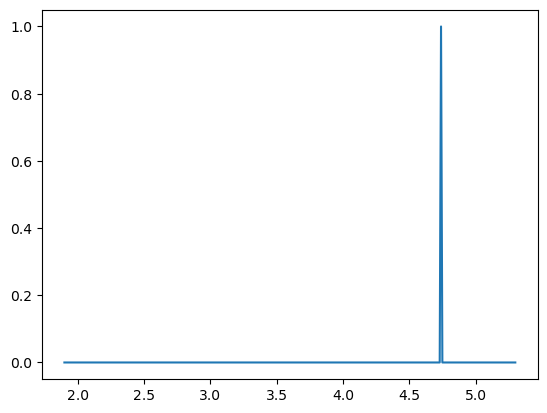

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


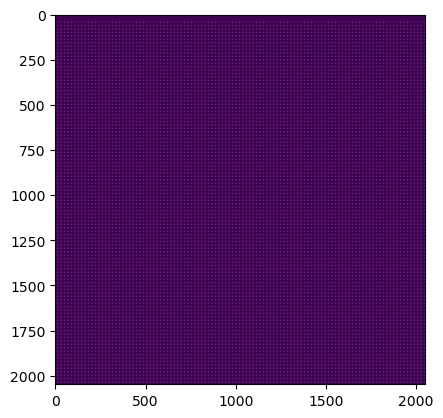

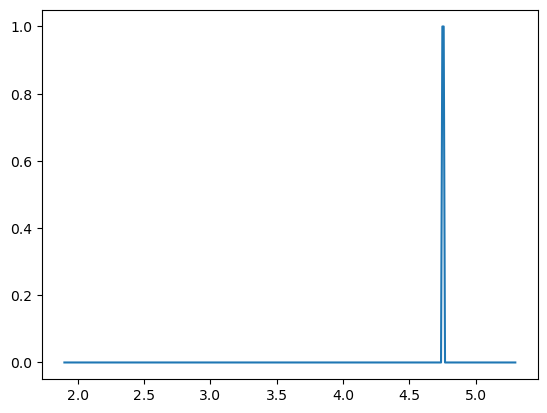

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


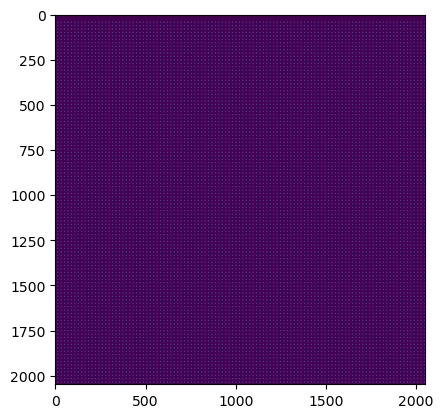

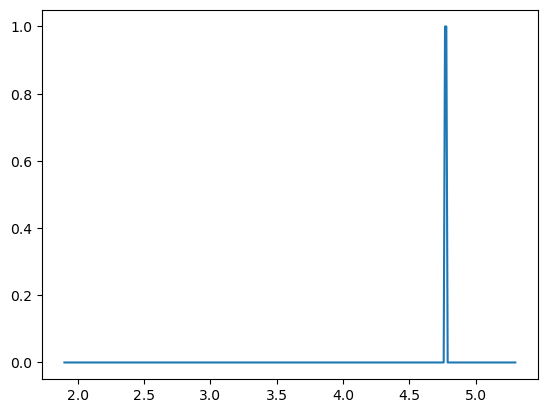

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


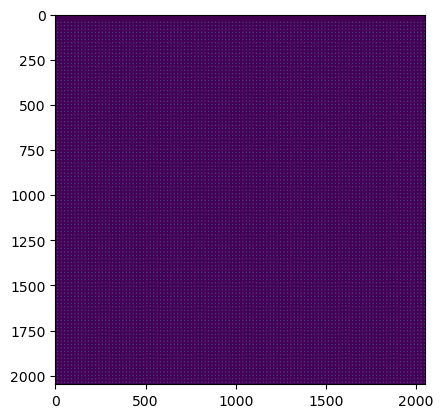

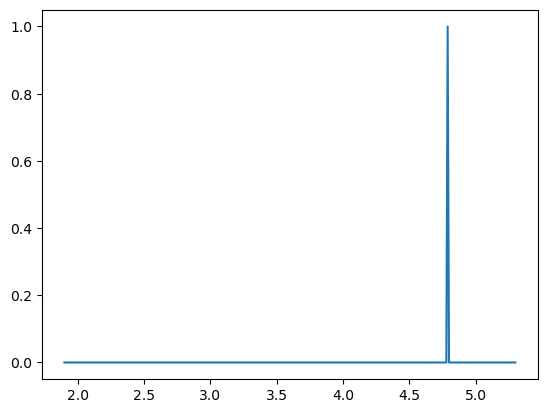

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


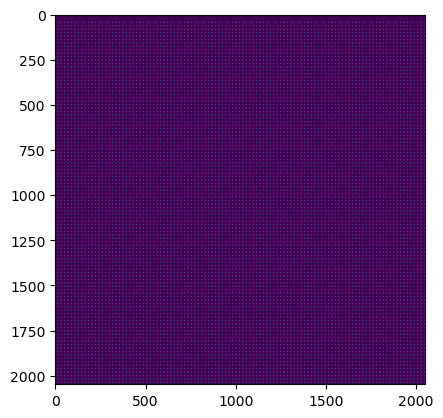

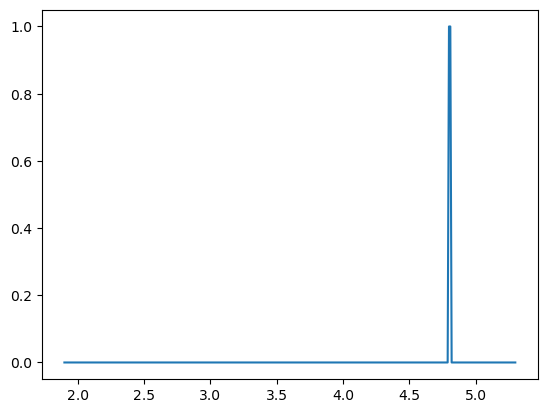

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


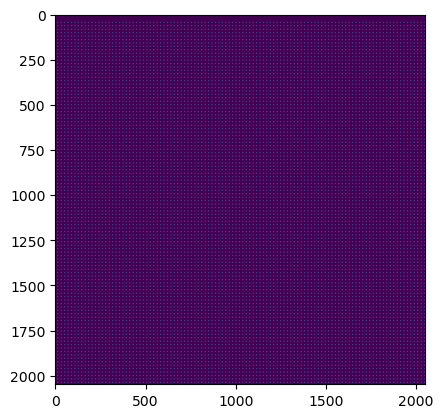

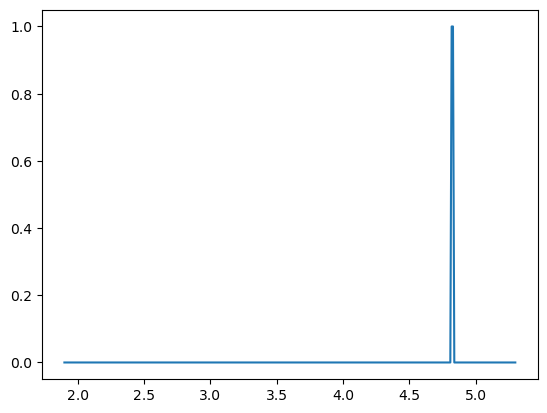

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


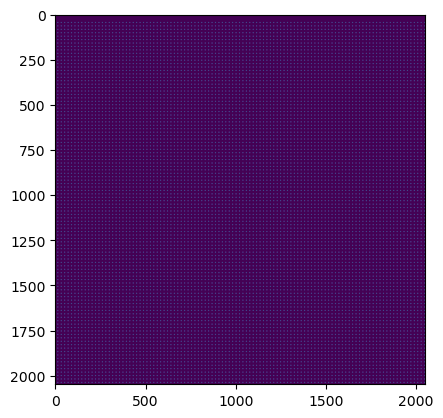

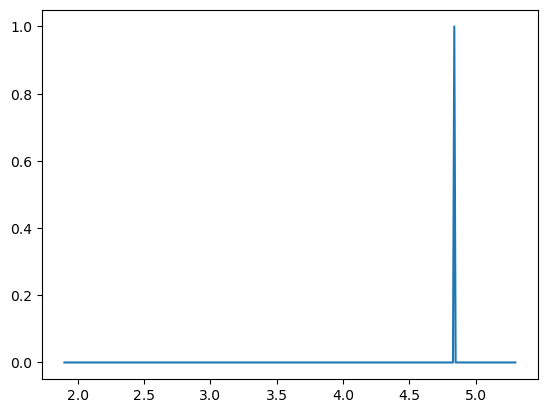

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


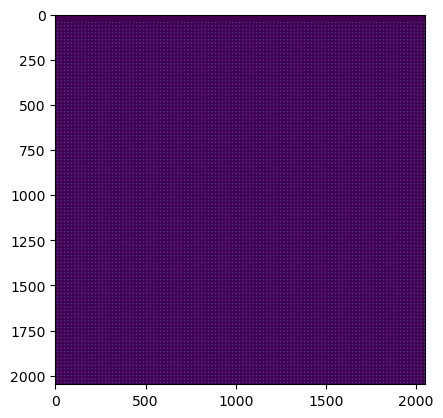

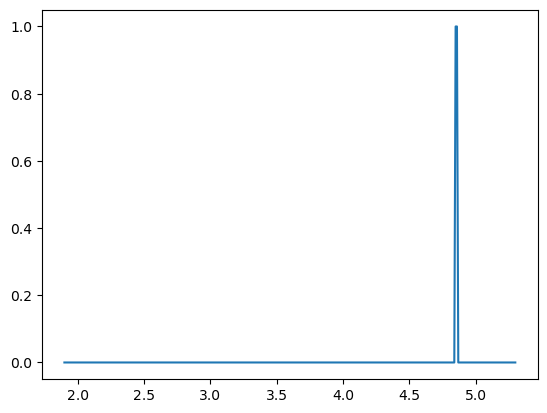

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


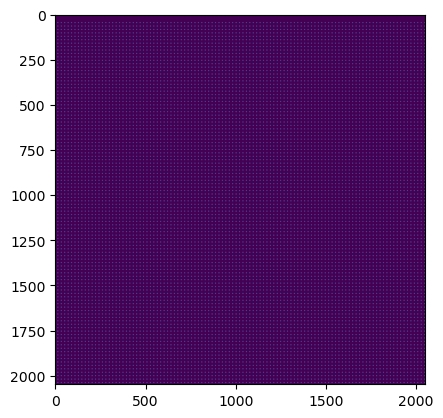

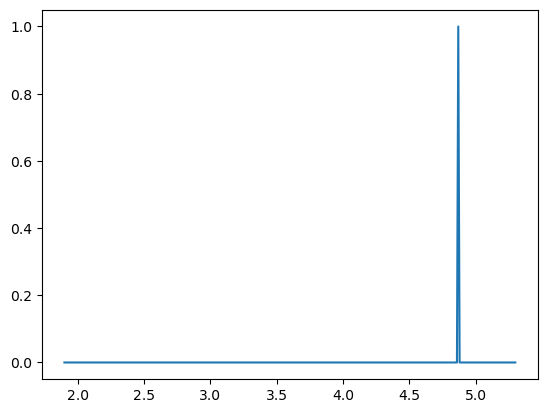

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


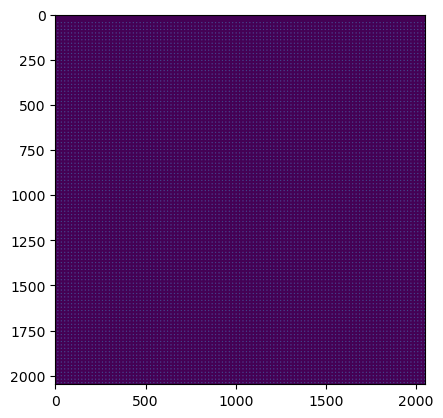

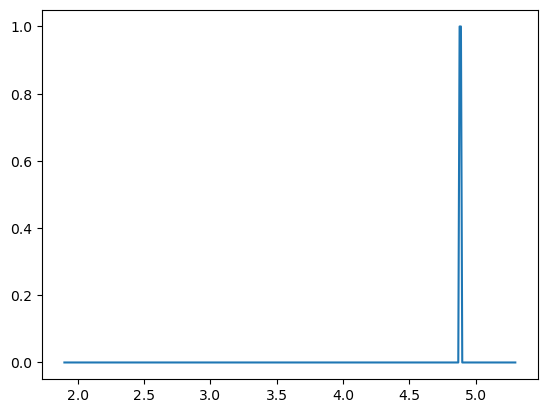

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


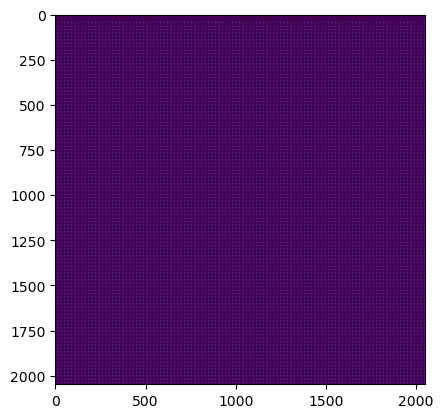

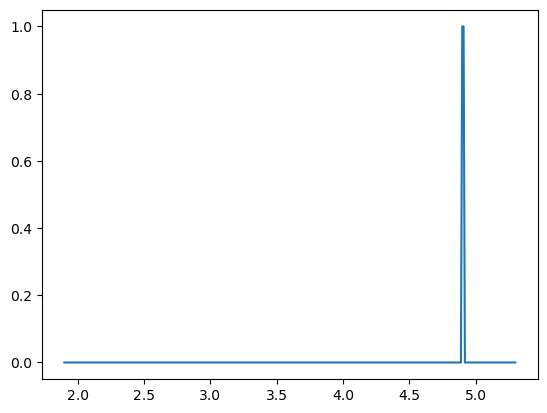

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


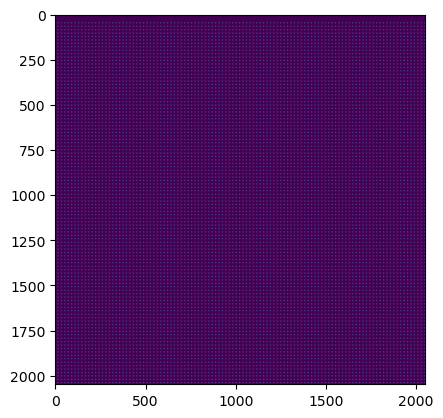

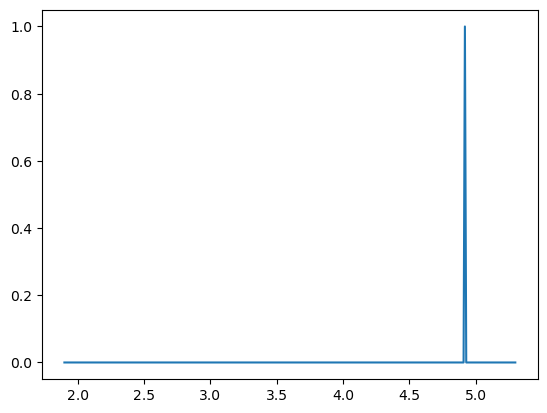

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


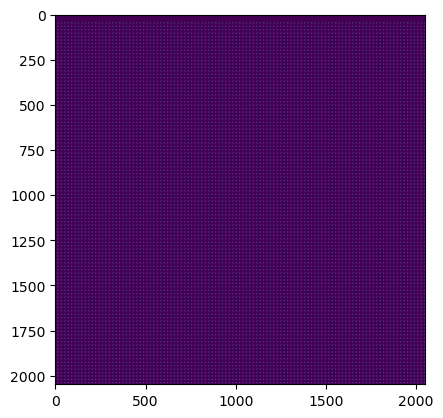

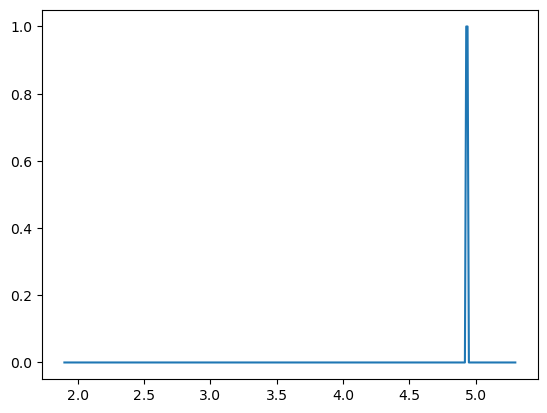

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


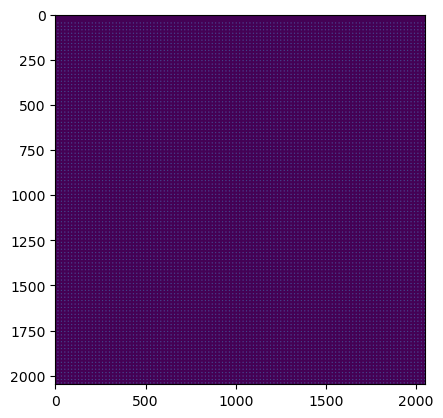

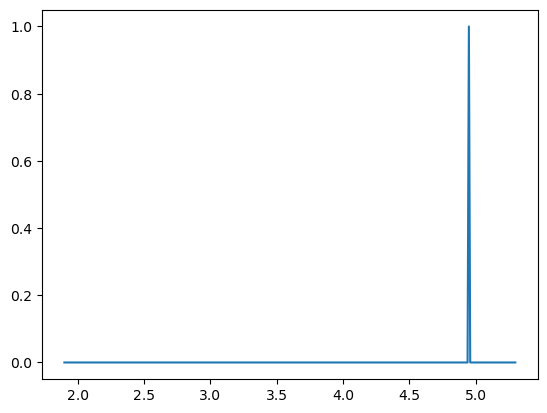

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


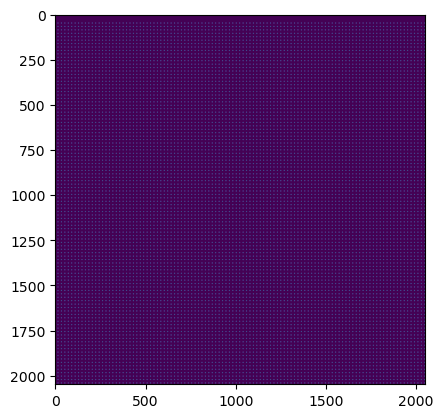

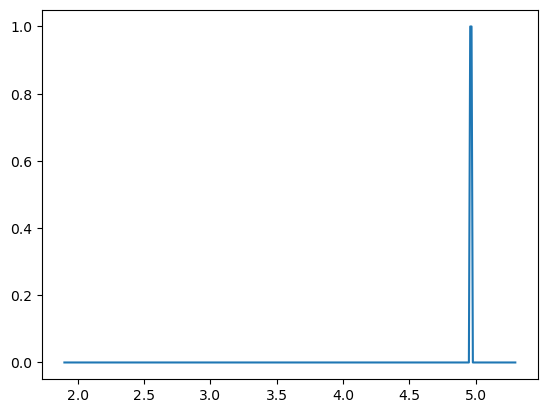

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


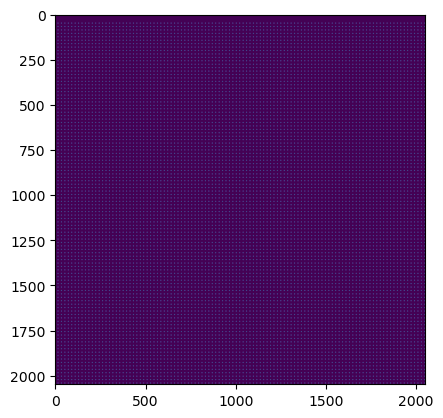

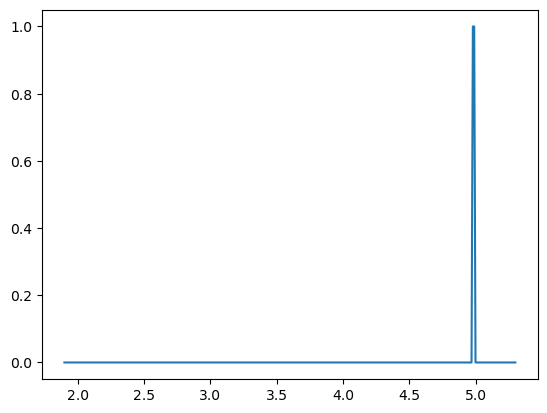

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


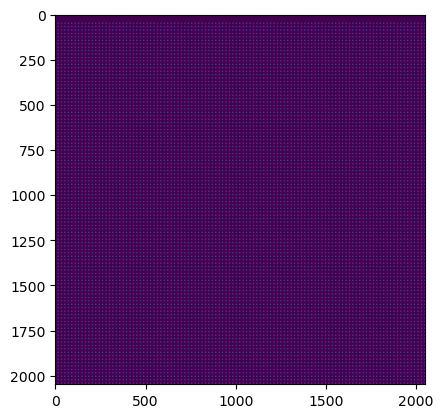

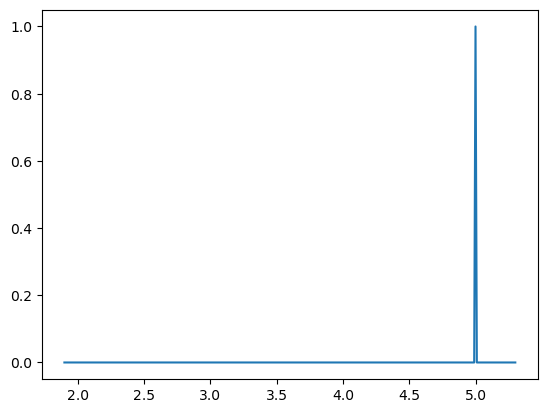

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


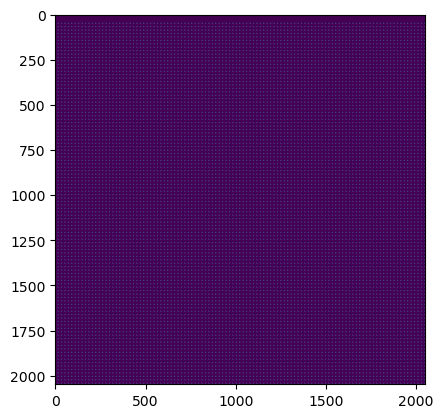

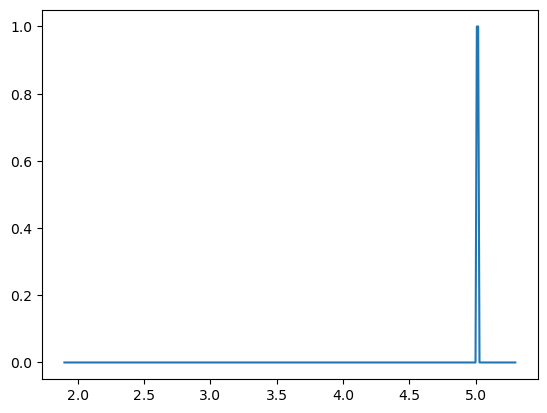

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


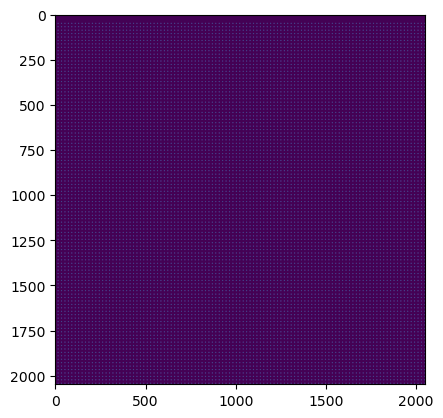

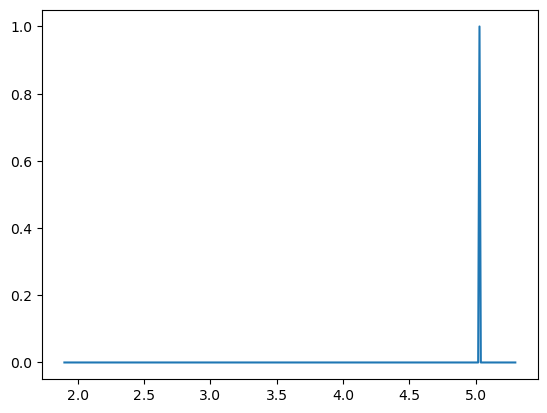

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


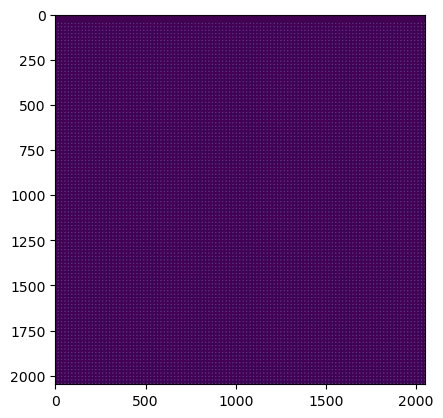

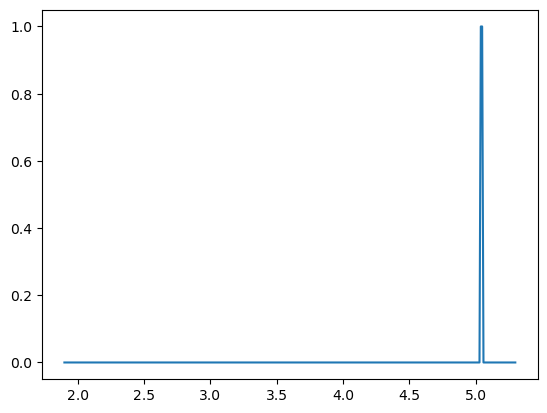

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


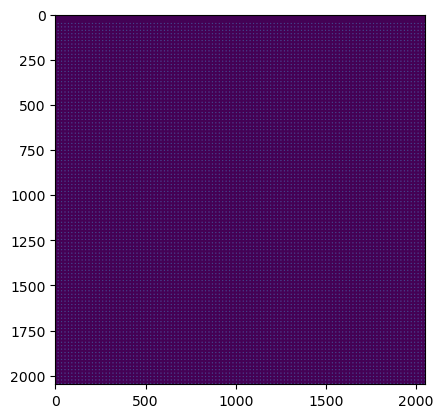

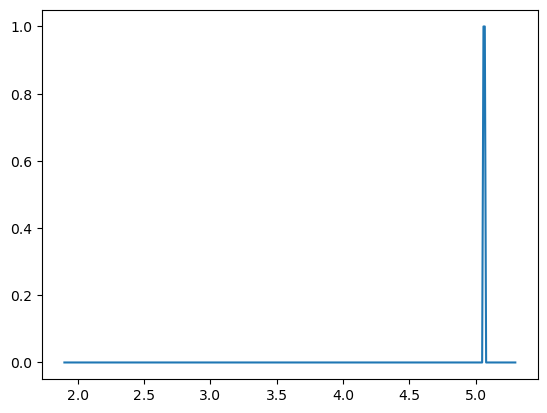

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


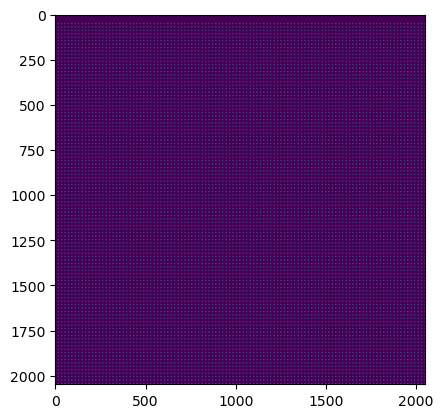

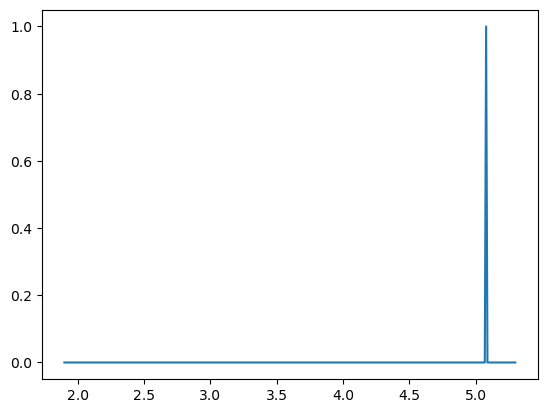

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


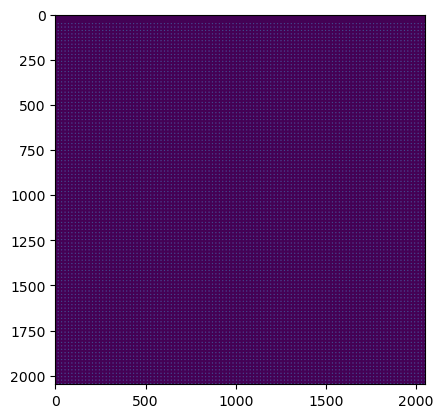

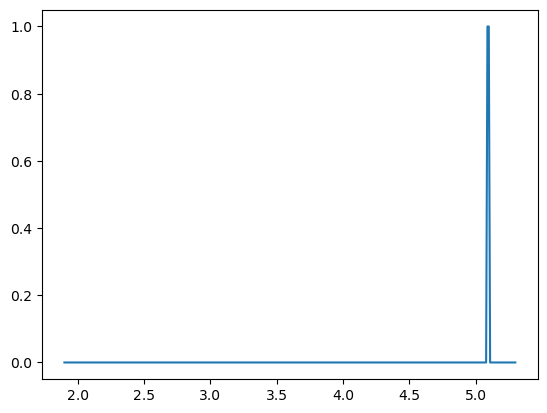

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


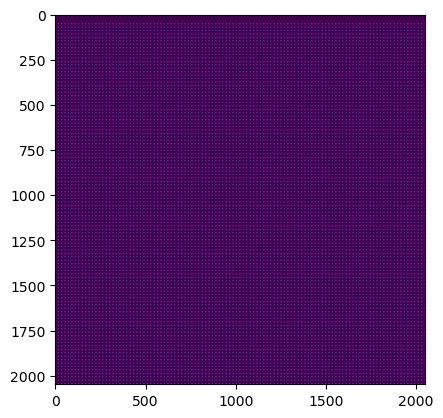

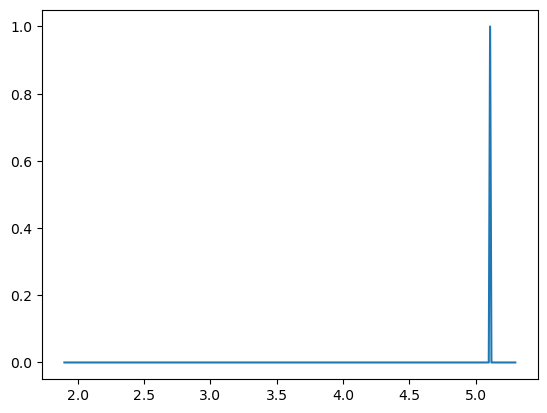

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


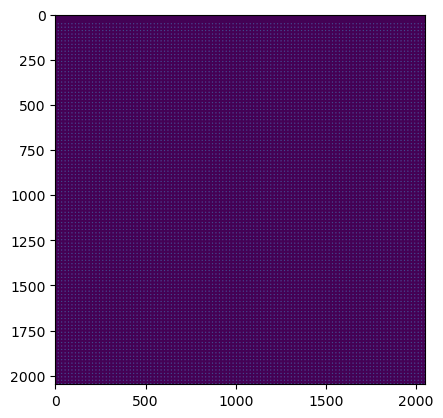

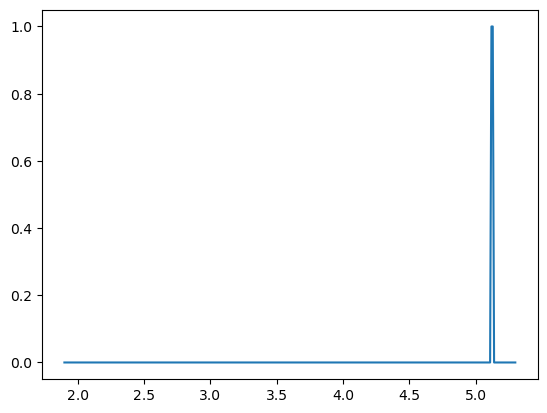

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


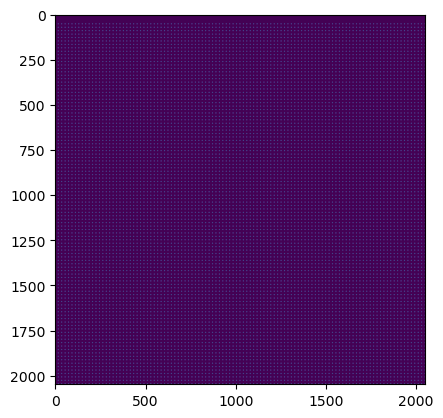

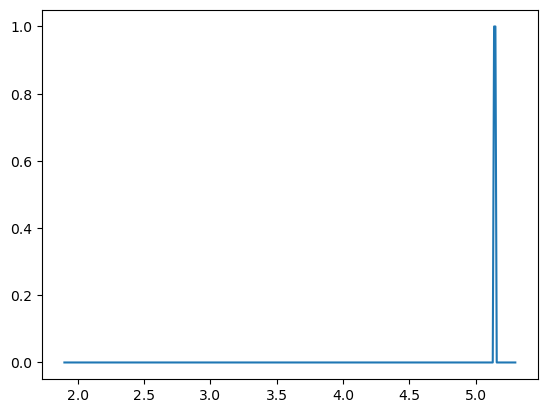

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


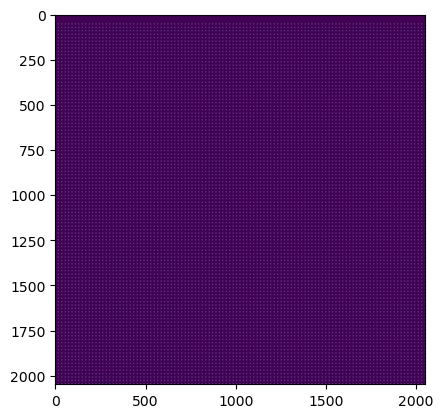

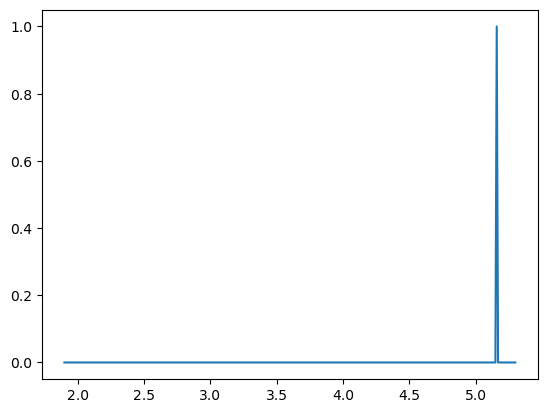

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


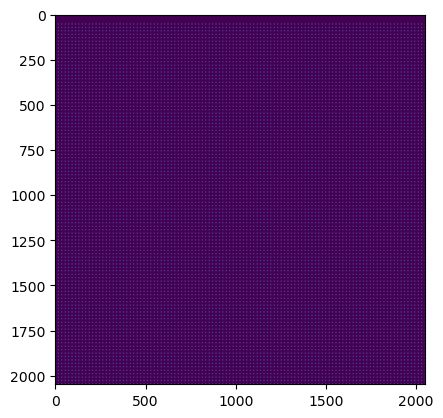

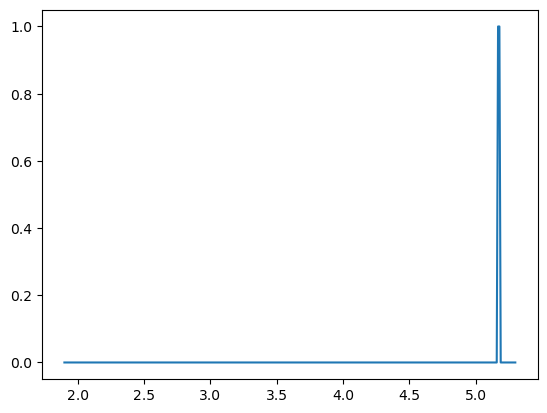

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


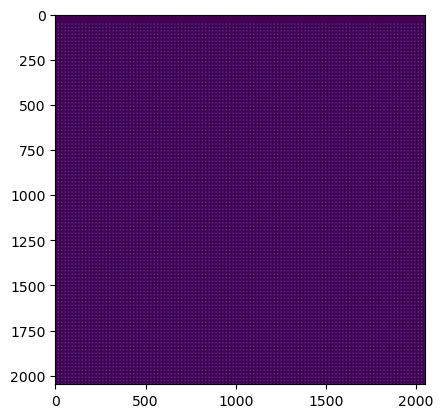

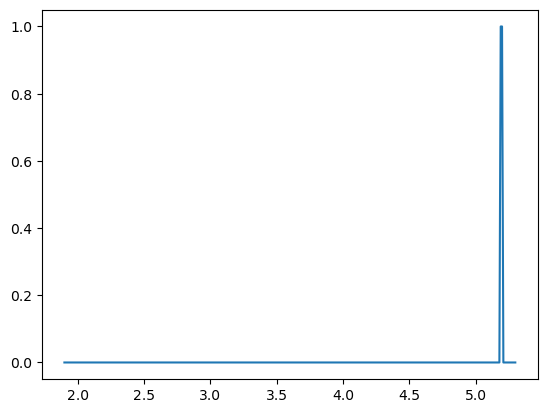

Label(value='Progress: 0 of 1 images')

IntProgress(value=0, max=1)

Label(value='Progress: 0 of 11664 lenslets')

IntProgress(value=0, max=11664)

(array([], dtype=int64), array([], dtype=int64), array([], dtype=int64))


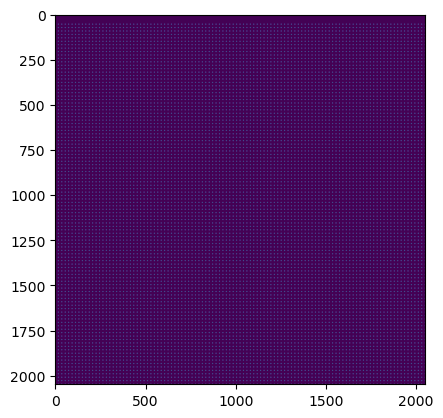

In [16]:
for i in range(ncal-1):
    ####set up calibration source as cube
    lcal_min = wav_bounds[i]
    lcal_max = wav_bounds[i+1]
    fcal = 1.0 ###cal flux in erg / s / cm^2 / um

    I_lam = np.zeros(len(wav))
    I_lam[np.where(wav>lcal_min)] = fcal
    I_lam[np.where(wav>lcal_max)] = 0.0
    f = plt.figure()
    plt.plot(wav,I_lam)
    plt.show()
    scene_conv = np.ones([341,108,108])*I_lam.reshape([341,1,1])
    scene_conv = scene_conv*u.erg / u.cm**2 / u.micron / u.s


    calim = sim.image(cube_in=scene_conv,verbose=True,skytransoff=True,bkg_off=True,shot_off=True,hxrg_off=True)

    plt.imshow(calim[0])
    plt.show()
    rawfile = odir+'calibration_'+str(sim.wav_min)+'_'+str(sim.wav_max)+'_'+str(np.mean([lcal_min,lcal_max]))+'.fits'
    pyfits.writeto(rawfile,np.array(calim),overwrite=True)

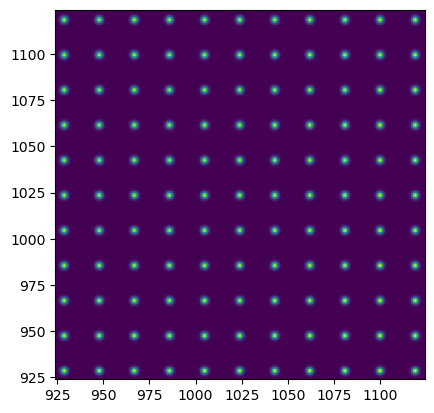

In [17]:
plt.imshow(calim[0])
plt.xlim(924,1124)
plt.ylim(924,1124)
plt.show()